In [2]:
%pip install wordcloud
%pip install catboost

   ---------------------------------------- 0.0/301.4 kB ? eta -:--:--
   ---- ----------------------------------- 30.7/301.4 kB 1.3 MB/s eta 0:00:01
   --------------------------------- ------ 256.0/301.4 kB 3.9 MB/s eta 0:00:01
   ---------------------------------------- 301.4/301.4 kB 3.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
   ---------------------------------------- 0.0/101.1 MB ? eta -:--:--
   ---------------------------------------- 0.2/101.1 MB 3.3 MB/s eta 0:00:31
   ---------------------------------------- 0.6/101.1 MB 7.9 MB/s eta 0:00:13
   ---------------------------------------- 1.1/101.1 MB 9.1 MB/s eta 0:00:11
    --------------------------------------- 1.7/101.1 MB 9.8 MB/s eta 0:00:11
    --------------------------------------- 2.3/101.1 MB 10.2 MB/s eta 0:00:10
   - -------------------------------------- 2.8/101.1 MB 10.3 MB/s eta 0:00:10
   - -------------------------------------- 3.3/101.1 MB 10.4 MB/s eta 0:00:10
   -

In [1]:
#import
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from wordcloud import WordCloud
from sklearn.model_selection import train_test_split

In [2]:
#read file
df = pd.read_csv('Chicago_Crimes_2012_to_2017.csv')

df.head()

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,3,10508693,HZ250496,05/03/2016 11:40:00 PM,013XX S SAWYER AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,...,24.0,29.0,08B,1154907.0,1893681.0,2016,05/10/2016 03:56:50 PM,41.864073,-87.706819,"(41.864073157, -87.706818608)"
1,89,10508695,HZ250409,05/03/2016 09:40:00 PM,061XX S DREXEL AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,...,20.0,42.0,08B,1183066.0,1864330.0,2016,05/10/2016 03:56:50 PM,41.782922,-87.604363,"(41.782921527, -87.60436317)"
2,197,10508697,HZ250503,05/03/2016 11:31:00 PM,053XX W CHICAGO AVE,0470,PUBLIC PEACE VIOLATION,RECKLESS CONDUCT,STREET,False,...,37.0,25.0,24,1140789.0,1904819.0,2016,05/10/2016 03:56:50 PM,41.894908,-87.758372,"(41.894908283, -87.758371958)"
3,673,10508698,HZ250424,05/03/2016 10:10:00 PM,049XX W FULTON ST,0460,BATTERY,SIMPLE,SIDEWALK,False,...,28.0,25.0,08B,1143223.0,1901475.0,2016,05/10/2016 03:56:50 PM,41.885687,-87.749516,"(41.885686845, -87.749515983)"
4,911,10508699,HZ250455,05/03/2016 10:00:00 PM,003XX N LOTUS AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,...,28.0,25.0,06,1139890.0,1901675.0,2016,05/10/2016 03:56:50 PM,41.886297,-87.761751,"(41.886297242, -87.761750709)"


# Data Understanding

Statistical summary

In [ ]:
summary = df.describe()

print(summary.to_string())

Check missing values

In [56]:
df.isnull().sum()

Unnamed: 0                  0
ID                          0
Case Number                 1
Date                        0
Block                       0
IUCR                        0
Primary Type                0
Description                 0
Location Description     1658
Arrest                      0
Domestic                    0
Beat                        0
District                    1
Ward                       14
Community Area             40
FBI Code                    0
X Coordinate            37083
Y Coordinate            37083
Year                        0
Updated On                  0
Latitude                37083
Longitude               37083
Location                37083
geometry                    0
index_right             40789
community               40789
Region                  80808
Day                         0
Month                       0
Time                        0
Day_of_Week                 0
Hour                        0
Time_of_Day                 0
dtype: int

Count for each crime types


In [ ]:

primary_type_counts = df["Primary Type"].value_counts()

plt.figure(figsize=(15, 8))

primary_type_counts.plot(kind='bar')  

plt.title('Number of Incidents by Primary Type')  
plt.xlabel('Primary Type') 
plt.ylabel('Number of Incidents') 

for i, count in enumerate(primary_type_counts):
    plt.text(i, count + 0.1, str(count), ha='center', va='bottom')
    
plt.tight_layout()  
plt.show()  

Count for the location Description

In [ ]:
location_descriptions = df['Location Description'].astype(str)

text = ' '.join(location_descriptions)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Location Descriptions')
plt.axis('off') 
plt.show()

Count for the Arrest

In [ ]:
arrest_counts = df["Arrest"].value_counts()

plt.figure(figsize=(8, 8))

arrest_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90)

plt.title('Arrest Distribution')
plt.ylabel('')
plt.axis('equal') 
plt.tight_layout()
plt.show()

Count for Domestic

In [ ]:
domestic_counts = df["Domestic"].value_counts()

# Specify colors for each category
colors = ['lightcoral', 'skyblue']

# Plot the donut chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(domestic_counts, labels=None, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops=dict(width=0.4), pctdistance=0.8, textprops=dict(color="black"))
plt.title('Donut Chart for Domestic Distribution')

# Add legend
plt.legend(wedges, domestic_counts.index, title="Domestic", loc="upper right")

plt.axis('equal')
plt.show()



Each district have how many cases

In [ ]:
district_counts = df["District"].value_counts()

district_counts_sorted = district_counts.sort_index()

plt.figure(figsize=(12, 6))
district_counts_sorted.plot(kind='bar')
plt.title('Number of Cases by District')
plt.xlabel('District')
plt.ylabel('Number of Cases')
plt.xticks(rotation=45)

for i, count in enumerate(district_counts_sorted):
    plt.text(i, count, str(count), ha='center', va='bottom', fontsize=8, color='black')


plt.show()

Each ward have how many cases

In [ ]:


ward_counts = df["Ward"].value_counts().sort_index()

plt.figure(figsize=(10, 6))
ward_counts.plot(kind='line', marker='o', color='b', linestyle='-')
plt.title('Value Counts of Ward')
plt.xlabel('Ward')
plt.ylabel('Count')
plt.tight_layout()

for i, count in enumerate(ward_counts):
    plt.text(i, count, int(ward_counts.index[i]), ha='center', va='bottom', fontsize=8, color='black')  

plt.show()

Each community area have how many cases

In [ ]:
plt.figure(figsize=(12, 6))

# Counting the occurrences of each Community Area
area_counts = df["Community Area"].value_counts()

# Plotting the bar chart
plt.bar(area_counts.index, area_counts.values, color='skyblue', edgecolor='black')

plt.title('Bar Chart of Community Areas')
plt.xlabel('Community Area')
plt.ylabel('Frequency')
plt.grid(False)


plt.show()

Count the occurrences of each FBI Code category

In [ ]:
fbi_code_counts = df["FBI Code"].value_counts()

colors = plt.cm.tab20b.colors[:len(fbi_code_counts)]

plt.figure(figsize=(15, 8))
plt.pie(fbi_code_counts, labels=['']*len(fbi_code_counts), autopct=lambda p: '{:.1f}%'.format(p) if p > 2 else '', startangle=90, colors=colors)
plt.title('Pie Chart of FBI Code Counts')
plt.axis('equal')

legend_labels = [f'{label} ({count})' for label, count in zip(fbi_code_counts.index, fbi_code_counts)]
plt.legend(title="FBI Code", loc="upper right", labels=legend_labels)

plt.show()

Scatter plot of X and Y Coordinate

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(df["X Coordinate"], df["Y Coordinate"], alpha=0.5)  
plt.title('Scatter Plot of X Coordinate vs Y Coordinate')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.show()

Scatter plot of X and Y Coordinate (not including coordinate 0)

In [ ]:
filtered_df = df[(df["X Coordinate"] != 0) & (df["Y Coordinate"] != 0)]

plt.figure(figsize=(10, 6))
plt.scatter(filtered_df["X Coordinate"], filtered_df["Y Coordinate"], alpha=0.5)  # alpha controls transparency
plt.title('Scatter Plot of X Coordinate vs Y Coordinate (Excluding 0,0)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.show()

Map

In [94]:
import folium
from folium import plugins

data_2000 = df[:5000]
Long = data_2000['Longitude'].mean()
Lat = data_2000['Latitude'].mean()
data_map = folium.Map([Lat, Long], zoom_start=12)

data_crime_map = plugins.MarkerCluster().add_to(data_map)
for lat, lon, label in zip(data_2000['Latitude'], data_2000['Longitude'], data_2000['Primary Type']):
    folium.Marker(location=[lat, lon], icon=None, popup=label).add_to(data_crime_map)
data_map.add_child(data_crime_map)

data_map

In [100]:
map_chicago = folium.Map([41.8781, -87.6298], zoom_start=12)
crime_new = pd.DataFrame({"Lat": df['Latitude'], "Long": df['Longitude']})
crime_new = crime_new[:20000]
map_chicago.add_child(plugins.HeatMap(data=crime_new.values, radius=15))
map_chicago


***Divide Community

In [3]:
#Divide regions

import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Load the community areas shapefile (replace with actual file path)
community_areas_shapefile = "geo_export_559c718c-fddd-43d7-9ee2-1a8fb22b38e8.shp"

# Assuming 'df' is your original DataFrame containing latitude and longitude columns

# Create Point geometries from coordinates
df["geometry"] = df.apply(lambda row: Point(row["Longitude"], row["Latitude"]), axis=1)

# Create a GeoDataFrame from the sample data
gdf_sample = gpd.GeoDataFrame(df, geometry="geometry")

# Load the community areas shapefile
gdf_community_areas = gpd.read_file(community_areas_shapefile)

# Perform spatial join directly on the original DataFrame
df = gpd.sjoin(gdf_sample, gdf_community_areas[['community', 'geometry']], how="left", op="within")

df.head()



c:\Users\yibei\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3466: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\yibei\AppData\Local\Temp\ipykernel_30520\481331321.py:22: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: GEOGCS["WGS84(DD)",DATUM["WGS84",SPHEROID["WGS84", ...

  df = gpd.sjoin(gdf_sample, gdf_community_areas[['community', 'geometry']], how="left", op="within")


,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,geometry,index_right,community
0,3,10508693,HZ250496,05/03/2016 11:40:00 PM,013XX S SAWYER AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,...,1154907.0,1893681.0,2016,05/10/2016 03:56:50 PM,41.864073,-87.706819,"(41.864073157, -87.706818608)",POINT (-87.70682 41.86407),29.0,NORTH LAWNDALE
1,89,10508695,HZ250409,05/03/2016 09:40:00 PM,061XX S DREXEL AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,...,1183066.0,1864330.0,2016,05/10/2016 03:56:50 PM,41.782922,-87.604363,"(41.782921527, -87.60436317)",POINT (-87.60436 41.78292),8.0,WOODLAWN
2,197,10508697,HZ250503,05/03/2016 11:31:00 PM,053XX W CHICAGO AVE,0470,PUBLIC PEACE VIOLATION,RECKLESS CONDUCT,STREET,False,...,1140789.0,1904819.0,2016,05/10/2016 03:56:50 PM,41.894908,-87.758372,"(41.894908283, -87.758371958)",POINT (-87.75837 41.89491),25.0,AUSTIN
3,673,10508698,HZ250424,05/03/2016 10:10:00 PM,049XX W FULTON ST,0460,BATTERY,SIMPLE,SIDEWALK,False,...,1143223.0,1901475.0,2016,05/10/2016 03:56:50 PM,41.885687,-87.749516,"(41.885686845, -87.749515983)",POINT (-87.74952 41.88569),25.0,AUSTIN
4,911,10508699,HZ250455,05/03/2016 10:00:00 PM,003XX N LOTUS AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,...,1139890.0,1901675.0,2016,05/10/2016 03:56:50 PM,41.886297,-87.761751,"(41.886297242, -87.761750709)",POINT (-87.76175 41.88630),25.0,AUSTIN


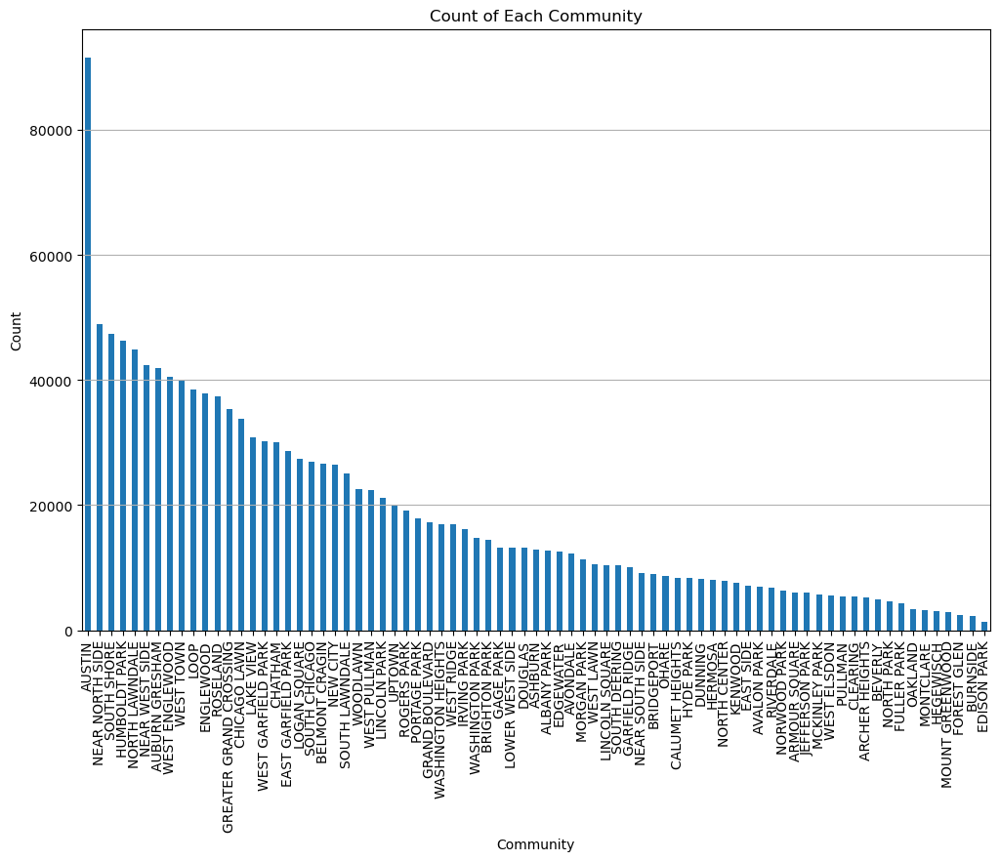

In [4]:
# Group by community and count occurrences
community_counts = df['community'].value_counts()

# Plotting
plt.figure(figsize=(12, 8))
community_counts.plot(kind='bar')
plt.title('Count of Each Community')
plt.xlabel('Community')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y')  # Add gridlines along the y-axis
plt.show()

***Divide Regions

In [4]:
# Define a dictionary mapping each community to its corresponding region
community_to_region = {
    "LOOP": "Central",
    "NEAR NORTH SIDE": "Central",
    "NEAR WEST SIDE": "Central",
    "WEST TOWN": "Central",
    "EDGEWATER": "Far North Side",
    "NORWOOD PARK": "Far North Side",
    "LINCOLN PARK": "Far North Side",
    "UPTOWN": "Far North Side",
    "ROGERS PARK": "Far North Side",
    "WEST RIDGE": "Far North Side",
    "SOUTH DEERING": "Far Southeast Side",
    "HEGEWISCH": "Far Southeast Side",
    "EAST SIDE": "Far Southeast Side",
    "MOUNT GREENWOOD": "Far Southwest Side",
    "LAKE VIEW": "North Side",
    "NORTH CENTER": "North Side",
    "AVONDALE": "Northwest Side",
    "LOGAN SQUARE": "Northwest Side",
    "PORTAGE PARK": "Northwest Side",
    "IRVING PARK": "Northwest Side",
    "JEFFERSON PARK": "Northwest Side",
    "WOODLAWN": "South Side",
    "CHATHAM": "South Side",
    "DOUGLAS": "South Side",
    "GRAND BOULEVARD": "South Side",
    "WEST ENGLEWOOD": "South Side",
    "SOUTH SHORE": "South Side",
    "WASHINGTON PARK": "South Side",
    "WASHINGTON HEIGHTS": "South Side",
    "KENWOOD": "South Side",
    "HYDE PARK": "South Side",
    "AUBURN GRESHAM": "South Side",
    "ROSELAND": "South Side",
    "NEW CITY": "South Side",
    "RIVERDALE": "South Side",
    "SOUTH CHICAGO": "South Side",
    "ENGLEWOOD": "South Side",
    "AVALON PARK": "South Side",
    "GREATER GRAND CROSSING": "South Side",
    "LOWER WEST SIDE": "South Side",
    "OAKLAND": "South Side",
    "MORGAN PARK": "South Side",
    "WEST LAWN": "South Side",
    "DUNNING": "South Side",
    "NEAR SOUTH SIDE": "South Side",
    "FULLER PARK": "South Side",
    "WEST PULLMAN": "South Side",
    "PULLMAN": "South Side",
    "CALUMET HEIGHTS": "South Side",
    "WEST ELSDON": "South Side",
    "EAST GARFIELD PARK": "South Side",
    "BURNSIDE": "South Side",
    "CHICAGO LAWN": "Southwest Side",
    "BRIGHTON PARK": "Southwest Side",
    "GAGE PARK": "Southwest Side",
    "SOUTH LAWNDALE": "Southwest Side",
    "ARCHER HEIGHTS": "Southwest Side",
    "ASHBURN": "Southwest Side",
    "WEST GARFIELD PARK": "Southwest Side",
    "CLEARING": "Southwest Side",
    "BEVERLY": "Southwest Side",
    "HUMBOLDT PARK": "West Side",
    "BELMONT CRAGIN": "West Side",
    "MCKINLEY PARK": "West Side",
    "WEST GARFIELD PARK": "West Side",
    "AUSTIN": "West Side",
    "GARFIELD RIDGE": "West Side",
    "LOWER WEST SIDE": "West Side",
    "PORTAGE PARK": "West Side",
    "NORTH LAWNDALE": "West Side",
    "HERMOSA": "West Side",
    "MONTCLARE": "West Side",
    "ALBANY PARK": "West Side",
    "FOREST GLEN": "West Side",
}

# Use the dictionary to create a new column representing the region for each community
df["Region"] = df["community"].map(community_to_region)


df.head()

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,geometry,index_right,community,Region
0,3,10508693,HZ250496,05/03/2016 11:40:00 PM,013XX S SAWYER AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,...,1893681.0,2016,05/10/2016 03:56:50 PM,41.864073,-87.706819,"(41.864073157, -87.706818608)",POINT (-87.70682 41.86407),29.0,NORTH LAWNDALE,West Side
1,89,10508695,HZ250409,05/03/2016 09:40:00 PM,061XX S DREXEL AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,...,1864330.0,2016,05/10/2016 03:56:50 PM,41.782922,-87.604363,"(41.782921527, -87.60436317)",POINT (-87.60436 41.78292),8.0,WOODLAWN,South Side
2,197,10508697,HZ250503,05/03/2016 11:31:00 PM,053XX W CHICAGO AVE,0470,PUBLIC PEACE VIOLATION,RECKLESS CONDUCT,STREET,False,...,1904819.0,2016,05/10/2016 03:56:50 PM,41.894908,-87.758372,"(41.894908283, -87.758371958)",POINT (-87.75837 41.89491),25.0,AUSTIN,West Side
3,673,10508698,HZ250424,05/03/2016 10:10:00 PM,049XX W FULTON ST,0460,BATTERY,SIMPLE,SIDEWALK,False,...,1901475.0,2016,05/10/2016 03:56:50 PM,41.885687,-87.749516,"(41.885686845, -87.749515983)",POINT (-87.74952 41.88569),25.0,AUSTIN,West Side
4,911,10508699,HZ250455,05/03/2016 10:00:00 PM,003XX N LOTUS AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,...,1901675.0,2016,05/10/2016 03:56:50 PM,41.886297,-87.761751,"(41.886297242, -87.761750709)",POINT (-87.76175 41.88630),25.0,AUSTIN,West Side


Count the occurrences of each region

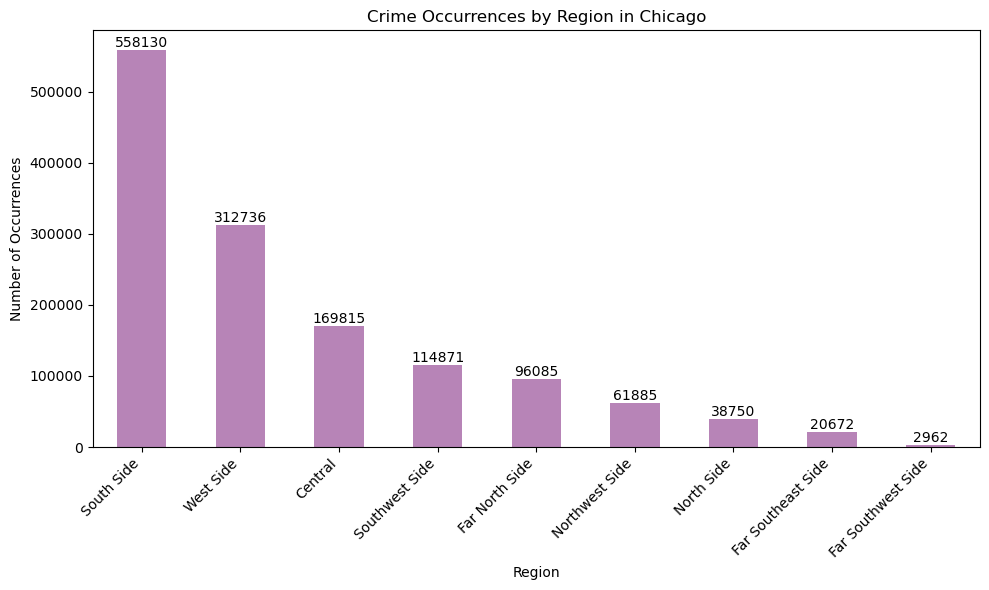

In [10]:
region_counts = df["Region"].value_counts()

# Plot the bar chart
plt.figure(figsize=(10, 6))
region_counts.plot(kind='bar', color='#B784B7')
plt.title('Crime Occurrences by Region in Chicago')
plt.xlabel('Region')
plt.ylabel('Number of Occurrences')
plt.xticks(rotation=45, ha='right')

# Add labels to the bars
for i, count in enumerate(region_counts):
    plt.text(i, count + 0.1, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

Number of Incidents by Year


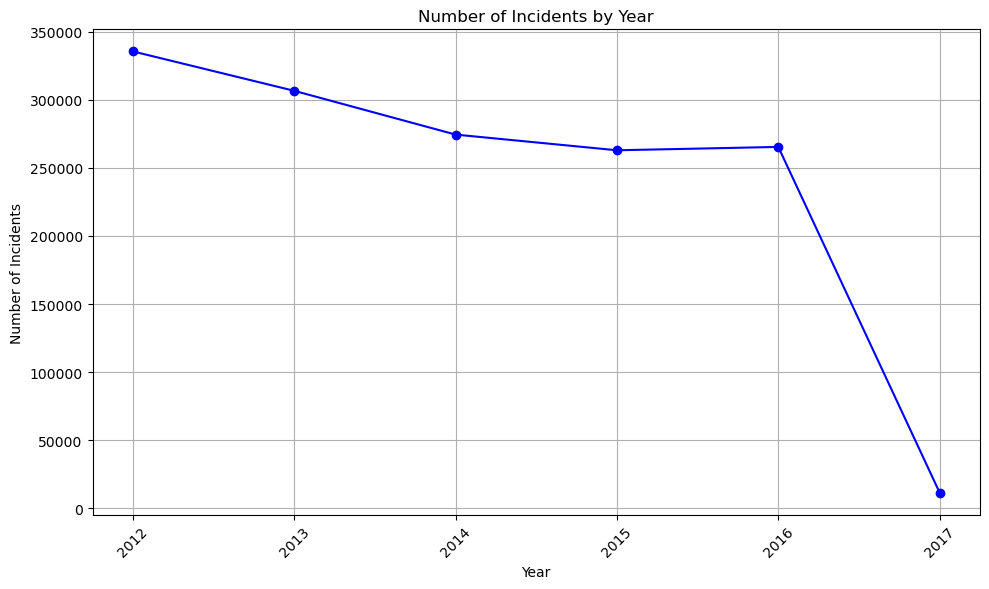

In [11]:
year_counts = df["Year"].value_counts().sort_index()

plt.figure(figsize=(10, 6))
year_counts.plot(kind='line', marker='o', color='b', linestyle='-')
plt.title('Number of Incidents by Year')
plt.xlabel('Year')  
plt.ylabel('Number of Incidents')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

***Extract day, month, year, and time components

In [5]:
df["Date"] = pd.to_datetime(df["Date"])

df["Day"] = df["Date"].dt.day
df["Month"] = df["Date"].dt.month
df["Time"] = df["Date"].dt.time
df["Day_of_Week"] = df["Date"].dt.day_name()

def categorize_time(hour):
    if 5 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 17:
        return "Afternoon"
    elif 17 <= hour < 21:
        return "Evening"
    else:
        return "Night"
df["Hour"] = df["Date"].dt.hour
df["Time_of_Day"] = df["Hour"].apply(categorize_time)


df.head()


C:\Users\yibei\AppData\Local\Temp\ipykernel_30520\3148987626.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["Date"] = pd.to_datetime(df["Date"])


,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,geometry,index_right,community,Region,Day,Month,Time,Day_of_Week,Hour,Time_of_Day
0,3,10508693,HZ250496,2016-05-03 23:40:00,013XX S SAWYER AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,...,POINT (-87.70682 41.86407),29.0,NORTH LAWNDALE,West Side,3,5,23:40:00,Tuesday,23,Night
1,89,10508695,HZ250409,2016-05-03 21:40:00,061XX S DREXEL AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,...,POINT (-87.60436 41.78292),8.0,WOODLAWN,South Side,3,5,21:40:00,Tuesday,21,Night
2,197,10508697,HZ250503,2016-05-03 23:31:00,053XX W CHICAGO AVE,0470,PUBLIC PEACE VIOLATION,RECKLESS CONDUCT,STREET,False,...,POINT (-87.75837 41.89491),25.0,AUSTIN,West Side,3,5,23:31:00,Tuesday,23,Night
3,673,10508698,HZ250424,2016-05-03 22:10:00,049XX W FULTON ST,0460,BATTERY,SIMPLE,SIDEWALK,False,...,POINT (-87.74952 41.88569),25.0,AUSTIN,West Side,3,5,22:10:00,Tuesday,22,Night
4,911,10508699,HZ250455,2016-05-03 22:00:00,003XX N LOTUS AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,...,POINT (-87.76175 41.88630),25.0,AUSTIN,West Side,3,5,22:00:00,Tuesday,22,Night


Distribution of Crime Incidents by Year and Month

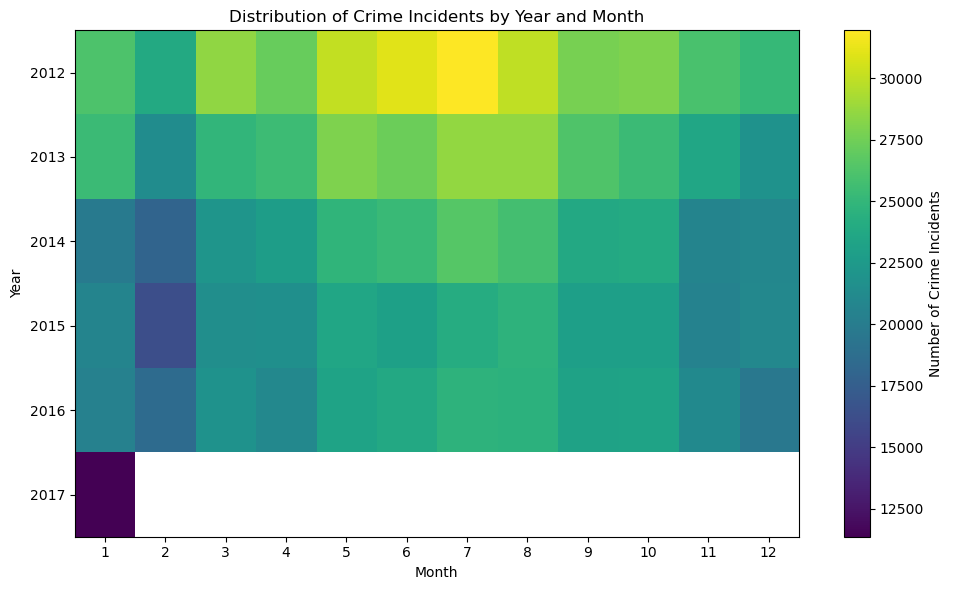

In [44]:
# Group the DataFrame by year and month, and count the number of occurrences
grouped_data = df.groupby(["Year", "Month"]).size().unstack()

# Plot the heatmap
plt.figure(figsize=(10, 6))
plt.imshow(grouped_data, cmap='viridis', aspect='auto')
plt.colorbar(label='Number of Crime Incidents')
plt.xlabel("Month")
plt.ylabel("Year")
plt.title("Distribution of Crime Incidents by Year and Month")
plt.xticks(range(len(grouped_data.columns)), grouped_data.columns)
plt.yticks(range(len(grouped_data.index)), grouped_data.index)
plt.tight_layout()
plt.show()

Distribution of Incidents by Month


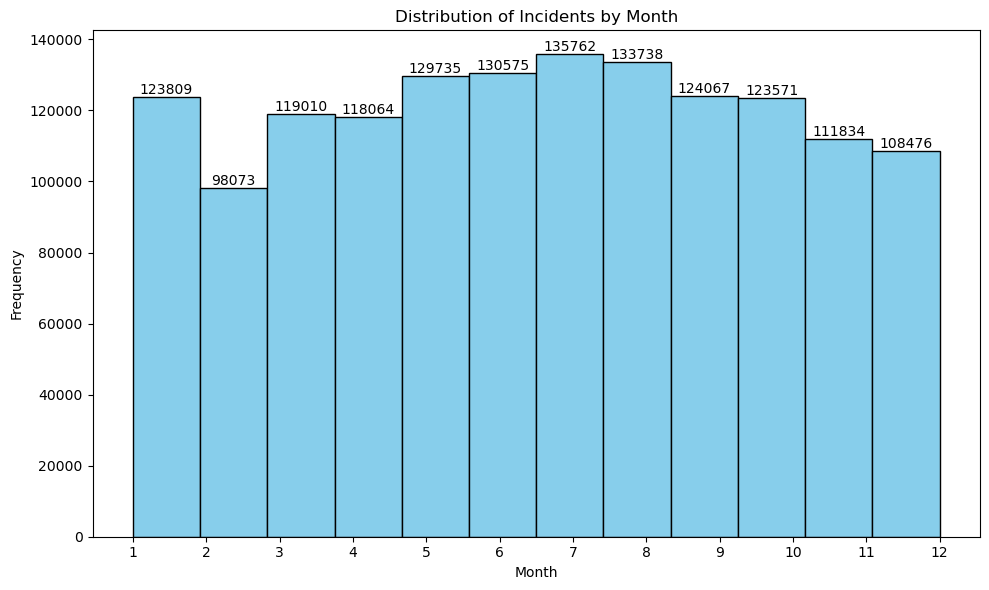

In [15]:
plt.figure(figsize=(10, 6))
month_counts, bins, _ = plt.hist(df["Month"], bins=12, color='skyblue', edgecolor='black')  
plt.title('Distribution of Incidents by Month')
plt.xlabel('Month')
plt.ylabel('Frequency')

for i, count in enumerate(month_counts):
    x = (bins[i] + bins[i+1]) / 2 
    plt.text(x, count, str(int(count)), ha='center', va='bottom')

plt.xticks(range(1, 13))  
plt.tight_layout()
plt.show()

Number of Incidents by Day

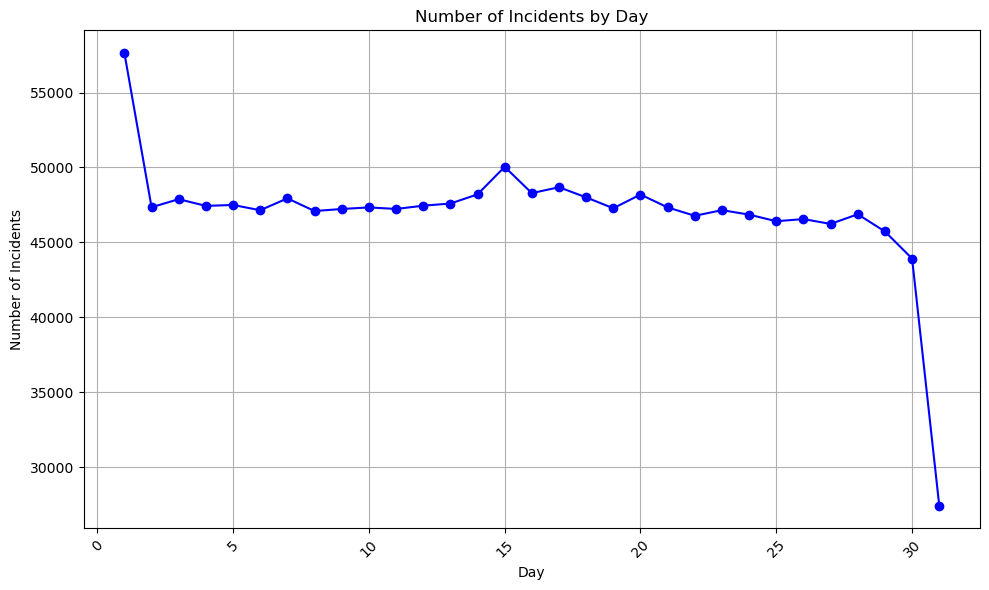

In [16]:
day_counts = df["Day"].value_counts().sort_index()

# Plot a line plot
plt.figure(figsize=(10, 6))
day_counts.plot(kind='line', marker='o', color='b', linestyle='-')
plt.title('Number of Incidents by Day')
plt.xlabel('Day')
plt.ylabel('Number of Incidents')
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

Number of Incidents by Day of Week

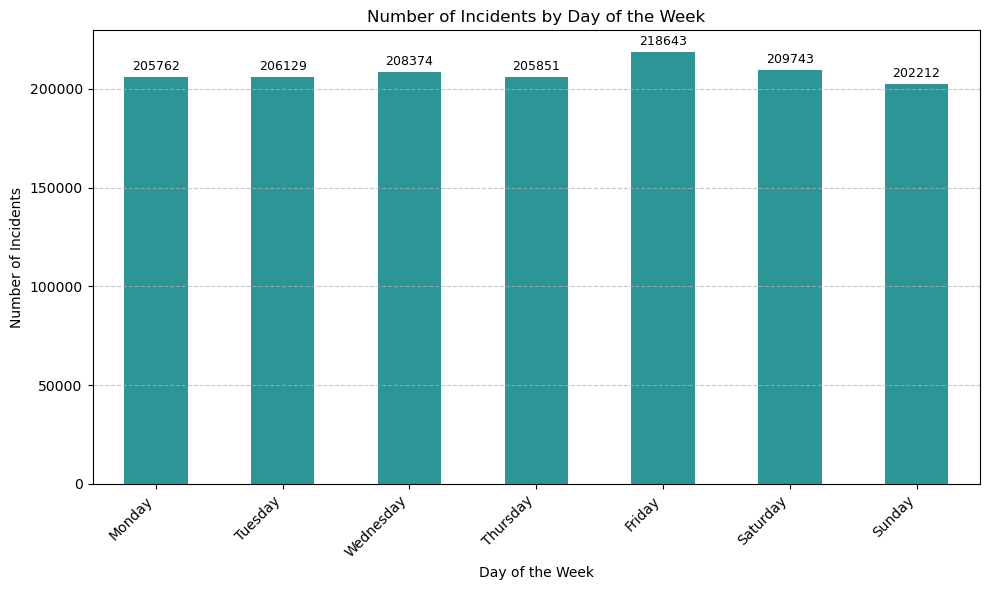

In [17]:
# Create a categorical data type for the days of the week in the desired order
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_dtype = pd.CategoricalDtype(categories=day_order, ordered=True)

# Convert the "Day_of_Week" column to the categorical data type with the specified order
df["Day_of_Week"] = df["Day_of_Week"].astype(day_dtype)

# Group the DataFrame by day of the week and count the number of incidents
day_of_week_counts = df["Day_of_Week"].value_counts().sort_index()

# Plot the bar chart
plt.figure(figsize=(10, 6))
day_of_week_counts.plot(kind='bar', color='#2D9596')
plt.title('Number of Incidents by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45, ha='right')

# Add labels to each bar
for i, count in enumerate(day_of_week_counts):
    plt.text(i, count + 2000, str(count), ha='center', va='bottom', fontsize=9)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Number of Incidents by Hour

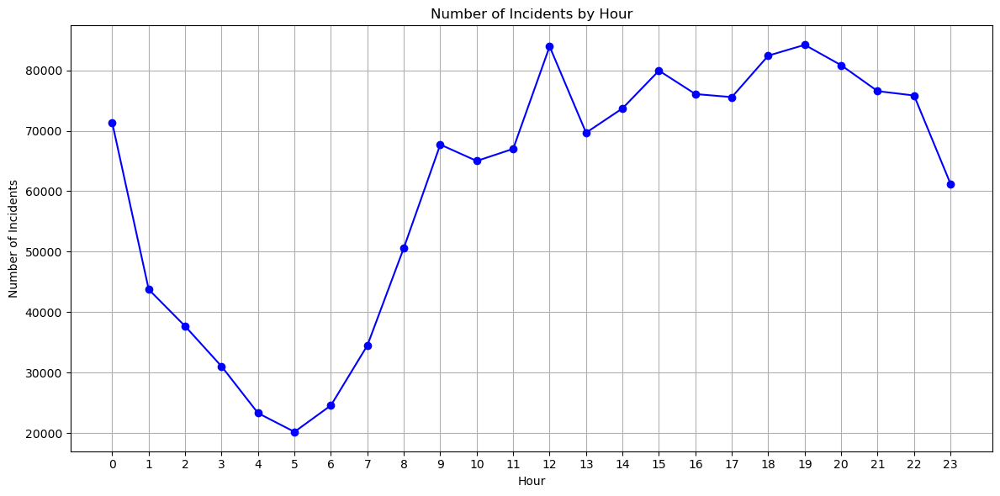

In [18]:
df["Hour"] = df["Time"].apply(lambda x: x.hour)

# Group data by hour and count occurrences
hourly_counts = df["Hour"].value_counts().sort_index()

# Plot a line graph
plt.figure(figsize=(12, 6))
hourly_counts.plot(color='b', marker='o', linestyle='-')
plt.title('Number of Incidents by Hour')
plt.xlabel('Hour')
plt.ylabel('Number of Incidents')
plt.xticks(range(24))  # Assuming hours range from 0 to 23
plt.grid(True)
plt.tight_layout()
plt.show()

Distribution of Time Periods

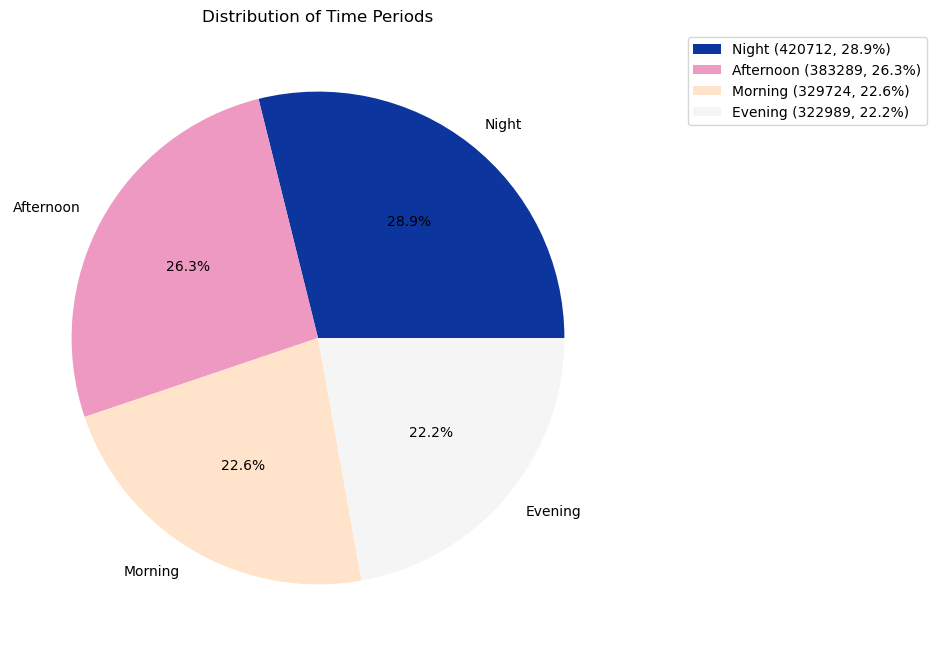

In [19]:
# Count the occurrences of each time period
time_of_day_counts = df["Time_of_Day"].value_counts()

# Define custom colors for the pie chart segments
custom_colors = ['#0C359E', '#EE99C2', '#FFE3CA', '#F6F5F5']

# Plot the pie chart with custom colors
plt.figure(figsize=(8, 8))
time_of_day_counts.plot(kind='pie', autopct='%1.1f%%', colors=custom_colors)
plt.title('Distribution of Time Periods')
plt.ylabel('')  # Remove the ylabel

# Create a custom legend with total count
total_count = time_of_day_counts.sum()
legend_labels = [f"{label} ({count}, {count/total_count:.1%})" for label, count in time_of_day_counts.items()]
plt.legend(legend_labels, loc="upper right", bbox_to_anchor=(1, 0, 0.5, 1))

plt.show()

Time Difference Between Date and Updated On

C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\1389088628.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["Updated On"] = pd.to_datetime(df["Updated On"])


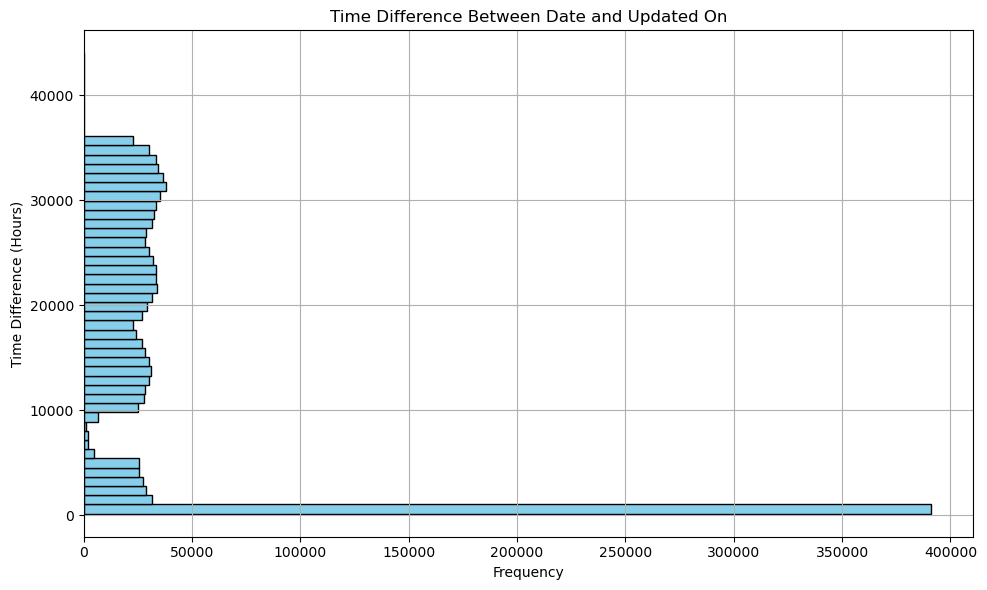

In [20]:
df["Date"] = pd.to_datetime(df["Date"])
df["Updated On"] = pd.to_datetime(df["Updated On"])

# Calculate the time difference in hours between "Date" and "Updated On"
df["Time Difference (Hours)"] = (df["Updated On"] - df["Date"]).dt.total_seconds() / 3600

# Plot a histogram of the time difference
plt.figure(figsize=(10, 6))
counts, bins, _ = plt.hist(df["Time Difference (Hours)"], bins=50, color='skyblue', edgecolor='black', orientation='horizontal')
plt.title('Time Difference Between Date and Updated On')
plt.ylabel('Time Difference (Hours)')
plt.xlabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

Top 10 locations and crime types

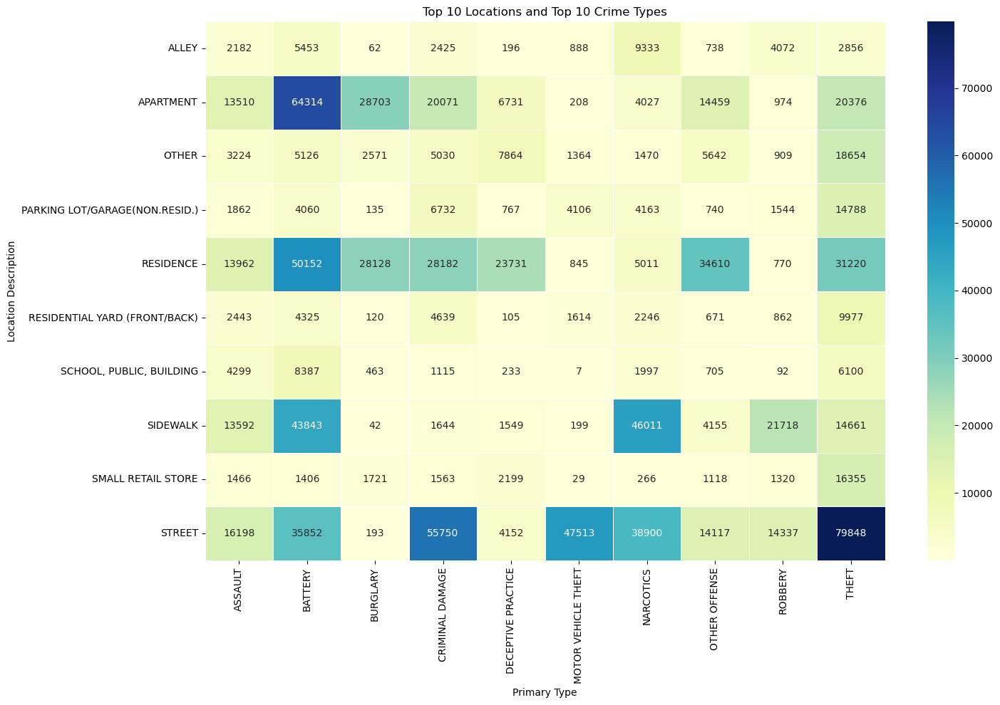

In [21]:
# Select the top N most common locations and M most common crime types
top_locations = df['Location Description'].value_counts().nlargest(10).index
top_types = df['Primary Type'].value_counts().nlargest(10).index

# Filter the DataFrame based on the selected locations and crime types
filtered_df = df[df['Location Description'].isin(top_locations) & df['Primary Type'].isin(top_types)]

# Create a pivot table with the filtered data
pivot_table = filtered_df.pivot_table(index='Location Description', columns='Primary Type', aggfunc='size', fill_value=0)

# Plot the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt='d', linewidths=0.5)
plt.title('Top {} Locations and Top {} Crime Types'.format(10, 10))
plt.xlabel('Primary Type')
plt.ylabel('Location Description')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


Arrest Rate vs. Non-Arrest Rate by Crime Type

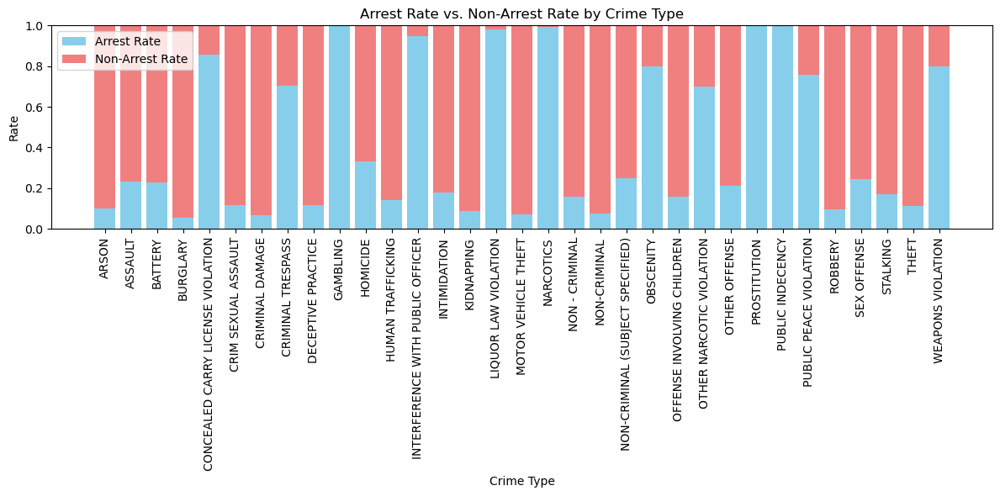

In [22]:


arrest_rate = df.groupby('Primary Type')['Arrest'].mean()

# Calculate the non-arrest rate for each crime type
non_arrest_rate = 1 - arrest_rate

# Plot the stacked bar plot
plt.figure(figsize=(12, 6))
plt.bar(arrest_rate.index, arrest_rate, color='skyblue', label='Arrest Rate')
plt.bar(non_arrest_rate.index, non_arrest_rate, bottom=arrest_rate, color='lightcoral', label='Non-Arrest Rate')
plt.title('Arrest Rate vs. Non-Arrest Rate by Crime Type')
plt.xlabel('Crime Type')
plt.ylabel('Rate')
plt.xticks(rotation=90)
plt.legend()
plt.tight_layout()
plt.show()

Domestic vs. Non-Domestic Incidents by Crime Type

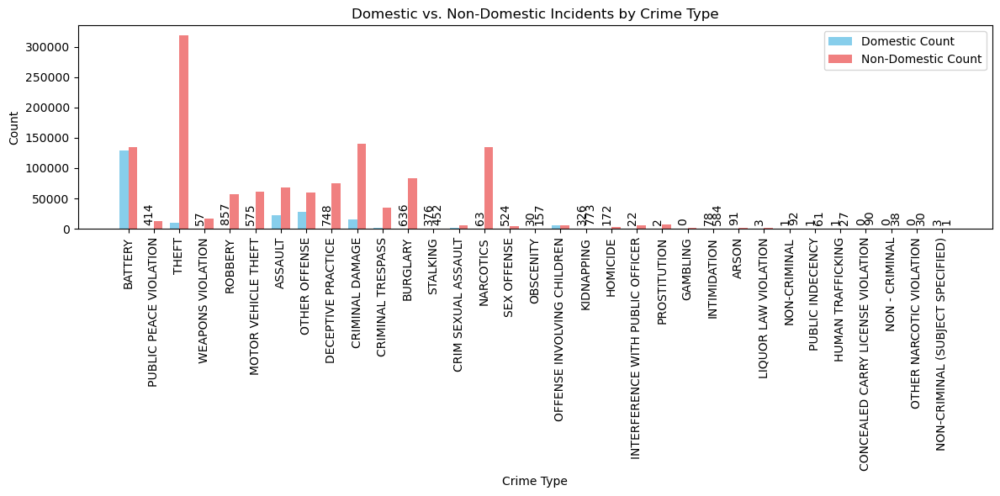

In [23]:
# Count the number of domestic and non-domestic incidents for each crime type
domestic_count = df[df['Domestic'] == True]['Primary Type'].value_counts().reindex(df['Primary Type'].unique(), fill_value=0)
non_domestic_count = df[df['Domestic'] == False]['Primary Type'].value_counts().reindex(df['Primary Type'].unique(), fill_value=0)

# Get the unique crime types
crime_types = df['Primary Type'].unique()

# Set the width of the bars
bar_width = 0.35

# Plot the grouped bar plot
plt.figure(figsize=(12, 6))
index = list(range(len(crime_types)))  # Convert range object to list
bars1 = plt.bar(index, domestic_count, bar_width, color='skyblue', label='Domestic Count')
bars2 = plt.bar([i + bar_width for i in index], non_domestic_count, bar_width, color='lightcoral', label='Non-Domestic Count')
plt.title('Domestic vs. Non-Domestic Incidents by Crime Type')
plt.xlabel('Crime Type')
plt.ylabel('Count')
plt.xticks([i + bar_width / 2 for i in index], crime_types, rotation=90)
plt.legend()

# Add labels on top of each bar for counts less than 500
for bars, label in zip([bars1, bars2], ['Domestic', 'Non-Domestic']):
    for bar in bars:
        height = bar.get_height()
        if height < 1000:
            plt.annotate('{}'.format(height),
                         xy=(bar.get_x() + bar.get_width() / 2, height),
                         xytext=(0, 3),  # 3 points vertical offset
                         textcoords="offset points",
                         ha='center', va='bottom' if label == 'Domestic' else 'bottom', rotation=90)  # Adjust va parameter

plt.tight_layout()
plt.show()

Beat Range for Each Crime Type

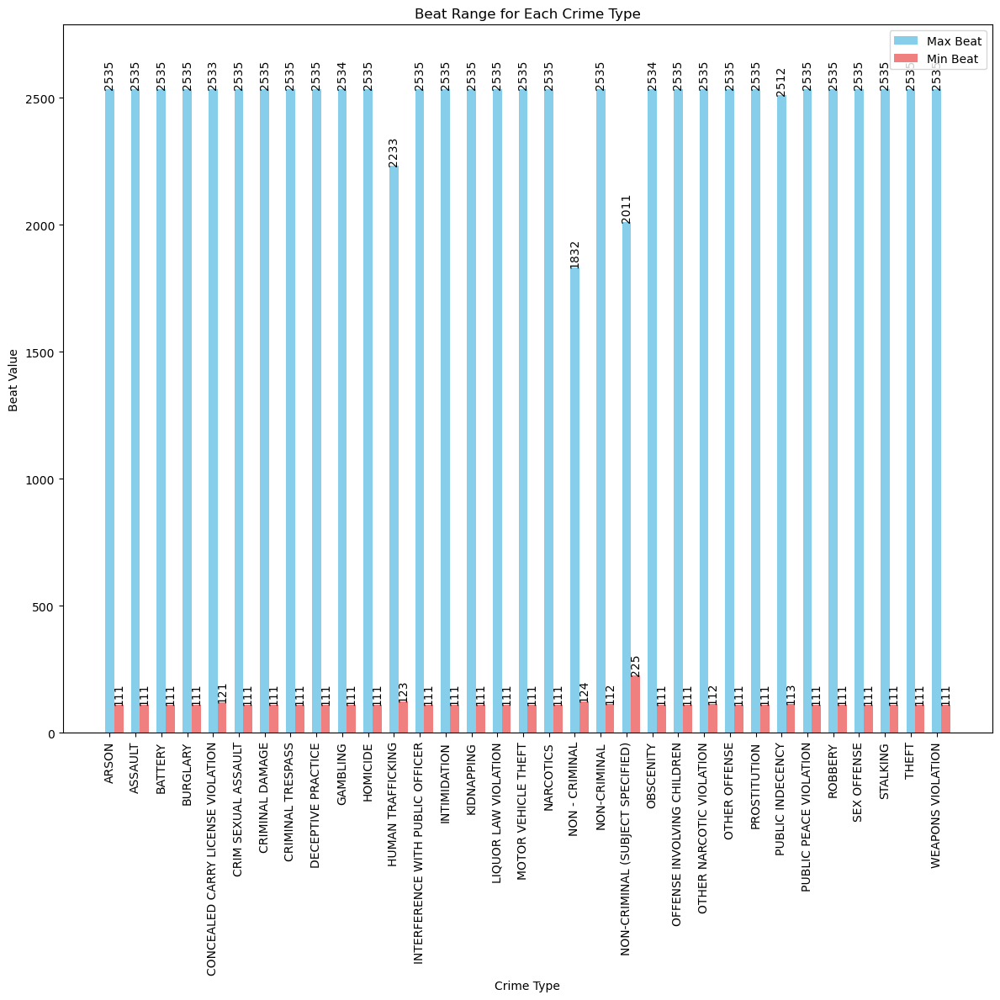

In [24]:


max_beat_per_crime_type = df.groupby('Primary Type')['Beat'].max()
min_beat_per_crime_type = df.groupby('Primary Type')['Beat'].min()

# Get the unique crime types
crime_types = max_beat_per_crime_type.index

# Get the corresponding maximum and minimum beat values
max_beat_values = max_beat_per_crime_type.values
min_beat_values = min_beat_per_crime_type.values

# Plot the grouped bar plot
plt.figure(figsize=(12, 12))
bar_width = 0.35
index = range(len(crime_types))
bars1 = plt.bar(index, max_beat_values, bar_width, color='skyblue', label='Max Beat')
bars2 = plt.bar([i + bar_width for i in index], min_beat_values, bar_width, color='lightcoral', label='Min Beat')

# Add y-axis scale
plt.ylim(0, max(max_beat_values) * 1.1)  # Adjust the maximum y-axis value for better visualization

# Set x-axis labels to crime types
plt.xticks(index, crime_types, rotation=90)

# Add data labels vertically for maximum beat values
for i, bar in enumerate(bars1):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{int(max_beat_values[i])}', ha='center', va='bottom', rotation=90)

# Add data labels vertically for minimum beat values
for i, bar in enumerate(bars2):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{int(min_beat_values[i])}', ha='center', va='bottom', rotation=90)

plt.title('Beat Range for Each Crime Type')
plt.xlabel('Crime Type')
plt.ylabel('Beat Value')
plt.legend()
plt.tight_layout()
plt.show()



Crime Counts by Type for Each District

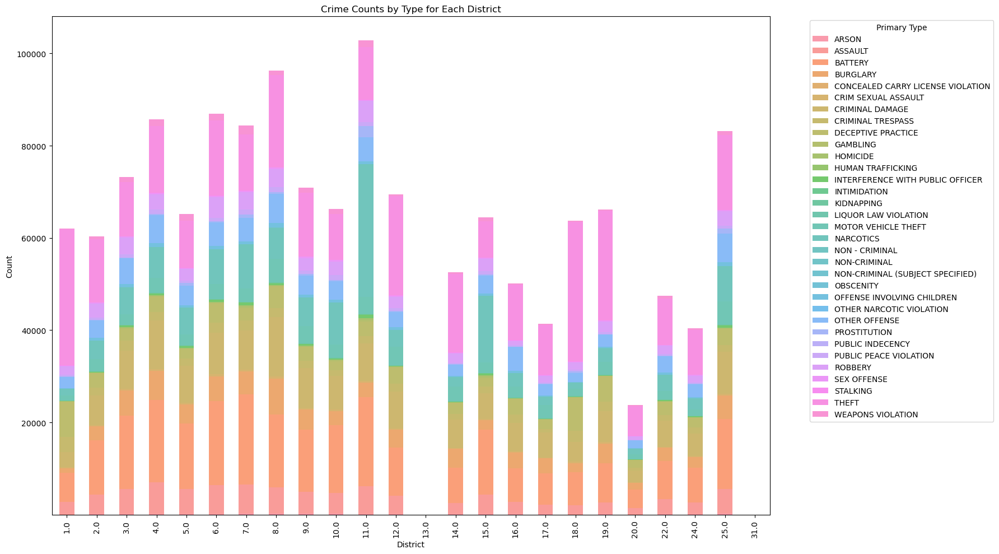

In [25]:


# Define a larger and more distinct color palette with 20 different colors
colors = sns.color_palette("husl", n_colors=35)

# Group the DataFrame by "District" and "Primary Type" and count occurrences
district_crime_counts = df.groupby(['District', 'Primary Type']).size().unstack(fill_value=0)

# Plot the grouped bar chart
fig, ax = plt.subplots(figsize=(18, 10))  # Increase the figure size

# Plot each district's crime counts with adjusted transparency
district_crime_counts.plot(kind='bar', stacked=True, ax=ax, color=colors, alpha=0.7)

ax.set_title('Crime Counts by Type for Each District')
ax.set_xlabel('District')
ax.set_ylabel('Count')

# Adjust the legend settings
ax.legend(title='Primary Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Crime Counts by Type for Each Ward

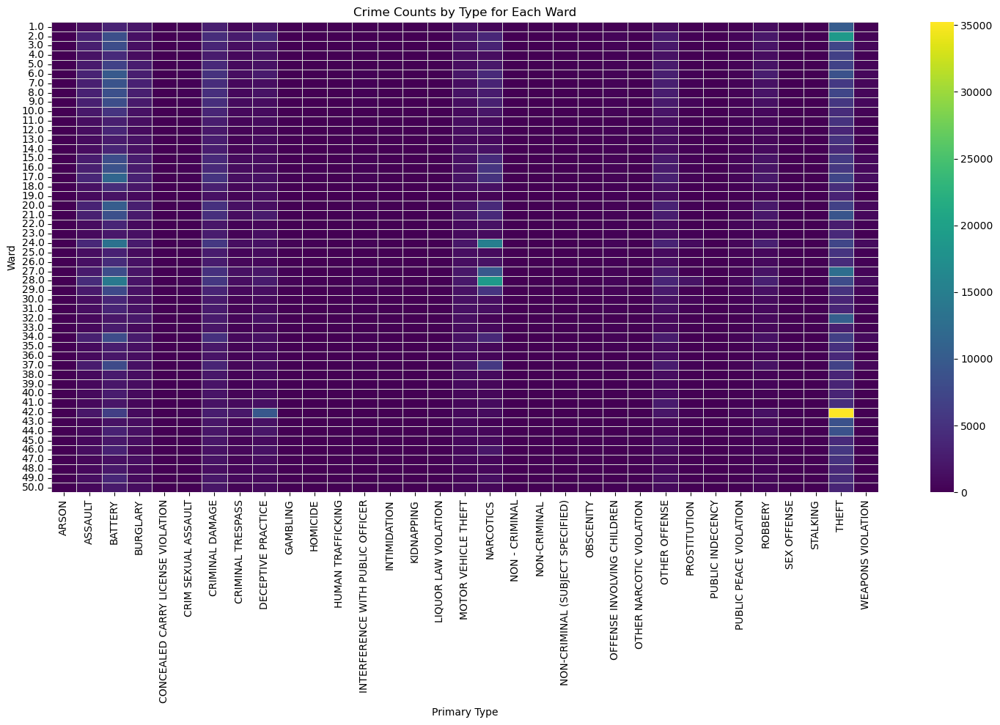

In [26]:


# Pivot the data to get the count of each crime type for each ward
ward_crime_counts = df.groupby(['Ward', 'Primary Type']).size().unstack(fill_value=0)

# Create a heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(ward_crime_counts, cmap='viridis', linewidths=0.5, linecolor='lightgray')

plt.title('Crime Counts by Type for Each Ward')
plt.xlabel('Primary Type')
plt.ylabel('Ward')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Crime Counts by Type for Each Community Area

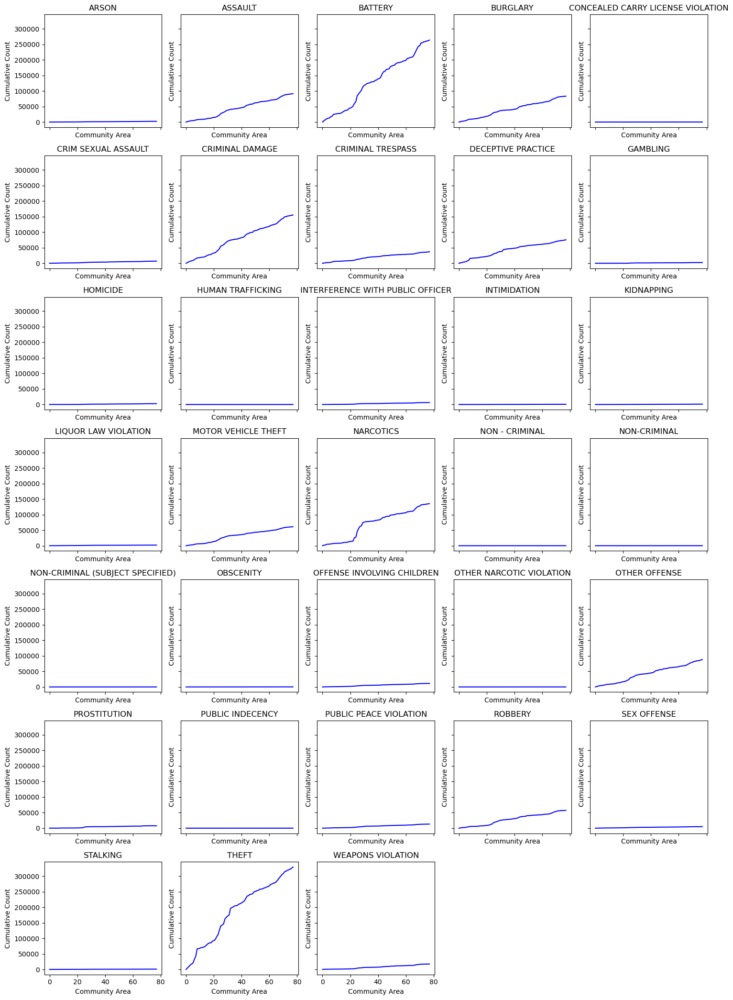

In [27]:


# Group the DataFrame by "Community Area" and "Primary Type" and count occurrences
community_crime_counts = df.groupby(['Community Area', 'Primary Type']).size().unstack(fill_value=0)

# Determine the number of rows and columns for the subplot grid
num_crime_types = len(community_crime_counts.columns)
num_rows = (num_crime_types - 1) // 5 + 1  # Calculate the number of rows needed
num_cols = min(num_crime_types, 5)  # Maximum of 5 columns

# Plot small multiples for each crime type
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3), sharex=True, sharey=True)

# Flatten the axes array for easy iteration
axes = axes.flatten()

for i, (crime_type, counts) in enumerate(community_crime_counts.items()):
    ax = axes[i]
    ax.plot(counts.index, counts.cumsum(), label=crime_type, color='blue')  # Use the same color for all lines
    ax.set_title(crime_type)
    ax.set_xlabel('Community Area')
    ax.set_ylabel('Cumulative Count')

# Hide empty subplots
for j in range(num_crime_types, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Crime Counts by Location (Excluding Coordinates = 0)

C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\3739915654.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', num_crime_types)


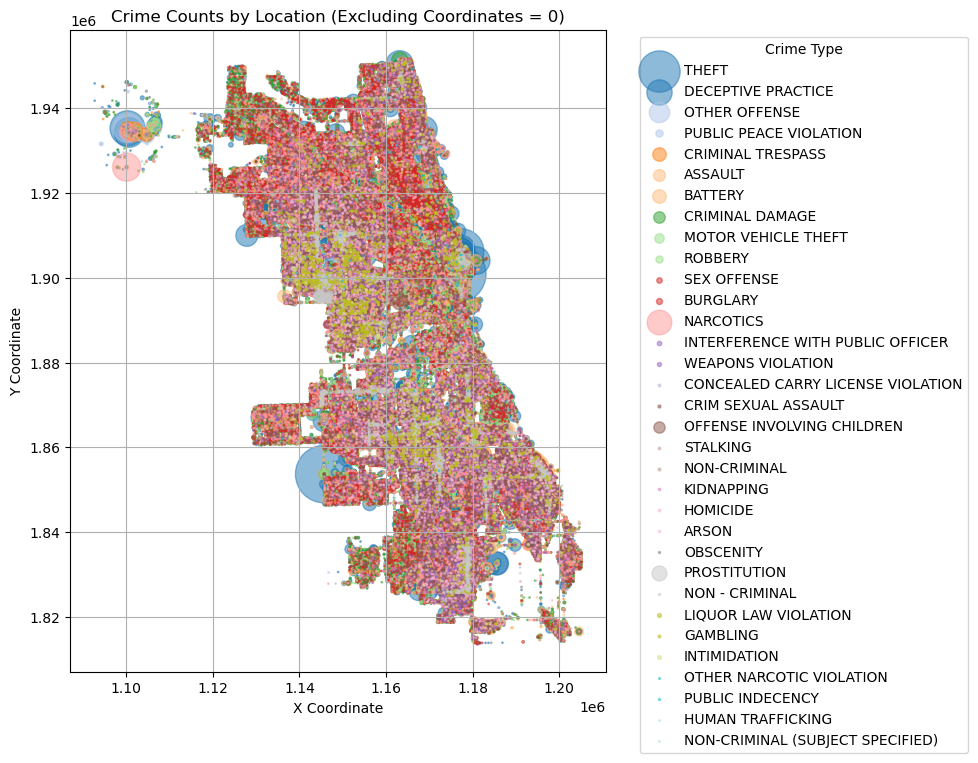

In [28]:


# Filter out rows with coordinates equal to 0
df_filtered = df[(df['X Coordinate'] != 0) & (df['Y Coordinate'] != 0)]

# Group the filtered DataFrame by "X Coordinate", "Y Coordinate", and "Primary Type" and count occurrences
crime_counts = df_filtered.groupby(['X Coordinate', 'Y Coordinate', 'Primary Type']).size().reset_index(name='Count')

# Get unique crime types and assign a unique color to each
unique_crime_types = crime_counts['Primary Type'].unique()
num_crime_types = len(unique_crime_types)

# Create a colormap with enough colors for all crime types
cmap = plt.cm.get_cmap('tab20', num_crime_types)

# Plot a scatter plot with unique colors for each crime type
plt.figure(figsize=(10, 8))
for i, crime_type in enumerate(unique_crime_types):
    crime_type_data = crime_counts[crime_counts['Primary Type'] == crime_type]
    plt.scatter(crime_type_data['X Coordinate'], crime_type_data['Y Coordinate'], s=crime_type_data['Count'],
                c=[cmap(i)], label=crime_type, alpha=0.5)

plt.title('Crime Counts by Location (Excluding Coordinates = 0)')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

Crime Incidents by Location and Primary Type

C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\1783714617.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('coolwarm', num_primary_types)


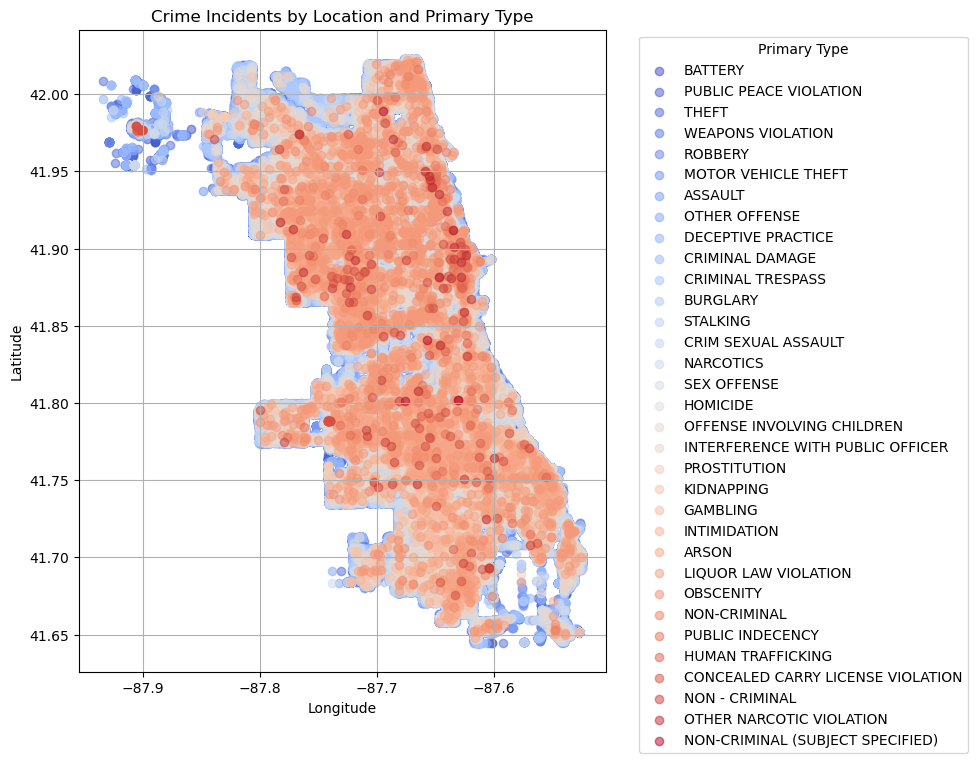

In [29]:


# Filter the DataFrame based on latitude and longitude conditions
filtered_df = df[(df['Latitude'] >= 37) & (df['Longitude'] >= -91)]

# Get unique primary types
primary_types = filtered_df['Primary Type'].unique()
num_primary_types = len(primary_types)

# Choose a different colormap
cmap = plt.cm.get_cmap('coolwarm', num_primary_types)

# Plot a scatter plot of latitude and longitude with different colors for each primary type
plt.figure(figsize=(10, 8))
for i, primary_type in enumerate(primary_types):
    crime_data = filtered_df[filtered_df['Primary Type'] == primary_type]
    plt.scatter(crime_data['Longitude'], crime_data['Latitude'], label=primary_type, color=cmap(i), alpha=0.5)

plt.title('Crime Incidents by Location and Primary Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Primary Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

Crime Incidents by Region and Primary Type

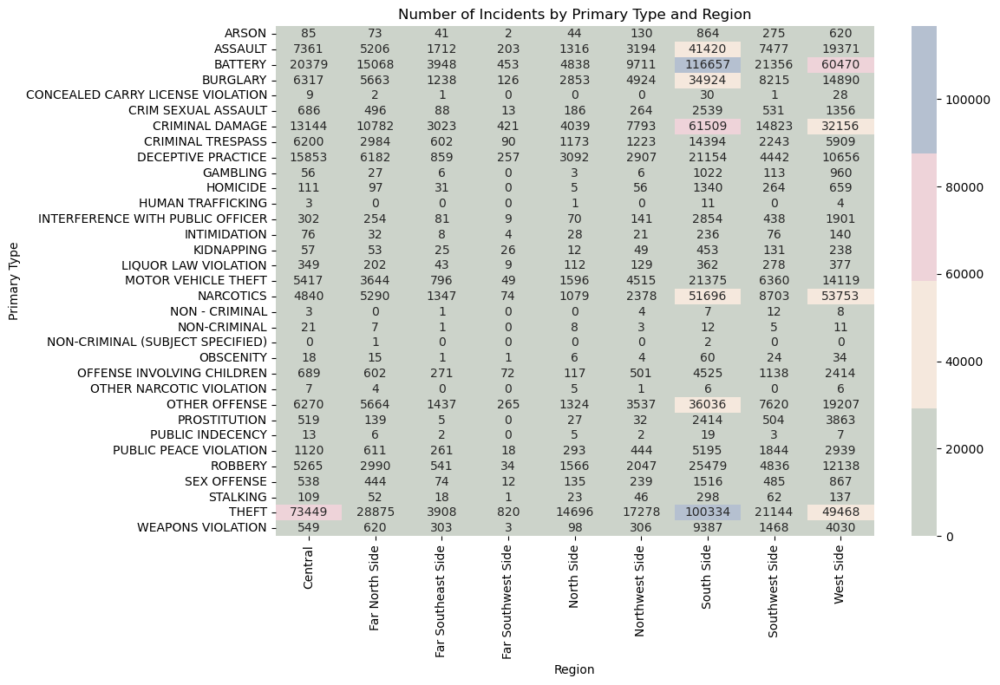

In [30]:
import matplotlib.colors as mcolors

# Pivot the DataFrame to get a count of incidents for each combination of Primary Type and Region
pivot_table = df.pivot_table(index="Primary Type", columns="Region", aggfunc="size", fill_value=0)

custom_cmap = mcolors.ListedColormap(['#CCD3CA','#F5E8DD','#EED3D9','#B5C0D0'])

# Plot a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap=custom_cmap, annot=True, fmt="d")

# Add a title and labels
plt.title("Number of Incidents by Primary Type and Region")
plt.xlabel("Region")
plt.ylabel("Primary Type")

# Show the plot
plt.tight_layout()
plt.show()

Top 20 Location Descriptions with Lowest Arrest Rate

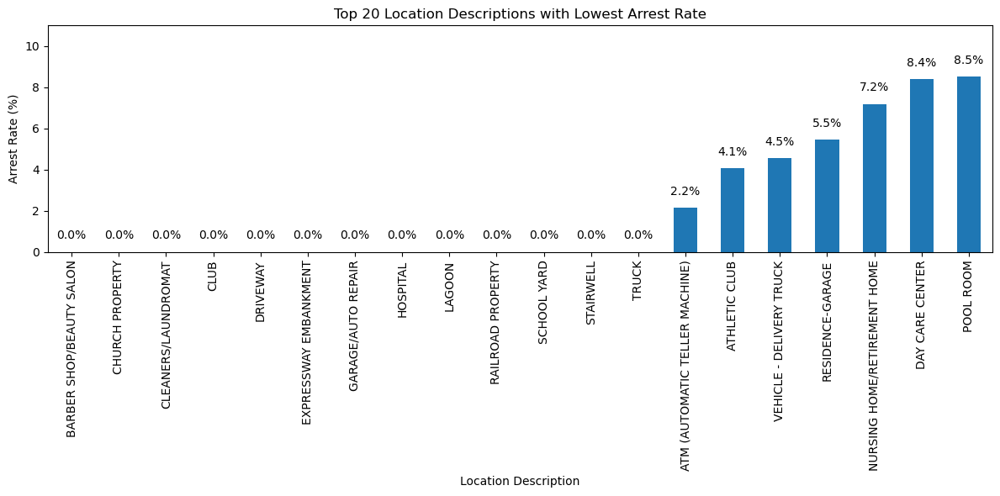

In [31]:
# Calculate the mean arrest rate for each location description
arrest_rates = df.groupby('Location Description')['Arrest'].mean() * 100  # Convert to percentage

# Select the top 20 locations with the lowest arrest rates
bottom_20_locations = arrest_rates.nsmallest(20)

# Plot the bar graph for the top 20 locations
plt.figure(figsize=(12, 6))
ax = bottom_20_locations.plot(kind='bar')
plt.title('Top 20 Location Descriptions with Lowest Arrest Rate')
plt.xlabel('Location Description')
plt.ylabel('Arrest Rate (%)')
plt.xticks(rotation=90)
plt.ylim(0, 11)  # Set the y-axis limits to 0% to 9%
plt.tight_layout()

# Annotate each bar with its corresponding percentage value
for i, v in enumerate(bottom_20_locations):
    ax.text(i, v + 0.5, f'{v:.1f}%', ha='center', va='bottom')

plt.show()

Top 20 Locations with Domestic Incident Count

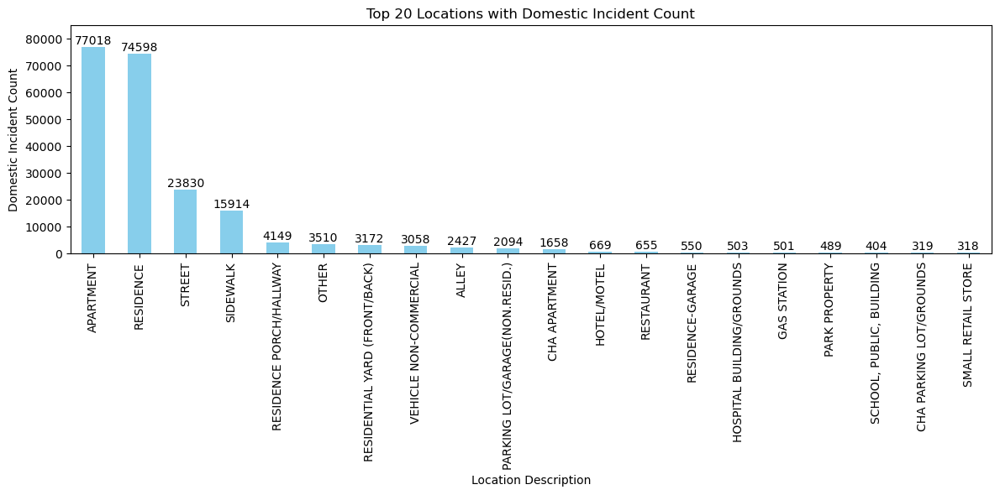

In [32]:
# Group the DataFrame by "Location Description" and count the number of domestic incidents
domestic_counts = df.groupby('Location Description')['Domestic'].sum().nlargest(20)

# Plot the bar graph for the top 20 locations with their domestic count
plt.figure(figsize=(12, 6))
ax = domestic_counts.plot(kind='bar', color='skyblue')
plt.title('Top 20 Locations with Domestic Incident Count')
plt.xlabel('Location Description')
plt.ylabel('Domestic Incident Count')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.ylim(0, 85000)
plt.tight_layout()

# Annotate each bar with its corresponding count
for i, v in enumerate(domestic_counts):
    ax.text(i, v + 5, str(v), ha='center', va='bottom')

plt.show()

Arrest rate of each district, ward and community area

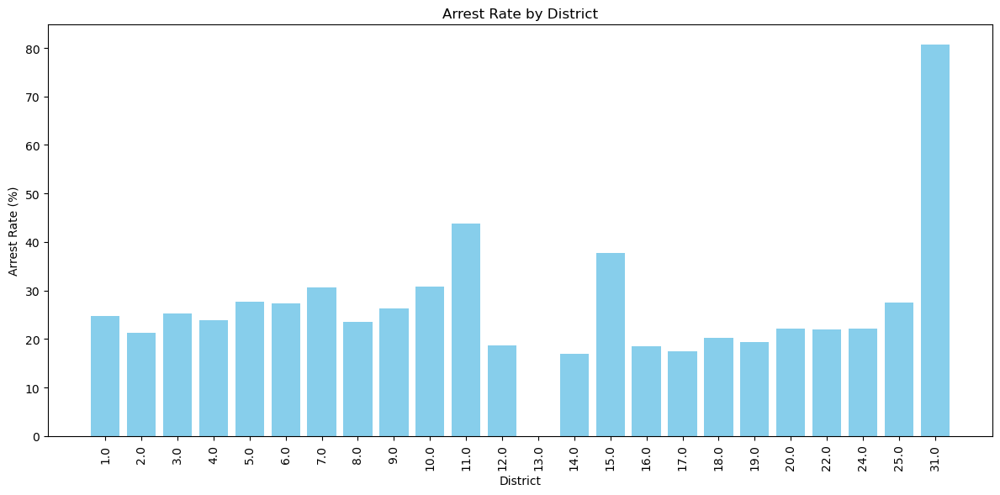

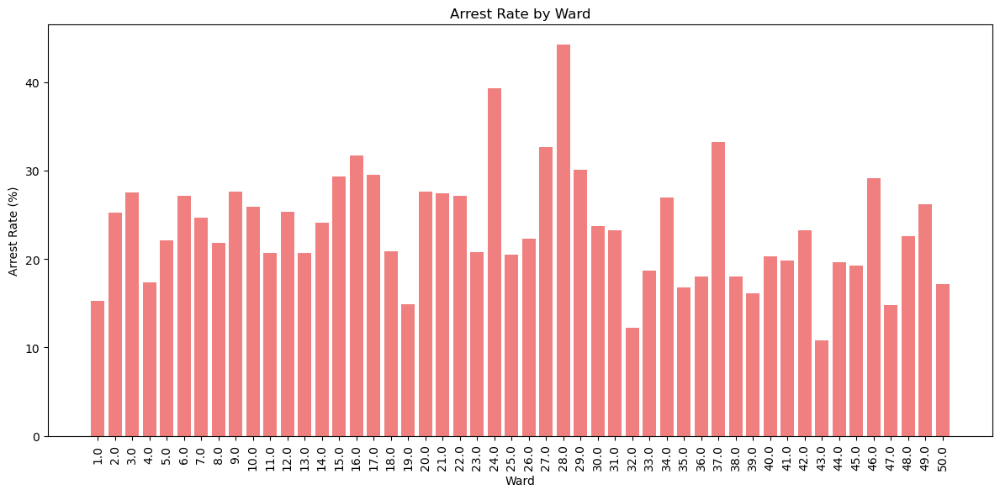

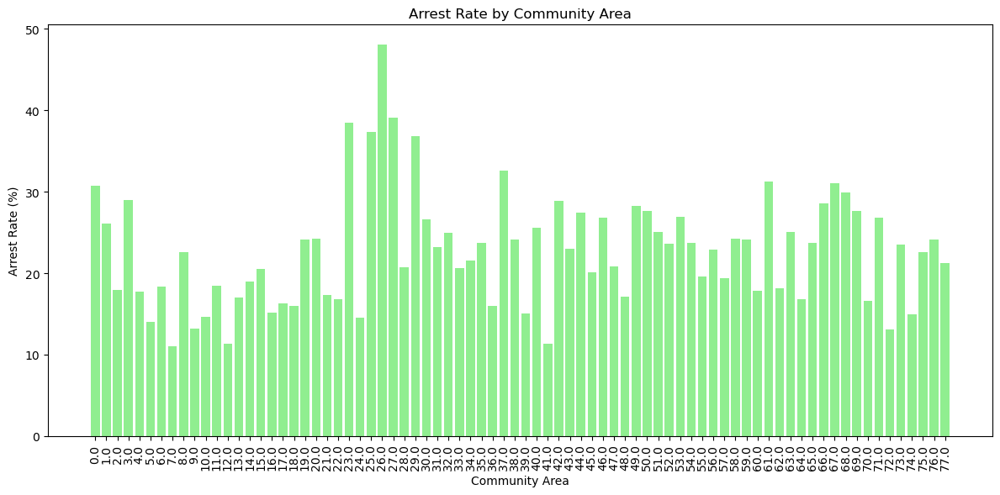

In [33]:
# Calculate the arrest rate for each district
district_arrest_rate = df.groupby('District')['Arrest'].mean() * 100
district_arrest_rate.index = district_arrest_rate.index.astype(str)

# Calculate the arrest rate for each ward
ward_arrest_rate = df.groupby('Ward')['Arrest'].mean() * 100
ward_arrest_rate.index = ward_arrest_rate.index.astype(str)

# Calculate the arrest rate for each community area
community_area_arrest_rate = df.groupby('Community Area')['Arrest'].mean() * 100
community_area_arrest_rate.index = community_area_arrest_rate.index.astype(str)

# Plot the bar graph for arrest rate by district
plt.figure(figsize=(12, 6))
plt.bar(district_arrest_rate.index, district_arrest_rate, color='skyblue')
plt.title('Arrest Rate by District')
plt.xlabel('District')
plt.ylabel('Arrest Rate (%)')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot the bar graph for arrest rate by ward
plt.figure(figsize=(12, 6))
plt.bar(ward_arrest_rate.index, ward_arrest_rate, color='lightcoral')
plt.title('Arrest Rate by Ward')
plt.xlabel('Ward')
plt.ylabel('Arrest Rate (%)')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot the bar graph for arrest rate by community area
plt.figure(figsize=(12, 6))
plt.bar(community_area_arrest_rate.index, community_area_arrest_rate, color='lightgreen')
plt.title('Arrest Rate by Community Area')
plt.xlabel('Community Area')
plt.ylabel('Arrest Rate (%)')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
plt.show()

Domesctic count of each district, ward and community area


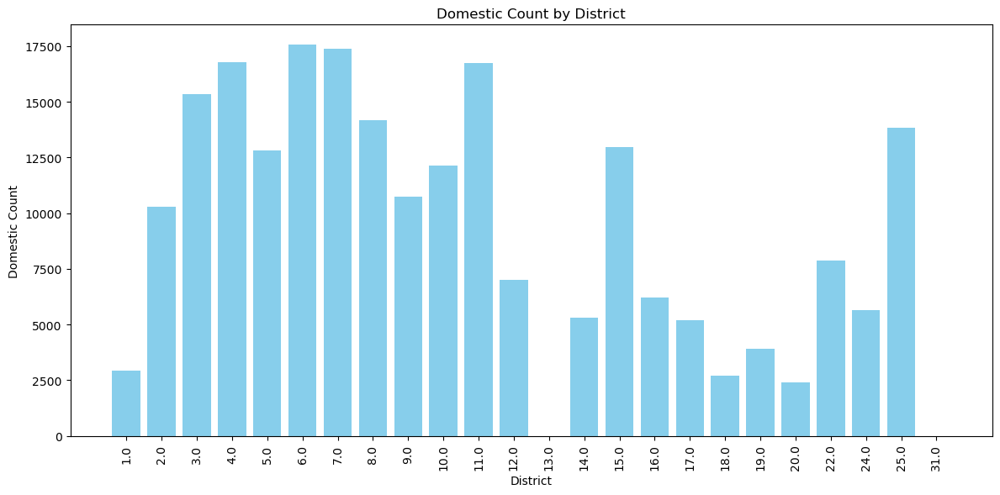

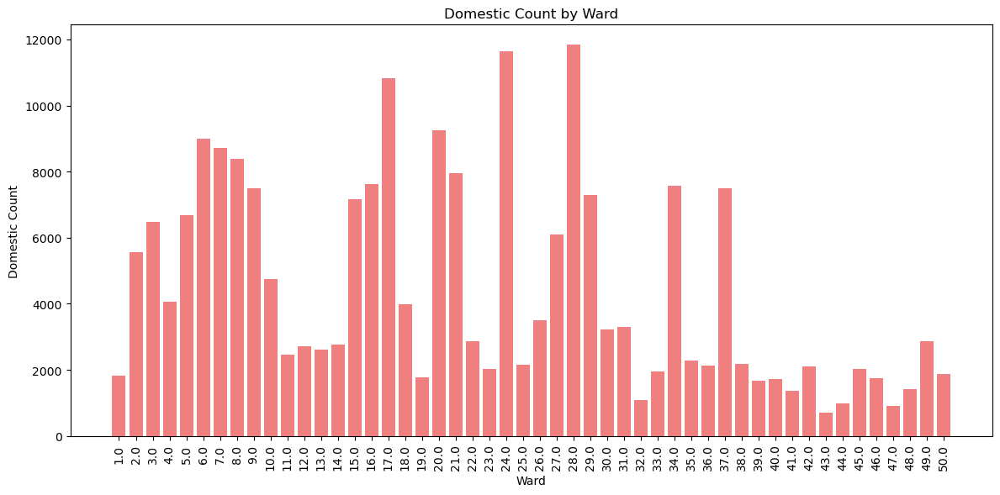

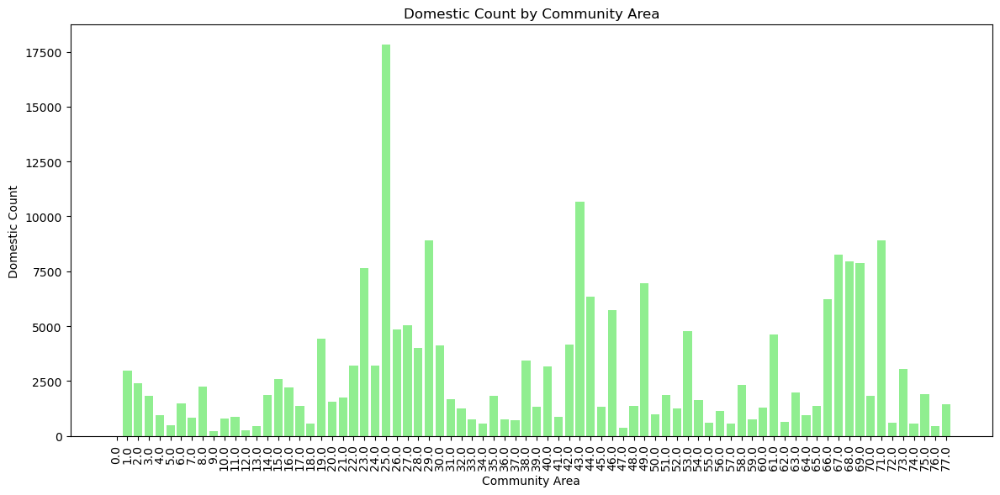

In [34]:

# Calculate the domestic count for each district
district_domestic_count = df.groupby('District')['Domestic'].sum()

# Calculate the domestic count for each ward
ward_domestic_count = df.groupby('Ward')['Domestic'].sum()

# Calculate the domestic count for each community area
community_area_domestic_count = df.groupby('Community Area')['Domestic'].sum()


# Convert index to strings
district_domestic_count.index = district_domestic_count.index.astype(str)
ward_domestic_count.index = ward_domestic_count.index.astype(str)
community_area_domestic_count.index = community_area_domestic_count.index.astype(str)

# Plot the bar graph for domestic count by district
plt.figure(figsize=(12, 6))
plt.bar(district_domestic_count.index, district_domestic_count, color='skyblue')
plt.title('Domestic Count by District')
plt.xlabel('District')
plt.ylabel('Domestic Count')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot the bar graph for domestic count by ward
plt.figure(figsize=(12, 6))
plt.bar(ward_domestic_count.index, ward_domestic_count, color='lightcoral')
plt.title('Domestic Count by Ward')
plt.xlabel('Ward')
plt.ylabel('Domestic Count')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
plt.show()

# Plot the bar graph for domestic count by community area
plt.figure(figsize=(12, 6))
plt.bar(community_area_domestic_count.index, community_area_domestic_count, color='lightgreen')
plt.title('Domestic Count by Community Area')
plt.xlabel('Community Area')
plt.ylabel('Domestic Count')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()
plt.show()

Arrest Rate by Location

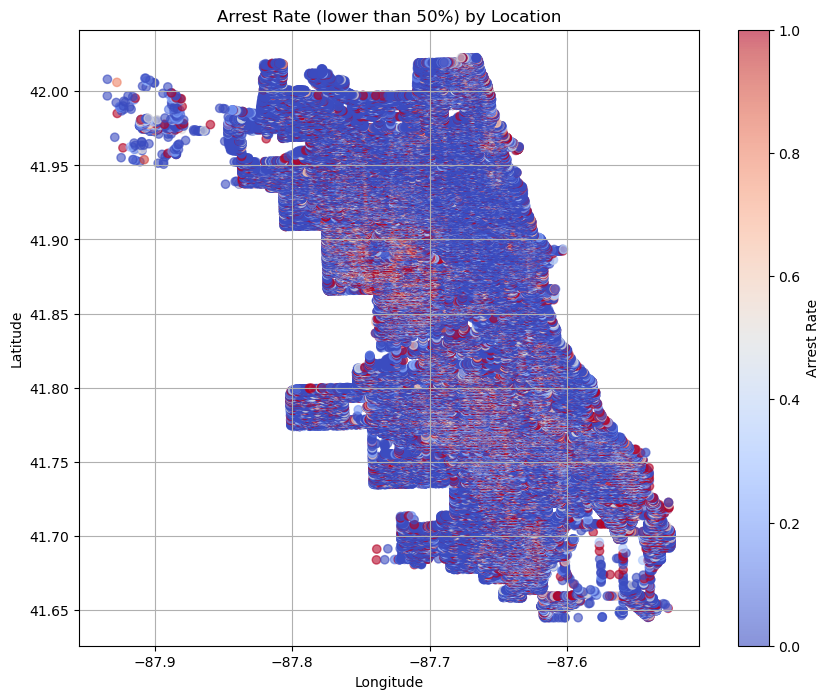

In [35]:
# Filter the DataFrame based on latitude and longitude conditions
filtered_df = df[(df['Latitude'] >= 37) & (df['Longitude'] >= -91)]

# Calculate the total count of incidents at each location
location_counts = filtered_df.groupby(['Latitude', 'Longitude']).size().reset_index(name='Total Incidents')

# Calculate the total count of arrests at each location
arrest_counts = filtered_df[filtered_df['Arrest'] == True].groupby(['Latitude', 'Longitude']).size().reset_index(name='Total Arrests')

# Merge the two DataFrames on latitude and longitude
merged_df = location_counts.merge(arrest_counts, on=['Latitude', 'Longitude'], how='left')

# Fill missing values with 0 (locations with no arrests)
merged_df['Total Arrests'].fillna(0, inplace=True)

# Calculate arrest rate (arrests / total incidents) at each location
merged_df['Arrest Rate'] = merged_df['Total Arrests'] / merged_df['Total Incidents']

# Filter merged_df to include only locations with arrest rate less than or equal to 0.5
filtered_merged_df = merged_df[merged_df['Arrest Rate'] <= 1]

# Plot the scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(filtered_merged_df['Longitude'], filtered_merged_df['Latitude'], c=filtered_merged_df['Arrest Rate'], cmap='coolwarm', alpha=0.6)
plt.colorbar(label='Arrest Rate')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Arrest Rate (lower than 50%) by Location')
plt.grid(True)
plt.show()

Domestic Count by Location

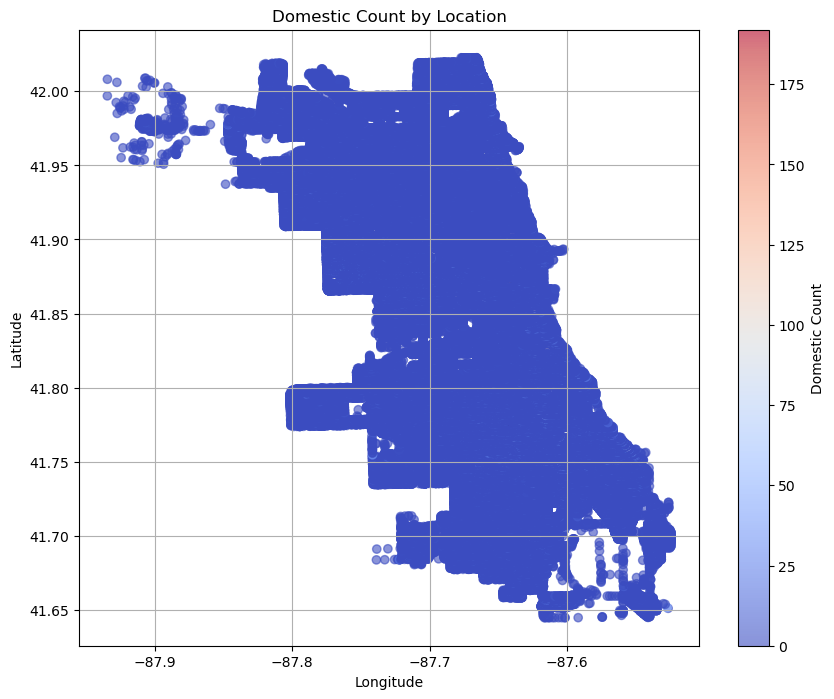

In [36]:


# Filter the DataFrame based on latitude and longitude conditions
filtered_df = df[(df['Latitude'] >= 37) & (df['Longitude'] >= -91)]

# Calculate the total count of incidents at each location
location_counts = filtered_df.groupby(['Latitude', 'Longitude']).size().reset_index(name='Total Incidents')

# Calculate the total count of domestic incidents at each location
domestic_counts = filtered_df[filtered_df['Domestic'] == True].groupby(['Latitude', 'Longitude']).size().reset_index(name='Total Domestic')

# Merge the two DataFrames on latitude and longitude
merged_df = location_counts.merge(domestic_counts, on=['Latitude', 'Longitude'], how='left')

# Fill missing values with 0 (locations with no domestic incidents)
merged_df['Total Domestic'].fillna(0, inplace=True)

# Plot the scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(merged_df['Longitude'], merged_df['Latitude'], c=merged_df['Total Domestic'], cmap='coolwarm', alpha=0.6)
plt.colorbar(label='Domestic Count')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Domestic Count by Location')
plt.grid(True)
plt.show()

Crime Type Distribution over Year

C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\48527983.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', num_crime_types)


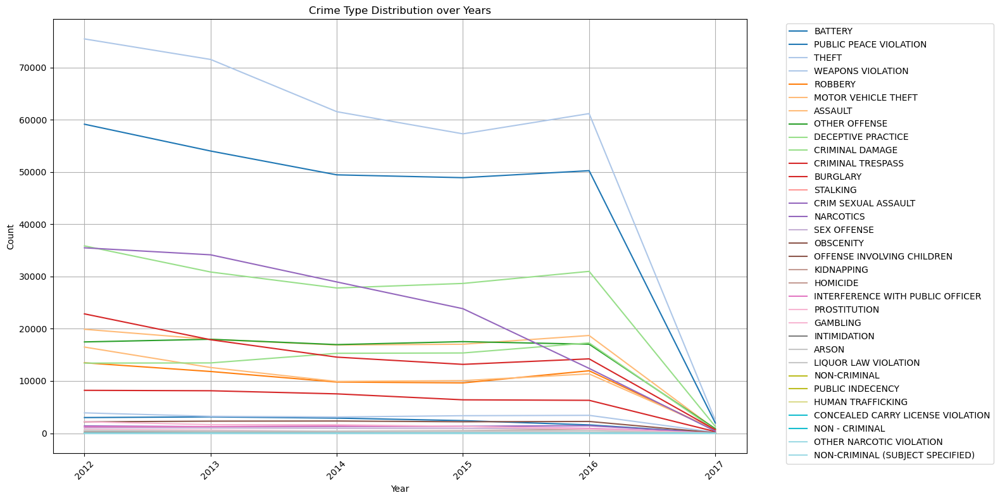

In [37]:
# Get unique crime types
crime_types = df['Primary Type'].unique()
num_crime_types = len(crime_types)

# Create a colormap with a specific number of colors
cmap = plt.cm.get_cmap('tab20', num_crime_types)

# Group the DataFrame by "Year" and "Primary Type" and count occurrences
yearly_crime_counts = df.groupby(['Year', 'Primary Type']).size().unstack(fill_value=0)

# Plot the line plot using the colormap
plt.figure(figsize=(12, 8))
for i, crime_type in enumerate(crime_types):
    plt.plot(yearly_crime_counts.index, yearly_crime_counts[crime_type], label=crime_type, color=cmap(i))

plt.title('Crime Type Distribution over Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.grid(True)
plt.xticks(yearly_crime_counts.index, rotation=45)
plt.tight_layout()

# Add a legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Crime Types over Month and Day

c:\Users\yibei\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


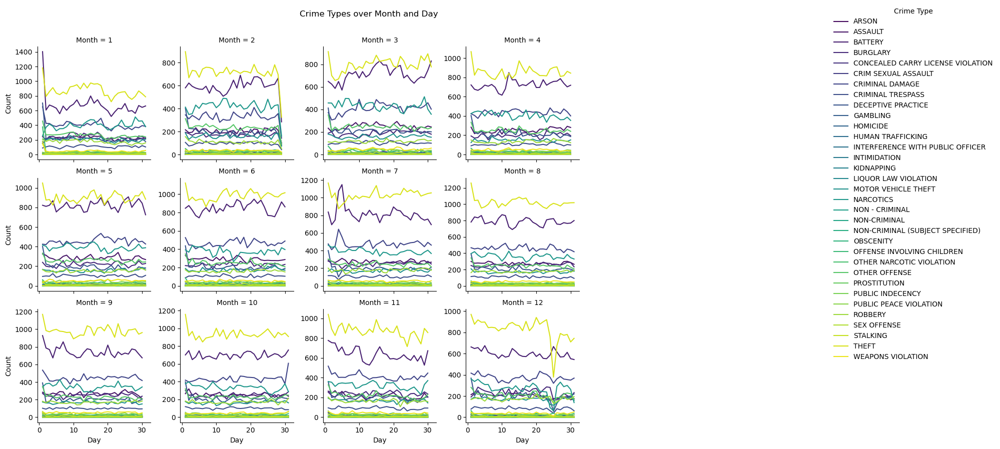

In [38]:


# Combine 'Month' and 'Day' columns into a new 'Date' column
df['Date'] = df['Month'].astype(str) + '/' + df['Day'].astype(str)

# Calculate the count of each crime type by month and day
crime_counts = df.groupby(['Month', 'Day'])['Primary Type'].value_counts().unstack(fill_value=0)

# Convert the DataFrame to long format for FacetGrid
crime_counts_long = crime_counts.reset_index().melt(id_vars=['Month', 'Day'], var_name='Crime Type', value_name='Count')

# Define the number of unique crime types
num_crime_types = len(crime_counts.columns)

# Define the number of unique crime types
num_crime_types = len(crime_counts.columns)

# Create FacetGrid
g = sns.FacetGrid(crime_counts_long, col="Month", col_wrap=4, height=3, sharey=False)
g.map_dataframe(sns.lineplot, x="Day", y="Count", hue="Crime Type", palette='viridis')
g.set_axis_labels("Day", "Count")

# Add legend
g.add_legend(title='Crime Type', bbox_to_anchor=(1.1, 1), loc='upper left')

# Add title to the entire plot
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Crime Types over Month and Day')

plt.show()

Crime Type Distribution by Hour

C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\1117670865.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20', num_crime_types)


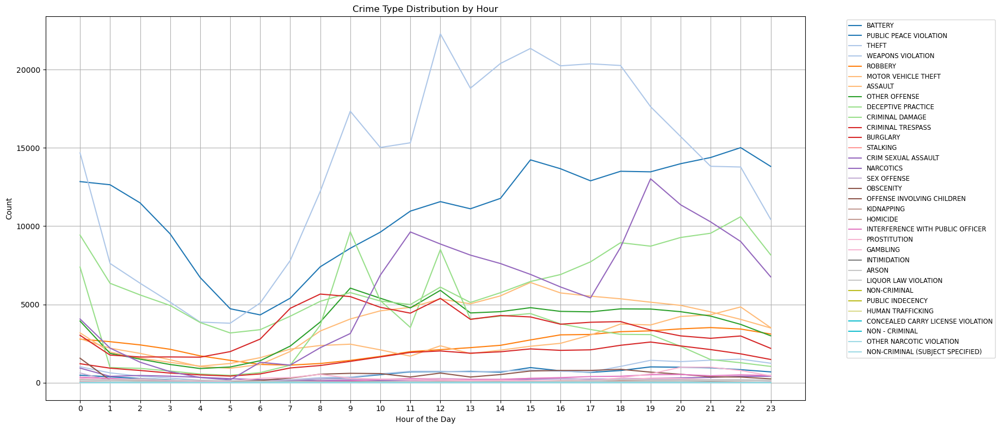

In [39]:
# Convert time values to strings
df['Time'] = df['Time'].astype(str)

# Extract hour from the time
df['Hour'] = df['Time'].str.extract(r'(\d+):').astype(int)

# Get unique crime types
crime_types = df['Primary Type'].unique()
num_crime_types = len(crime_types)

# Create a colormap with a specific number of colors
cmap = plt.cm.get_cmap('tab20', num_crime_types)

# Group the DataFrame by "Hour" and "Primary Type" and count occurrences
hour_crime_counts = df.groupby(['Hour', 'Primary Type']).size().unstack(fill_value=0)

# Plot the line plot using the colormap
plt.figure(figsize=(15, 8))  # Increase the size of the plot
for i, crime_type in enumerate(crime_types):
    plt.plot(hour_crime_counts.index, hour_crime_counts[crime_type], label=crime_type, color=cmap(i))

plt.title('Crime Type Distribution by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Count')
plt.grid(True)
plt.xticks(range(24))  # Set x-axis ticks to represent each hour
plt.tight_layout()

# Add a legend outside the plot with smaller fontsize
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
plt.show()


Crime Type Distution by Time Periods


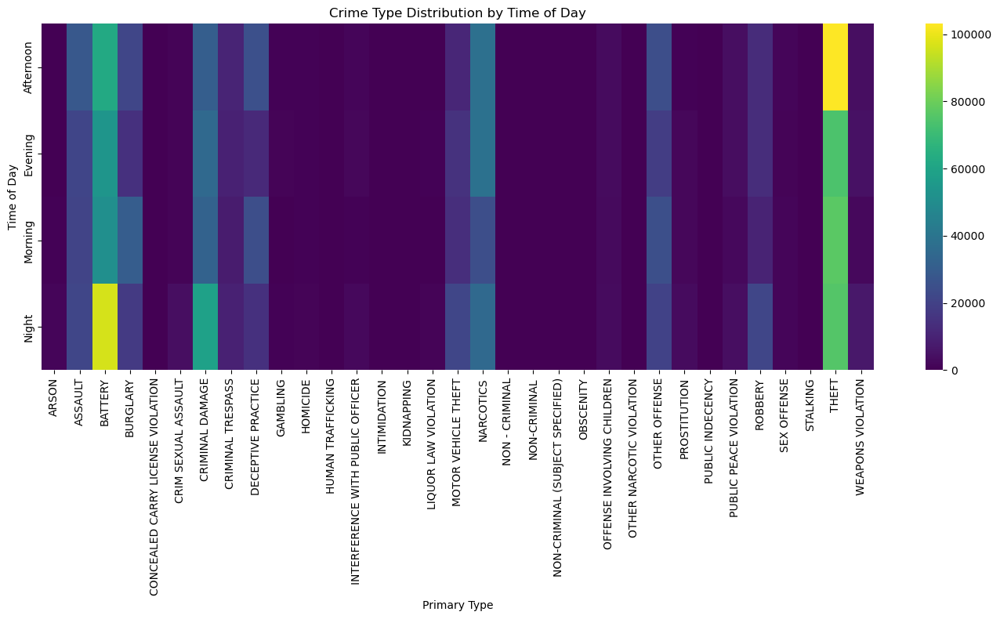

In [40]:
plt.figure(figsize=(14, 8))  # Adjust the size of the figure
sns.heatmap(df.groupby(["Time_of_Day", "Primary Type"]).size().unstack(fill_value=0), cmap='viridis')
plt.title('Crime Type Distribution by Time of Day')
plt.xlabel('Primary Type')
plt.ylabel('Time of Day')
plt.xticks(rotation=90)  # Increase the rotation angle of the x-axis labels
plt.tight_layout()
plt.show()

Arrest Rate Across Year and Month

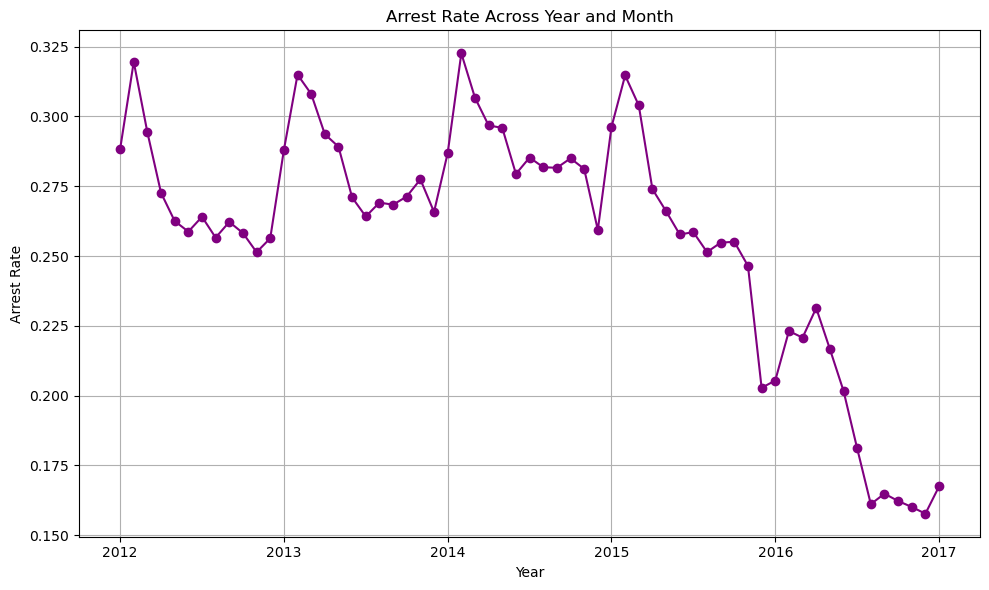

In [41]:
# Group the DataFrame by year and month, and calculate the mean of the "Arrest" column
arrest_rate = df.groupby(['Year', 'Month'])['Arrest'].mean().reset_index()

# Plot the arrest rate across the year and month with a different color
plt.figure(figsize=(10, 6))
plt.plot(arrest_rate['Year'] + (arrest_rate['Month'] - 1) / 12, arrest_rate['Arrest'], marker='o', color='purple')
plt.title('Arrest Rate Across Year and Month')
plt.xlabel('Year')
plt.ylabel('Arrest Rate')
plt.xticks(range(min(arrest_rate['Year']), max(arrest_rate['Year']) + 1))
plt.grid(True)
plt.tight_layout()
plt.show()

Arrest Rate Over Time by Hour

C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\856837391.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Time'] = pd.to_datetime(df['Time'])


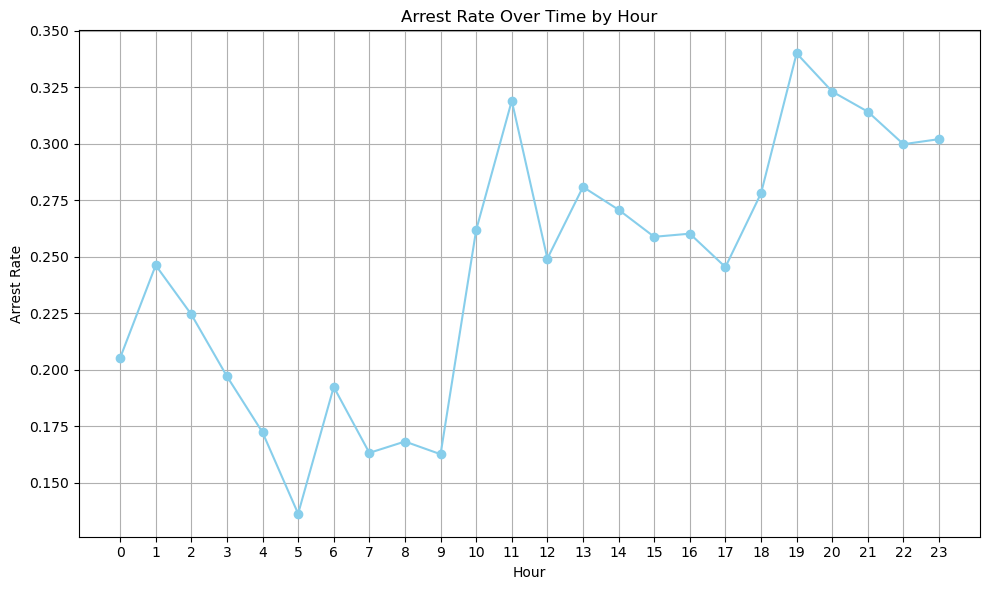

In [42]:


# Convert "Time" column to datetime format
df['Time'] = pd.to_datetime(df['Time'])

# Extract hour component from datetime values
df['Hour'] = df['Time'].dt.hour

# Group by hour and calculate mean of "Arrest" column
arrest_rate_by_hour = df.groupby('Hour')['Arrest'].mean()

# Plot the arrest rate over time by hour
plt.figure(figsize=(10, 6))
arrest_rate_by_hour.plot(marker='o', color='skyblue')
plt.title('Arrest Rate Over Time by Hour')
plt.xlabel('Hour')
plt.ylabel('Arrest Rate')
plt.xticks(range(24))  # Set x-axis ticks to display all hours
plt.grid(True)
plt.tight_layout()
plt.show()

Arrest Count by Time Periods

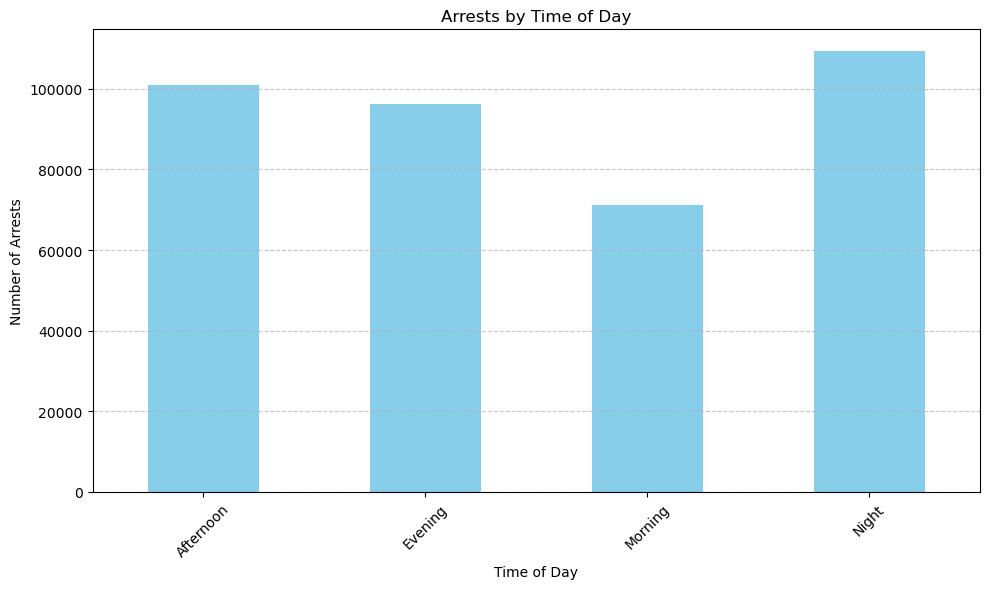

In [43]:
# Filter the DataFrame to include only rows where Arrest is True
arrested_df = df[df["Arrest"] == True]

# Grouping the data by time of day and counting the number of arrests
arrest_counts = arrested_df.groupby("Time_of_Day").size()

# Plotting the data
plt.figure(figsize=(10, 6))
arrest_counts.plot(kind='bar', color='skyblue')
plt.title('Arrests by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Arrests')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Distribution of Domestic Incidents over the Years

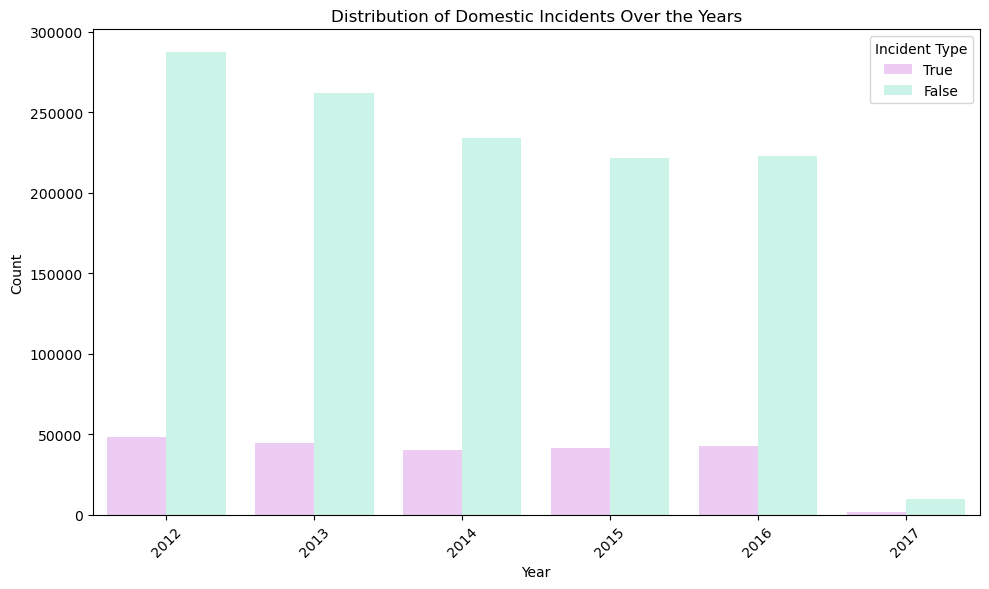

In [44]:
# Convert 'Domestic' column to strings
df['Domestic'] = df['Domestic'].astype(str)

# Define custom colors for domestic and non-domestic incidents
custom_palette = {'True': '#F2C5FA', 'False': '#C5FAE9'}

# Plot the count of domestic incidents over the years with custom colors
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Year', hue='Domestic', palette=custom_palette)
plt.title('Distribution of Domestic Incidents Over the Years')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Incident Type', loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Distribution of Domestic Incidents by Month

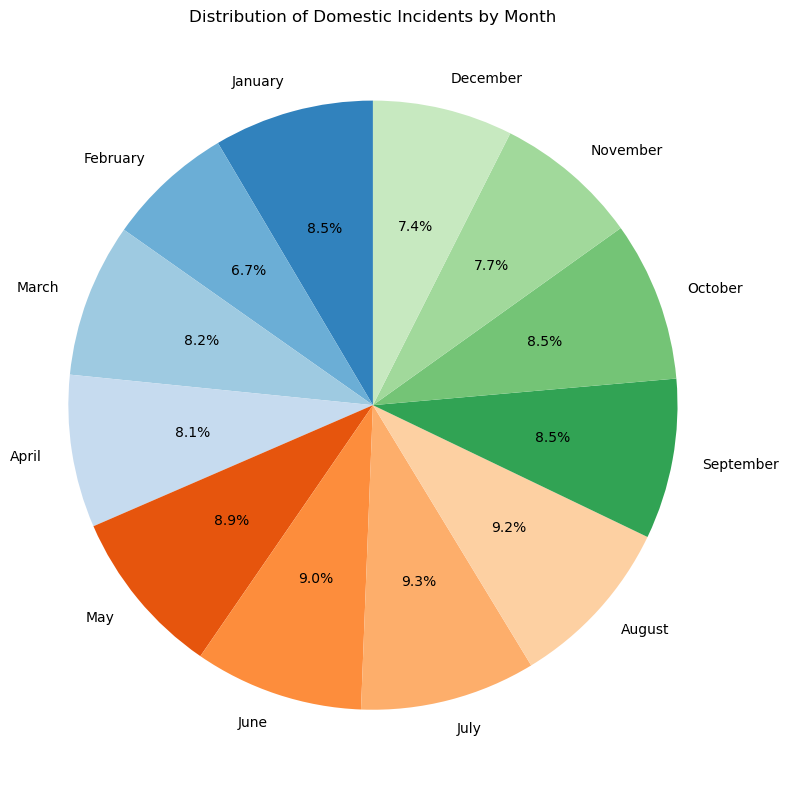

In [45]:
import calendar

# Count the number of domestic incidents for each month
domestic_counts = df['Month'].value_counts().sort_index()

# Convert month numbers to month names
month_names = [calendar.month_name[month_num] for month_num in domestic_counts.index]

# Define a custom color palette with different colors for each month
colors = plt.cm.tab20c(range(len(month_names)))

# Plot the pie chart with the custom color palette
plt.figure(figsize=(8, 8))
plt.pie(domestic_counts, labels=month_names, autopct='%1.1f%%', startangle=90, colors=colors)
plt.title('Distribution of Domestic Incidents by Month')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.tight_layout()
plt.show()

Top 10 Location Descriptions for each year

c:\Users\yibei\anaconda3\Lib\site-packages\seaborn\axisgrid.py:712: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
c:\Users\yibei\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\yibei\AppData\Local\Temp\ipykernel_20732\2622669896.py:19: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


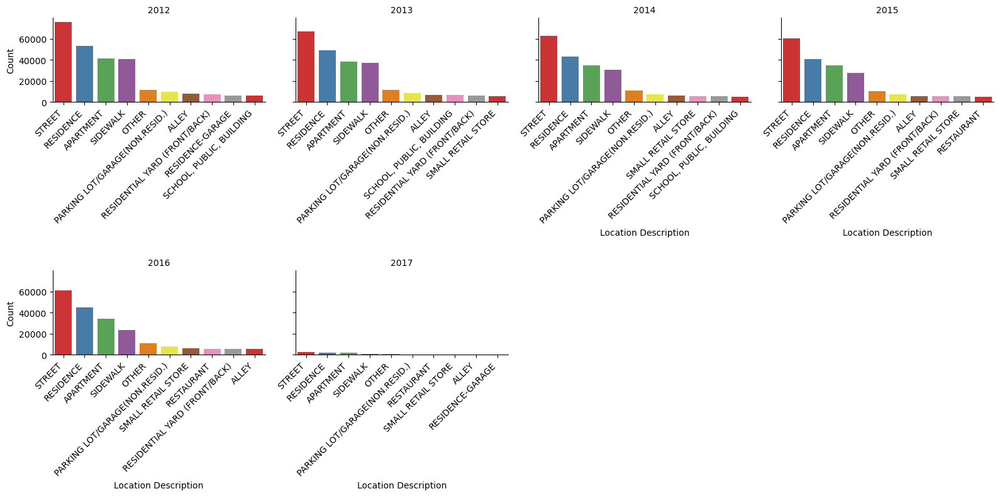

In [46]:
# Get the top 10 Location Descriptions for each year
top_locations = df.groupby(['Year', 'Location Description']).size().groupby('Year').nlargest(10).reset_index(level=0, drop=True)

# Reset index to make 'Year' and 'Location Description' as columns
top_locations = top_locations.reset_index()

# Create FacetGrid
g = sns.FacetGrid(top_locations, col='Year', col_wrap=4, height=4, margin_titles=True, sharex=False)
g.map(sns.barplot, 'Location Description', 0, palette='Set1')

# Set x-axis labels rotation for all facets
for ax in g.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

g.set_titles('{col_name}')
g.set_axis_labels('Location Description', 'Count')

# Adjust layout to prevent cutoff of x-axis labels
plt.tight_layout()

# Adjust spacing between rows
g.fig.subplots_adjust(hspace=2)

plt.show()

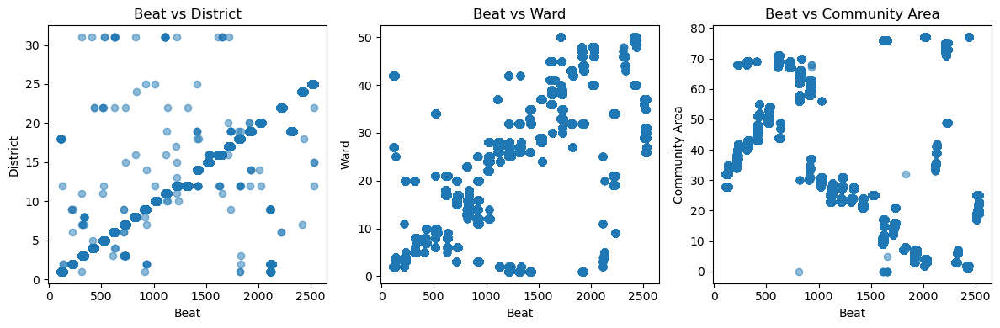

In [4]:
# Plot a scatter plot of Beat vs District
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.scatter(df['Beat'], df['District'], alpha=0.5)
plt.xlabel('Beat')
plt.ylabel('District')
plt.title('Beat vs District')

# Plot "Beat" vs "Ward"
plt.subplot(1, 3, 2)
plt.scatter(df['Beat'], df['Ward'], alpha=0.5)
plt.xlabel('Beat')
plt.ylabel('Ward')
plt.title('Beat vs Ward')

# Plot "Beat" vs "Community Area"
plt.subplot(1, 3, 3)
plt.scatter(df['Beat'], df['Community Area'], alpha=0.5)
plt.xlabel('Beat')
plt.ylabel('Community Area')
plt.title('Beat vs Community Area')

plt.tight_layout()
plt.show()

Hotspots against Time

c:\Users\yibei\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1525: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


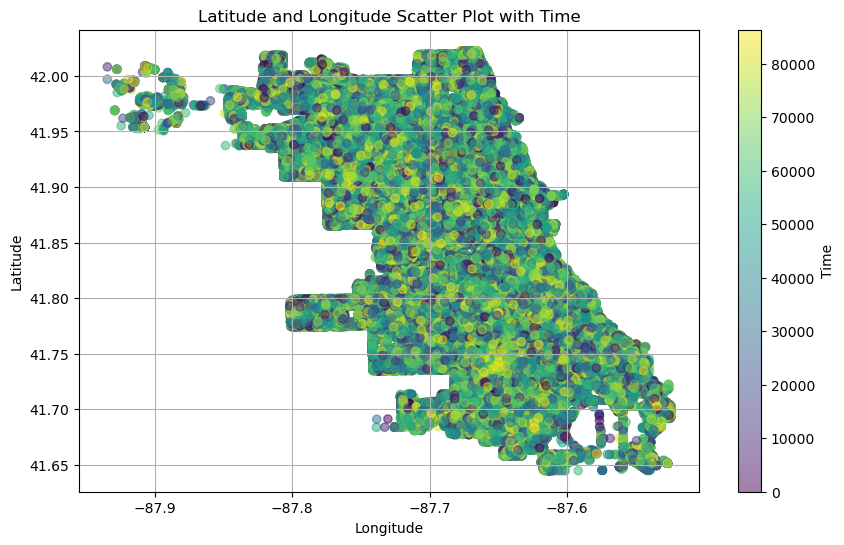

In [10]:
# Filter the DataFrame based on latitude and longitude conditions
filtered_df = df[(df['Latitude'] >= 37) & (df['Longitude'] >= -91)]

# Convert time to numeric representation
filtered_df["Time_numeric"] = filtered_df["Time"].apply(lambda x: x.hour * 3600 + x.minute * 60 + x.second)

# Plot the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(filtered_df["Longitude"], filtered_df["Latitude"], c=filtered_df["Time_numeric"], cmap="viridis", alpha=0.5)
plt.colorbar(label="Time")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Latitude and Longitude Scatter Plot with Time")
plt.grid(True)
plt.show()

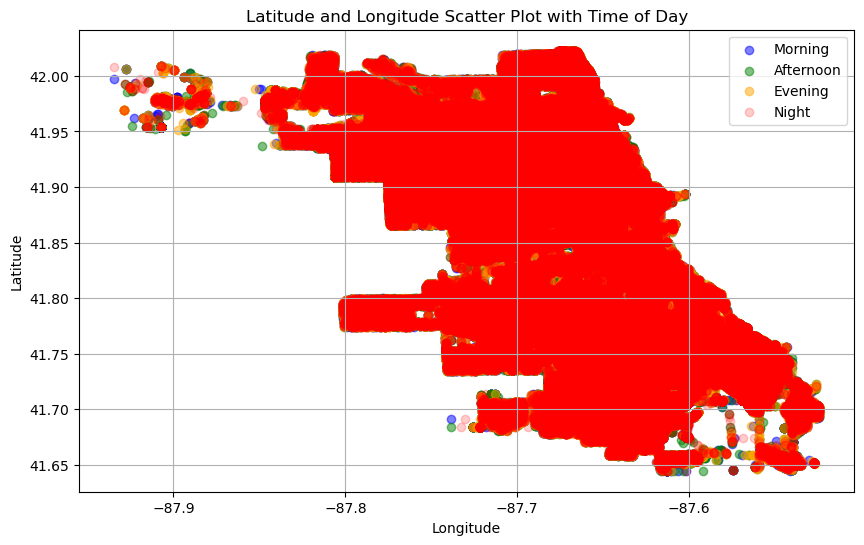

In [17]:
import matplotlib.pyplot as plt

# Filter the DataFrame based on latitude and longitude conditions
filtered_df = df[(df['Latitude'] >= 37) & (df['Longitude'] >= -91)]

# Define colors for different time periods
time_colors = {
    "Morning": "blue",
    "Afternoon": "green",
    "Evening": "orange",
    "Night": "red"
}

# Plot the scatter plot
plt.figure(figsize=(10, 6))
for time_period, color in time_colors.items():
    filtered_df_time = filtered_df[filtered_df["Time_of_Day"] == time_period]
    if time_period == "Night":
        plt.scatter(filtered_df_time["Longitude"], filtered_df_time["Latitude"], color=color, label=time_period, alpha=0.2)
    else:
        plt.scatter(filtered_df_time["Longitude"], filtered_df_time["Latitude"], color=color, label=time_period, alpha=0.5)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Latitude and Longitude Scatter Plot with Time of Day")
plt.legend()
plt.grid(True)
plt.show()


Distribution of Crime Incidents by Community and Time of Day

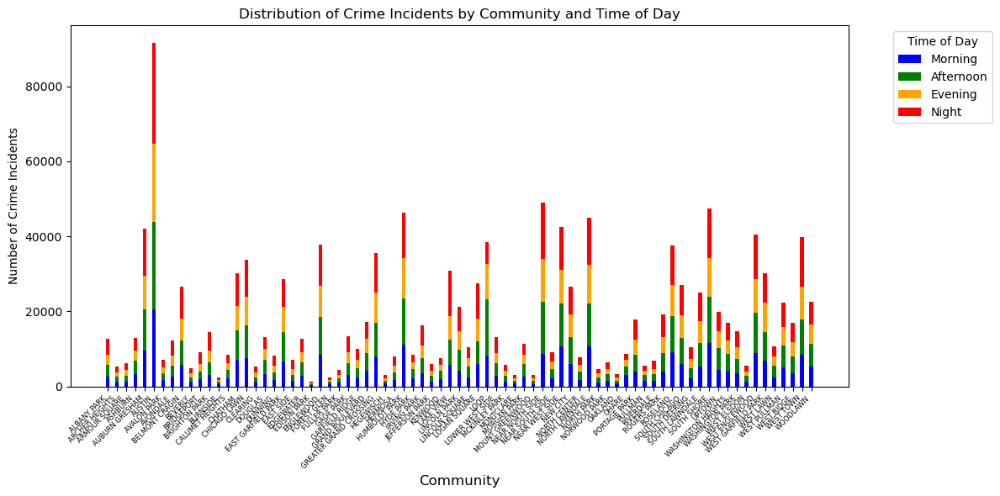

In [31]:
# Group the DataFrame by community and time of day, and count the number of occurrences
grouped_data = df.groupby(["community", "Time_of_Day"]).size().unstack()

# Define the width of each bar and the spacing between bars
bar_width = 0.4
bar_spacing = 0.1

# Calculate the total number of time periods
num_time_periods = len(grouped_data.columns)

# Calculate the total width of each group of bars
total_bar_width = num_time_periods * bar_width + (num_time_periods - 1) * bar_spacing

# Calculate the position of each group of bars
positions = range(len(grouped_data))

# Plot the stacked bar plot with adjusted bar width and spacing
plt.figure(figsize=(12, 6))
bottoms = [0] * len(grouped_data)
for i, (time_period, color) in enumerate(time_colors.items()):
    plt.bar(positions, grouped_data[time_period], width=bar_width, bottom=bottoms, label=time_period, color=color)
    bottoms = [bottoms[j] + grouped_data[time_period][j] for j in range(len(grouped_data))]

plt.xlabel("Community", fontsize=12)  # Adjust font size
plt.ylabel("Number of Crime Incidents")
plt.title("Distribution of Crime Incidents by Community and Time of Day")
plt.xticks(positions, grouped_data.index, rotation=45, ha='right', fontsize=6)  # Adjust font size
plt.legend(title="Time of Day", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()  # Adjust layout to prevent overlapping labels
plt.show()


Distribution of Crime Incidents by Region and Time of Day

<Figure size 1200x600 with 0 Axes>

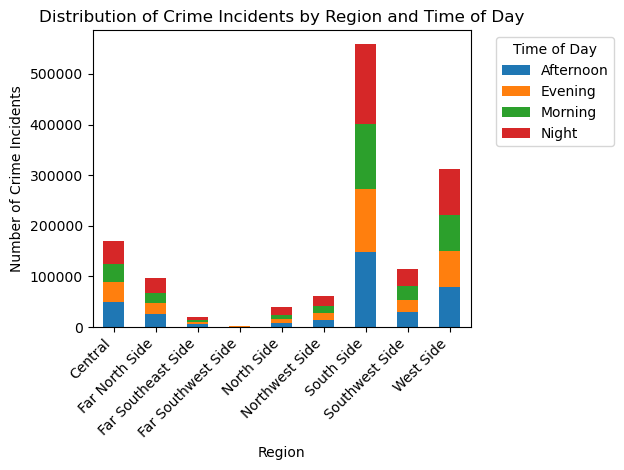

In [38]:
import matplotlib.pyplot as plt

# Group the DataFrame by region and time of day, and count the number of occurrences
grouped_data = df.groupby(["Region", "Time_of_Day"]).size().unstack()

# Plot the stacked bar plot
plt.figure(figsize=(12, 6))
grouped_data.plot(kind="bar", stacked=True)
plt.xlabel("Region")
plt.ylabel("Number of Crime Incidents")
plt.title("Distribution of Crime Incidents by Region and Time of Day")
plt.xticks(rotation=45, ha='right')  # Rotate x-labels and align them to the right
plt.legend(title="Time of Day", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Distribution of Crime Incidents by Region Over the Years

<Figure size 1200x600 with 0 Axes>

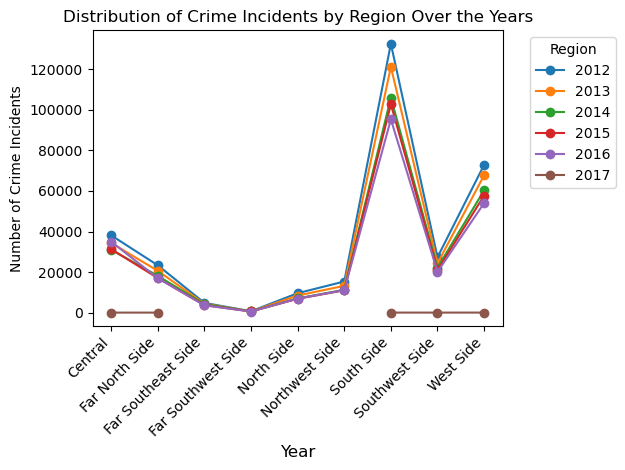

In [41]:
import matplotlib.pyplot as plt

# Group the DataFrame by region and year, and count the number of occurrences
grouped_data = df.groupby(["Region", "Year"]).size().unstack()

# Plot the line plot
plt.figure(figsize=(12, 6))
grouped_data.plot(kind="line", marker="o")
plt.xlabel("Year", fontsize=12)
plt.ylabel("Number of Crime Incidents")
plt.title("Distribution of Crime Incidents by Region Over the Years")
plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate x-labels and align them to the right
plt.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Distribution of Crime Incidents by Region, Month, and Day

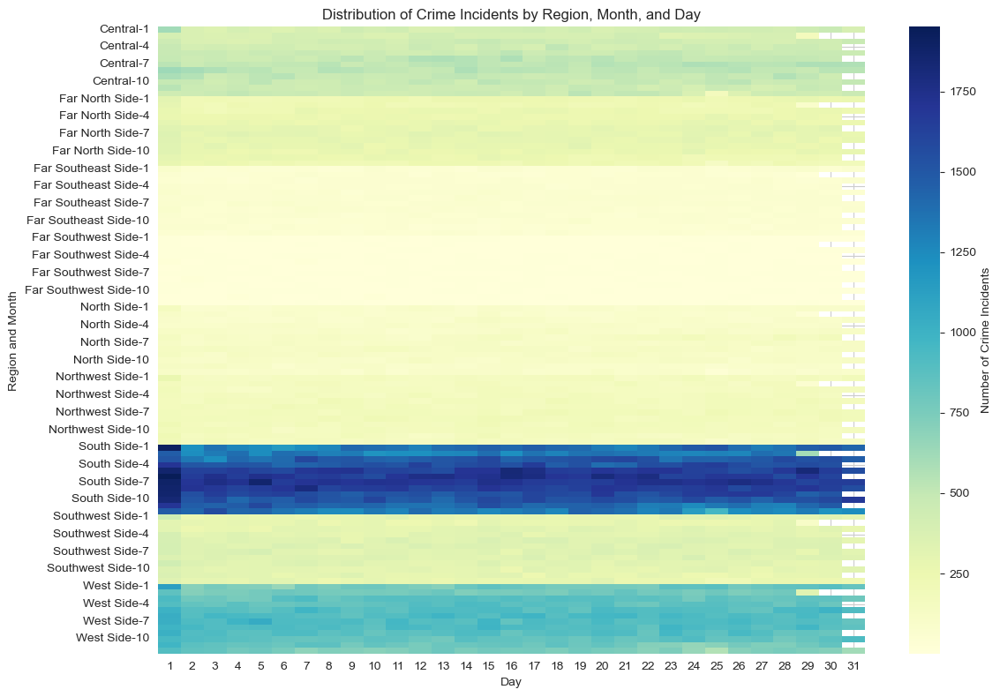

In [55]:
# Group the DataFrame by region, month, and day, and count the number of occurrences
grouped_data = df.groupby(["Region", "Month", "Day"]).size().unstack()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(grouped_data, cmap="YlGnBu", cbar_kws={'label': 'Number of Crime Incidents'})
plt.xlabel("Day")
plt.ylabel("Region and Month")
plt.title("Distribution of Crime Incidents by Region, Month, and Day")
plt.tight_layout()
plt.show()

Correlation

In [15]:
# Arrest

import numpy as np
import pandas as pd
from scipy.stats import pointbiserialr
from scipy.stats import chi2_contingency

# Function to calculate Cramér's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# Calculate correlation for numerical columns with 'Arrest'
point_biserial_results_arrest = {}
for col in numerical_cols:
    correlation_coefficient, p_value = pointbiserialr(df[col], df['Arrest'])
    point_biserial_results_arrest[col] = (correlation_coefficient, p_value)

# Calculate correlation for categorical columns with 'Arrest'
cramers_v_results_arrest = {}
for col in categorical_cols:
    if col != 'Arrest':
        confusion_matrix = pd.crosstab(df[col], df['Arrest'])
        cramers_v_value = cramers_v(confusion_matrix.values)
        cramers_v_results_arrest[col] = cramers_v_value

# Combine the results
combined_results_arrest = {**{k: v[0] for k, v in point_biserial_results_arrest.items()}, **cramers_v_results_arrest}

# Convert to a Pandas Series
cor_target_arrest = pd.Series(combined_results_arrest)

# Set a threshold for selecting highly correlated features (e.g., 0.2)
threshold = 0.2

# Selecting highly correlated features
relevant_features_arrest = cor_target_arrest[abs(cor_target_arrest) > threshold]

# Display results
print("Point-Biserial Correlation Results with 'Arrest' (numerical):")
for col, (corr, p_val) in point_biserial_results_arrest.items():
    print(f"{col}: Correlation = {corr:.3f}, P-value = {p_val:.3f}")

print("\nCramér's V Correlation Results with 'Arrest' (categorical):")
for col, cramers_v_value in cramers_v_results_arrest.items():
    print(f"{col}: Cramér's V = {cramers_v_value:.3f}")

print("\nRelevant Features with 'Arrest' based on Correlation Threshold:")
print(relevant_features_arrest)

Point-Biserial Correlation Results with 'Arrest' (numerical):
Beat: Correlation = -0.021, P-value = 0.000
District: Correlation = -0.021, P-value = 0.000
Ward: Correlation = -0.008, P-value = 0.000
Community Area: Correlation = 0.017, P-value = 0.000
X Coordinate: Correlation = -0.041, P-value = 0.000
Y Coordinate: Correlation = -0.019, P-value = 0.000
Year: Correlation = -0.062, P-value = 0.000
Latitude: Correlation = -0.019, P-value = 0.000
Longitude: Correlation = -0.042, P-value = 0.000
Day: Correlation = -0.002, P-value = 0.267
Month: Correlation = -0.040, P-value = 0.000
Hour: Correlation = 0.085, P-value = 0.000

Cramér's V Correlation Results with 'Arrest' (categorical):
Block: Cramér's V = 0.410
IUCR: Cramér's V = 0.735
Primary Type: Cramér's V = 0.673
Description: Cramér's V = 0.733
Location Description: Cramér's V = 0.296
FBI Code: Cramér's V = 0.669
Updated On: Cramér's V = 0.164
Day_of_Week: Cramér's V = 0.014
Time_of_Day: Cramér's V = 0.059
Time: Cramér's V = 0.413
Catego

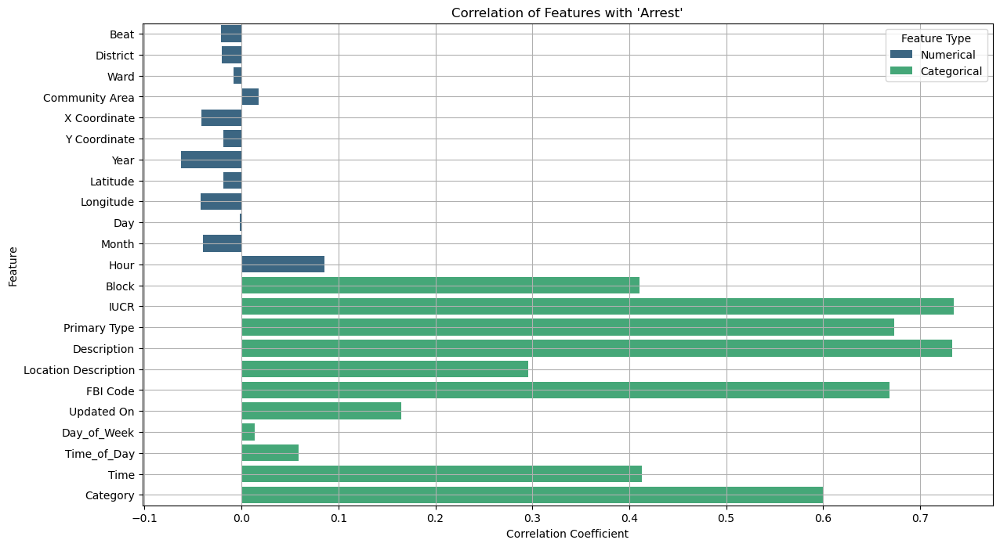

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert Point-Biserial results to DataFrame
point_biserial_df = pd.DataFrame(point_biserial_results_arrest).T
point_biserial_df.columns = ['Correlation', 'P-value']
point_biserial_df = point_biserial_df.reset_index().rename(columns={'index': 'Feature'})
point_biserial_df['Type'] = 'Numerical'

# Convert Cramér's V results to DataFrame
cramers_v_df = pd.DataFrame(list(cramers_v_results_arrest.items()), columns=['Feature', 'Cramér\'s V'])
cramers_v_df = cramers_v_df.rename(columns={'Cramér\'s V': 'Correlation'})
cramers_v_df['Type'] = 'Categorical'

# Combine both DataFrames
combined_df = pd.concat([point_biserial_df, cramers_v_df])

# Plot Correlation
plt.figure(figsize=(14, 8))
sns.barplot(x='Correlation', y='Feature', hue='Type', data=combined_df, palette='viridis')
plt.title("Correlation of Features with 'Arrest'")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Feature")
plt.grid(True)
plt.legend(title='Feature Type')
plt.show()


In [14]:
# Category

# Function to calculate Cramér's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# Calculate correlation for numerical columns
point_biserial_results = {}
for col in numerical_cols:
    correlation_coefficient, p_value = pointbiserialr(df[col], df['Category'])
    point_biserial_results[col] = (correlation_coefficient, p_value)

# Calculate correlation for categorical columns
cramers_v_results = {}
for col in categorical_cols:
    if col != 'Category':
        confusion_matrix = pd.crosstab(df[col], df['Category'])
        cramers_v_value = cramers_v(confusion_matrix.values)
        cramers_v_results[col] = cramers_v_value

# Combine the results
combined_results = {**{k: v[0] for k, v in point_biserial_results.items()}, **cramers_v_results}

# Convert to a Pandas Series
cor_target = pd.Series(combined_results)

# Set a threshold for selecting highly correlated features (e.g., 0.2)
threshold = 0.2

# Selecting highly correlated features
relevant_features = cor_target[abs(cor_target) > threshold]

# Display results
print("Point-Biserial Correlation Results (numerical):")
for col, (corr, p_val) in point_biserial_results.items():
    print(f"{col}: Correlation = {corr:.3f}, P-value = {p_val:.3f}")

print("\nCramér's V Correlation Results (categorical):")
for col, cramers_v_value in cramers_v_results.items():
    print(f"{col}: Cramér's V = {cramers_v_value:.3f}")

print("\nRelevant Features based on Correlation Threshold:")
print(relevant_features)

Point-Biserial Correlation Results (numerical):
Beat: Correlation = 0.045, P-value = 0.000
District: Correlation = 0.045, P-value = 0.000
Ward: Correlation = 0.069, P-value = 0.000
Community Area: Correlation = -0.078, P-value = 0.000
X Coordinate: Correlation = 0.020, P-value = 0.000
Y Coordinate: Correlation = 0.088, P-value = 0.000
Year: Correlation = 0.001, P-value = 0.483
Latitude: Correlation = 0.087, P-value = 0.000
Longitude: Correlation = 0.022, P-value = 0.000
Day: Correlation = 0.004, P-value = 0.007
Month: Correlation = 0.026, P-value = 0.000
Hour: Correlation = -0.020, P-value = 0.000

Cramér's V Correlation Results (categorical):
Block: Cramér's V = 0.390
IUCR: Cramér's V = 1.000
Primary Type: Cramér's V = 1.000
Description: Cramér's V = 0.999
Location Description: Cramér's V = 0.286
FBI Code: Cramér's V = 0.985
Updated On: Cramér's V = 0.102
Day_of_Week: Cramér's V = 0.036
Time_of_Day: Cramér's V = 0.073
Time: Cramér's V = 0.257

Relevant Features based on Correlation Th

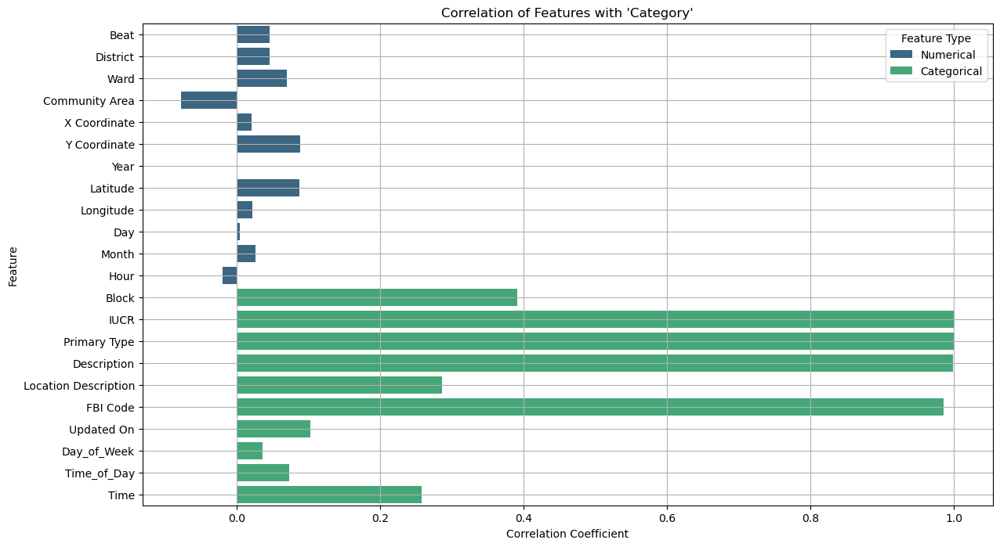

In [21]:
# Convert Point-Biserial results to DataFrame
point_biserial_df = pd.DataFrame(point_biserial_results).T
point_biserial_df.columns = ['Correlation', 'P-value']
point_biserial_df = point_biserial_df.reset_index().rename(columns={'index': 'Feature'})
point_biserial_df['Type'] = 'Numerical'

# Convert Cramér's V results to DataFrame
cramers_v_df = pd.DataFrame(list(cramers_v_results.items()), columns=['Feature', 'Cramér\'s V'])
cramers_v_df = cramers_v_df.rename(columns={'Cramér\'s V': 'Correlation'})
cramers_v_df['Type'] = 'Categorical'

# Combine both DataFrames
combined_df = pd.concat([point_biserial_df, cramers_v_df])

# Plot Correlation
plt.figure(figsize=(14, 8))
sns.barplot(x='Correlation', y='Feature', hue='Type', data=combined_df, palette='viridis')
plt.title("Correlation of Features with 'Category'")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Feature")
plt.grid(True)
plt.legend(title='Feature Type')
plt.show()

In [6]:
# Longitude and Latitude

import numpy as np
import pandas as pd
from scipy.stats import pointbiserialr
from scipy.stats import chi2_contingency

# Function to calculate Cramér's V
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# Function to calculate correlations for a target variable
def calculate_correlations(df, numerical_cols, categorical_cols, target):
    point_biserial_results = {}
    cramers_v_results = {}

    # Calculate correlation for numerical columns with the target
    for col in numerical_cols:
        if df[target].dtype in [np.int64, np.float64]:  # Ensure target is numerical
            correlation_coefficient, p_value = pointbiserialr(df[col], df[target])
            point_biserial_results[col] = (correlation_coefficient, p_value)

    # Calculate correlation for categorical columns with the target
    for col in categorical_cols:
        if df[target].dtype == 'object':  # Ensure target is categorical
            if col != target:
                confusion_matrix = pd.crosstab(df[col], df[target])
                cramers_v_value = cramers_v(confusion_matrix.values)
                cramers_v_results[col] = cramers_v_value

    # Combine the results
    combined_results = {**{k: v[0] for k, v in point_biserial_results.items()}, **cramers_v_results}

    # Convert to a Pandas Series
    cor_target = pd.Series(combined_results)

    return cor_target, point_biserial_results, cramers_v_results

# Define your columns
numerical_cols = ['Beat', 'District', 'Ward', 'Community Area', 'Day', 'Month', 'Hour']
categorical_cols = ['Location Description', 'Day_of_Week', 'Time_of_Day']

# Calculate correlations for 'Longitude' and 'Latitude'
cor_target_longitude, point_biserial_results_longitude, cramers_v_results_longitude = calculate_correlations(df, numerical_cols, categorical_cols, 'Longitude')
cor_target_latitude, point_biserial_results_latitude, cramers_v_results_latitude = calculate_correlations(df, numerical_cols, categorical_cols, 'Latitude')

# Set a threshold for selecting highly correlated features (e.g., 0.2)
threshold = 0.2

# Selecting highly correlated features for each target
relevant_features_longitude = cor_target_longitude[abs(cor_target_longitude) > threshold]
relevant_features_latitude = cor_target_latitude[abs(cor_target_latitude) > threshold]

# Display results
print("\nPoint-Biserial Correlation Results with 'Longitude' (numerical):")
for col, (corr, p_val) in point_biserial_results_longitude.items():
    print(f"{col}: Correlation = {corr:.3f}, P-value = {p_val:.3f}")

print("\nCramér's V Correlation Results with 'Longitude' (categorical):")
for col, cramers_v_value in cramers_v_results_longitude.items():
    print(f"{col}: Cramér's V = {cramers_v_value:.3f}")

print("\nRelevant Features with 'Longitude' based on Correlation Threshold:")
print(relevant_features_longitude)

print("\nPoint-Biserial Correlation Results with 'Latitude' (numerical):")
for col, (corr, p_val) in point_biserial_results_latitude.items():
    print(f"{col}: Correlation = {corr:.3f}, P-value = {p_val:.3f}")

print("\nCramér's V Correlation Results with 'Latitude' (categorical):")
for col, cramers_v_value in cramers_v_results_latitude.items():
    print(f"{col}: Cramér's V = {cramers_v_value:.3f}")

print("\nRelevant Features with 'Latitude' based on Correlation Threshold:")
print(relevant_features_latitude)



Point-Biserial Correlation Results with 'Longitude' (numerical):
Beat: Correlation = -0.551, P-value = 0.000
District: Correlation = -0.554, P-value = 0.000
Ward: Correlation = -0.447, P-value = 0.000
Community Area: Correlation = 0.255, P-value = 0.000
Day: Correlation = 0.001, P-value = 0.564
Month: Correlation = 0.003, P-value = 0.021
Hour: Correlation = -0.002, P-value = 0.253

Cramér's V Correlation Results with 'Longitude' (categorical):

Relevant Features with 'Longitude' based on Correlation Threshold:
Beat             -0.550837
District         -0.553665
Ward             -0.447333
Community Area    0.255362
dtype: float64

Point-Biserial Correlation Results with 'Latitude' (numerical):
Beat: Correlation = 0.641, P-value = 0.000
District: Correlation = 0.642, P-value = 0.000
Ward: Correlation = 0.659, P-value = 0.000
Community Area: Correlation = -0.782, P-value = 0.000
Day: Correlation = 0.001, P-value = 0.444
Month: Correlation = 0.007, P-value = 0.000
Hour: Correlation = -0

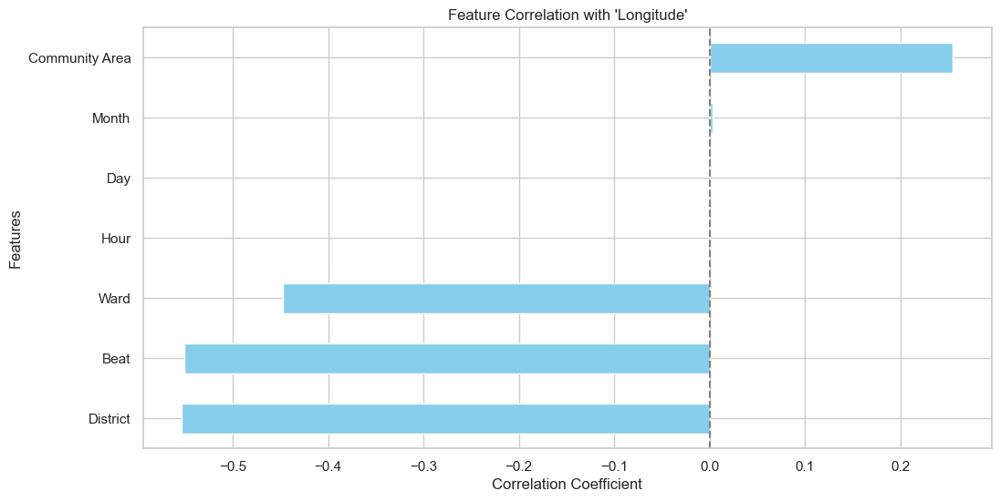

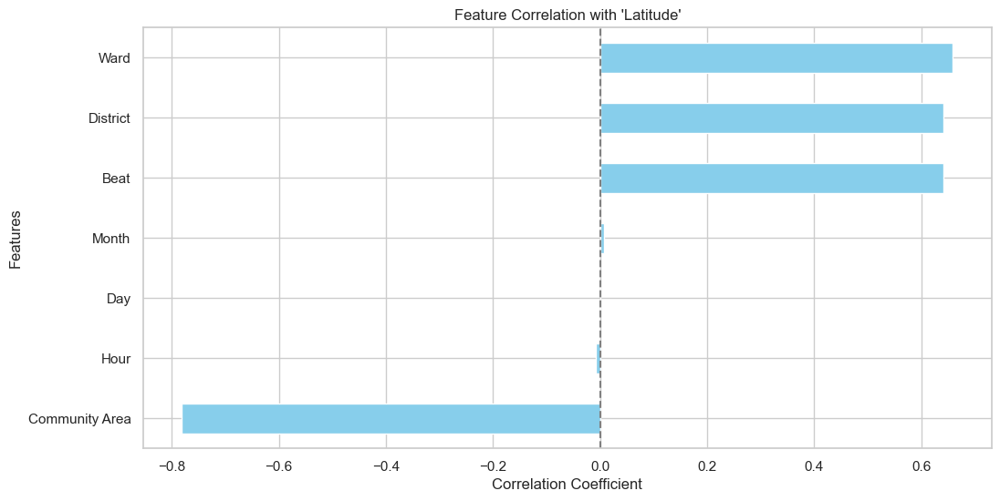

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the plotting style
sns.set(style="whitegrid")

# Function to plot correlations
def plot_correlations(cor_target, title, xlabel, ylabel):
    plt.figure(figsize=(12, 6))
    cor_target.sort_values().plot(kind='barh', color='skyblue')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.axvline(x=0, color='grey', linestyle='--')
    plt.show()

# Plot correlations with 'Longitude'
plot_correlations(cor_target_longitude, 
                  "Feature Correlation with 'Longitude'", 
                  "Correlation Coefficient", 
                  "Features")

# Plot correlations with 'Latitude'
plot_correlations(cor_target_latitude, 
                  "Feature Correlation with 'Latitude'", 
                  "Correlation Coefficient", 
                  "Features")

# Data Preprocessing

Feature Engineering

In [75]:
df["Date"] = pd.to_datetime(df["Date"])

df["Day"] = df["Date"].dt.day
df["Month"] = df["Date"].dt.month
df["Time"] = df["Date"].dt.time
df["Day_of_Week"] = df["Date"].dt.day_name()

def categorize_time(hour):
    if 5 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 17:
        return "Afternoon"
    elif 17 <= hour < 21:
        return "Evening"
    else:
        return "Night"
df["Hour"] = df["Date"].dt.hour
df["Time_of_Day"] = df["Hour"].apply(categorize_time)


C:\Users\yibei\AppData\Local\Temp\ipykernel_30520\3395243906.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["Date"] = pd.to_datetime(df["Date"])


Missing values

In [3]:
df.isnull().sum()

Unnamed: 0                  0
ID                          0
Case Number                 1
Date                        0
Block                       0
IUCR                        0
Primary Type                0
Description                 0
Location Description     1658
Arrest                      0
Domestic                    0
Beat                        0
District                    1
Ward                       14
Community Area             40
FBI Code                    0
X Coordinate            37083
Y Coordinate            37083
Year                        0
Updated On                  0
Latitude                37083
Longitude               37083
Location                37083
dtype: int64

In [4]:
def impute_location_info(df):
    for index, row in df.iterrows():
        # Check if latitude and longitude are missing for the current row
        if pd.isna(row['Latitude']) and pd.isna(row['Longitude']):
            # Find the block address of the current row
            block_address = row['Block']
            # Find the corresponding row(s) with the same block address
            matching_rows = df[df['Block'] == block_address]
            # Check if there are any matching rows with non-missing latitude and longitude
            matching_rows = matching_rows.dropna(subset=['Latitude', 'Longitude'])
            if not matching_rows.empty:
                # Take the latitude and longitude values from the first matching row
                matching_row = matching_rows.iloc[0]
                df.at[index, 'Latitude'] = matching_row['Latitude']
                df.at[index, 'Longitude'] = matching_row['Longitude']
                df.at[index, 'X Coordinate'] = matching_row['X Coordinate']
                df.at[index, 'Y Coordinate'] = matching_row['Y Coordinate']
    return df

# Call the function to impute missing location-related information
df = impute_location_info(df)

# Check if there are any remaining missing values
print("Remaining missing values after imputation:")
print(df.isnull().sum())


Remaining missing values after imputation:
Unnamed: 0                  0
ID                          0
Case Number                 1
Date                        0
Block                       0
IUCR                        0
Primary Type                0
Description                 0
Location Description     1658
Arrest                      0
Domestic                    0
Beat                        0
District                    1
Ward                       14
Community Area             40
FBI Code                    0
X Coordinate              164
Y Coordinate              164
Year                        0
Updated On                  0
Latitude                  164
Longitude                 164
Location                37083
dtype: int64


In [77]:
def impute_coordinate_info(df):
    for index, row in df.iterrows():
        if pd.isna(row['X Coordinate']) and pd.notna(row['Latitude']) and pd.notna(row['Longitude']):
            latitude = row['Latitude']
            longitude = row['Longitude']
            matching_rows = df[(df['Latitude'] == latitude) & (df['Longitude'] == longitude)]
            matching_rows = matching_rows.dropna(subset=['X Coordinate', 'Y Coordinate'])
            if not matching_rows.empty:
                matching_row = matching_rows.iloc[0]
                df.at[index, 'X Coordinate'] = matching_row['X Coordinate']
                df.at[index, 'Y Coordinate'] = matching_row['Y Coordinate']
    return df

# Call the function to impute missing coordinate-related information
df = impute_coordinate_info(df)

# Check if there are any remaining missing values
print("Remaining missing values after imputation:")
print(df.isnull().sum())


Remaining missing values after imputation:
Unnamed: 0                  0
ID                          0
Case Number                 1
Date                        0
Block                       0
IUCR                        0
Primary Type                0
Description                 0
Location Description     1658
Arrest                      0
Domestic                    0
Beat                        0
District                    1
Ward                       14
Community Area             40
FBI Code                    0
X Coordinate              164
Y Coordinate              164
Year                        0
Updated On                  0
Latitude                  164
Longitude                 164
Location                37083
geometry                    0
index_right             40789
community               40789
Region                  80808
Day                         0
Month                       0
Time                        0
Day_of_Week                 0
Hour                       

In [86]:
df = df.dropna(subset=["Location Description", "District", "Community Area", 
                                "Ward", "X Coordinate", "Y Coordinate", 
                                "Latitude", "Longitude"])

print(df.isnull().sum())

Unnamed: 0                  0
ID                          0
Case Number                 0
Date                        0
Block                       0
IUCR                        0
Primary Type                0
Description                 0
Location Description        0
Arrest                      0
Domestic                    0
Beat                        0
District                    0
Ward                        0
Community Area              0
FBI Code                    0
X Coordinate                0
Y Coordinate                0
Year                        0
Updated On                  0
Latitude                    0
Longitude                   0
Location                36515
geometry                    0
index_right             40206
community               40206
Region                  80171
Day                         0
Month                       0
Time                        0
Day_of_Week                 0
Hour                        0
Time_of_Day                 0
dtype: int

Outliers

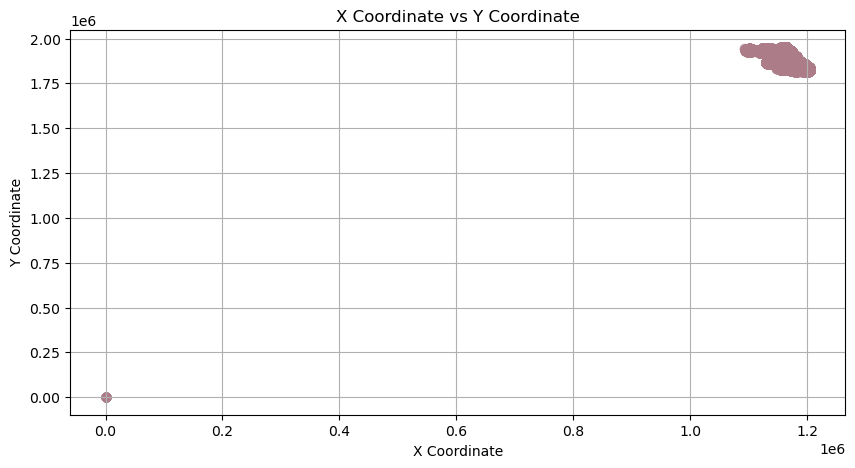

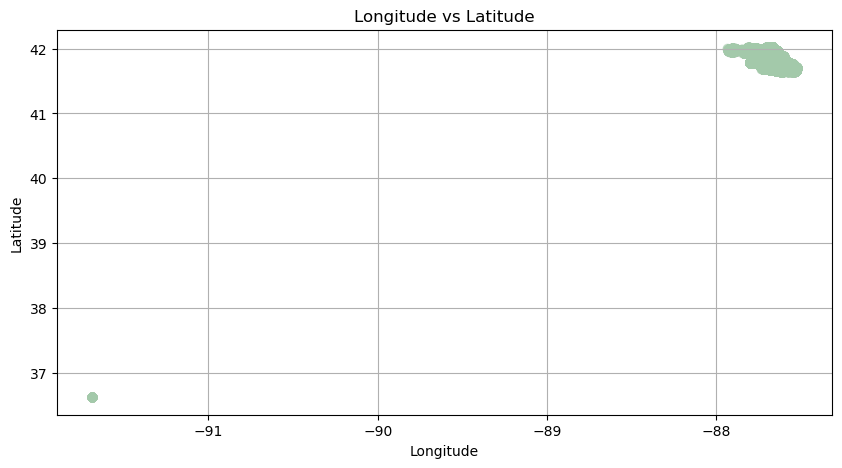

In [89]:
import matplotlib.pyplot as plt

# Plot using X Coordinate and Y Coordinate
plt.figure(figsize=(10, 5))
plt.scatter(df["X Coordinate"], df["Y Coordinate"], color='#AC7D88', alpha=0.5)
plt.title('X Coordinate vs Y Coordinate')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.show()

# Plot using Latitude and Longitude
plt.figure(figsize=(10, 5))
plt.scatter(df["Longitude"], df["Latitude"], color='#A3C9AA', alpha=0.5)
plt.title('Longitude vs Latitude')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


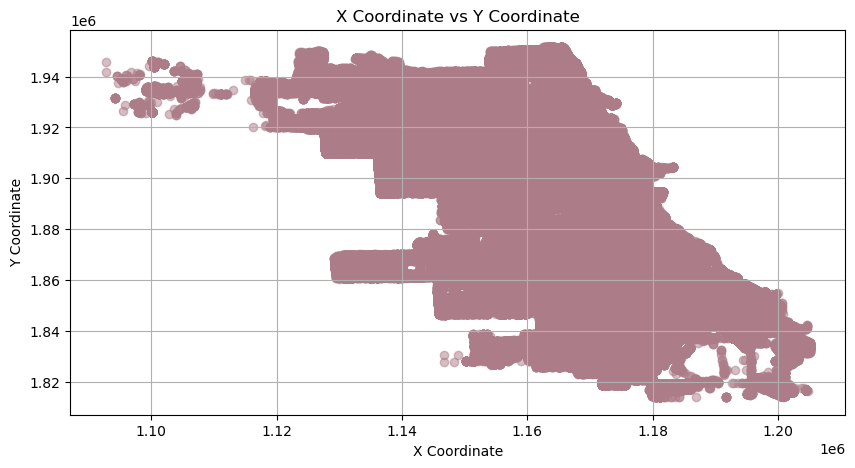

In [90]:
# Remove outliers at (0,0) coordinates
df = df[(df["X Coordinate"] != 0) & (df["Y Coordinate"] != 0)]

# Plot using X Coordinate and Y Coordinate
plt.figure(figsize=(10, 5))
plt.scatter(df["X Coordinate"], df["Y Coordinate"], color='#AC7D88', alpha=0.5)
plt.title('X Coordinate vs Y Coordinate')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')
plt.grid(True)
plt.show()


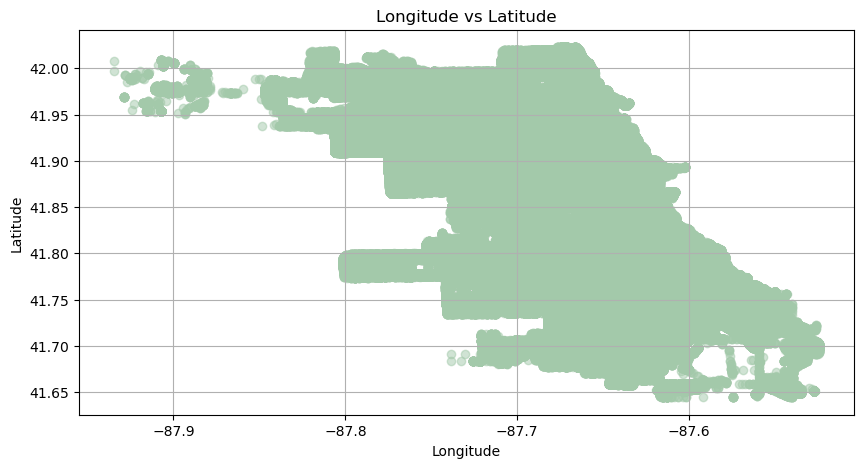

In [91]:
# Remove outliers below 37 latitude and -91 longitude
df = df[(df["Latitude"] >= 37) & (df["Longitude"] >= -91)]

# Plot using Latitude and Longitude
plt.figure(figsize=(10, 5))
plt.scatter(df["Longitude"], df["Latitude"], color='#A3C9AA', alpha=0.5)
plt.title('Longitude vs Latitude')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.grid(True)
plt.show()


Data Transformation

In [92]:
unique_primary_types = sorted(df["Primary Type"].unique())
for primary_type in unique_primary_types:
    print(primary_type)


ARSON
ASSAULT
BATTERY
BURGLARY
CONCEALED CARRY LICENSE VIOLATION
CRIM SEXUAL ASSAULT
CRIMINAL DAMAGE
CRIMINAL TRESPASS
DECEPTIVE PRACTICE
GAMBLING
HOMICIDE
HUMAN TRAFFICKING
INTERFERENCE WITH PUBLIC OFFICER
INTIMIDATION
KIDNAPPING
LIQUOR LAW VIOLATION
MOTOR VEHICLE THEFT
NARCOTICS
NON - CRIMINAL
NON-CRIMINAL
NON-CRIMINAL (SUBJECT SPECIFIED)
OBSCENITY
OFFENSE INVOLVING CHILDREN
OTHER NARCOTIC VIOLATION
OTHER OFFENSE
PROSTITUTION
PUBLIC INDECENCY
PUBLIC PEACE VIOLATION
ROBBERY
SEX OFFENSE
STALKING
THEFT
WEAPONS VIOLATION


In [93]:
df["Primary Type"].replace({"NON - CRIMINAL": "NON-CRIMINAL", 
                            "NON-CRIMINAL (SUBJECT SPECIFIED)": "NON-CRIMINAL",
                            "OTHER NARCOTIC VIOLATION": "NARCOTICS"}, inplace=True)

print(df["Primary Type"].unique())


['BATTERY' 'PUBLIC PEACE VIOLATION' 'THEFT' 'WEAPONS VIOLATION' 'ROBBERY'
 'MOTOR VEHICLE THEFT' 'ASSAULT' 'OTHER OFFENSE' 'DECEPTIVE PRACTICE'
 'CRIMINAL DAMAGE' 'CRIMINAL TRESPASS' 'BURGLARY' 'STALKING'
 'CRIM SEXUAL ASSAULT' 'NARCOTICS' 'SEX OFFENSE' 'OBSCENITY'
 'OFFENSE INVOLVING CHILDREN' 'KIDNAPPING' 'HOMICIDE'
 'INTERFERENCE WITH PUBLIC OFFICER' 'PROSTITUTION' 'GAMBLING'
 'INTIMIDATION' 'ARSON' 'LIQUOR LAW VIOLATION' 'NON-CRIMINAL'
 'PUBLIC INDECENCY' 'HUMAN TRAFFICKING'
 'CONCEALED CARRY LICENSE VIOLATION']


Data Categorization

In [94]:
category_mapping = {
    "Forbidden practices": ["NARCOTICS", "PROSTITUTION", "GAMBLING", "OBSCENITY","LIQUOR LAW VIOLATION"],
    "Theft": ["BURGLARY", "DECEPTIVE PRACTICE", "MOTOR VEHICLE THEFT", "ROBBERY","THEFT"],
    "Assault": ["BATTERY", "CRIM SEXUAL ASSAULT", "OFFENSE INVOLVING CHILDREN", "SEX OFFENSE", "HOMICIDE", "HUMAN TRAFFICKING","ASSAULT"],
    "Public peace violation": ["WEAPONS VIOLATION", "CRIMINAL DAMAGE", "CRIMINAL TRESPASS", "ARSON", "KIDNAPPING", 
                               "STALKING", "INTIMIDATION", "PUBLIC INDECENCY","PUBLIC PEACE VIOLATION", 
                               "INTERFERENCE WITH PUBLIC OFFICER", "CONCEALED CARRY LICENSE VIOLATION"]
}

def categorize_primary_type(primary_type):
    for category, types in category_mapping.items():
        if primary_type in types:
            return category
    return primary_type  

df["Category"] = df["Primary Type"].apply(categorize_primary_type)

print(df["Category"].unique())


['Assault' 'Public peace violation' 'Theft' 'OTHER OFFENSE'
 'Forbidden practices' 'NON-CRIMINAL']


Feature Selection

In [96]:
print("Columns in the DataFrame:")
print(df.columns)

Columns in the DataFrame:
Index(['Unnamed: 0', 'ID', 'Case Number', 'Date', 'Block', 'IUCR',
       'Primary Type', 'Description', 'Location Description', 'Arrest',
       'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'FBI Code',
       'X Coordinate', 'Y Coordinate', 'Year', 'Updated On', 'Latitude',
       'Longitude', 'Location', 'geometry', 'index_right', 'community',
       'Region', 'Day', 'Month', 'Time', 'Day_of_Week', 'Hour', 'Time_of_Day',
       'Category'],
      dtype='object')


In [97]:
df= df[df['Category'] != 'NON-CRIMINAL']

In [98]:
df= df[df['Category'] != 'OTHER OFFENSE']

In [99]:
columns_to_remove = ['Unnamed: 0', 'ID', 'Case Number','Location', 'index_right','geometry','community','Region']

df = df.drop(columns=columns_to_remove)

print("Columns in the DataFrame:")
print(df.columns)

Columns in the DataFrame:
Index(['Date', 'Block', 'IUCR', 'Primary Type', 'Description',
       'Location Description', 'Arrest', 'Domestic', 'Beat', 'District',
       'Ward', 'Community Area', 'FBI Code', 'X Coordinate', 'Y Coordinate',
       'Year', 'Updated On', 'Latitude', 'Longitude', 'Day', 'Month', 'Time',
       'Day_of_Week', 'Hour', 'Time_of_Day', 'Category'],
      dtype='object')


Encode

In [3]:
# Target Encoding

# Convert boolean columns to integers
df['Arrest'] = df['Arrest'].astype(int)
df['Domestic'] = df['Domestic'].astype(int)

# List of numerical and categorical columns 
numerical_cols = ['Beat', 'District', 'Ward', 'Community Area', 'X Coordinate', 'Y Coordinate', 'Year', 'Latitude', 'Longitude', 'Day', 'Month', 'Hour']
categorical_cols = ['Block', 'IUCR', 'Primary Type', 'Description', 'Location Description', 'FBI Code', 'Updated On', 'Day_of_Week', 
                    'Time_of_Day', 'Time', 'Category']

# Convert numerical columns to numeric types and handle missing values
for col in numerical_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Encode categorical columns as numerical values
encoded_cols = {}
for col in categorical_cols:
    df[col], encoded_map = df[col].astype('category').cat.codes, df[col].astype('category').cat.categories
    encoded_cols[col] = dict(zip(encoded_map, range(len(encoded_map))))


df.head()

,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,...,Updated On,Latitude,Longitude,Day,Month,Time,Day_of_Week,Hour,Time_of_Day,Category
0,2016-05-03 23:40:00,6436,51,2,113,17,1,1,1022,10.0,...,305,41.864073,-87.706819,3,5,4507,5,23,3,0
1,2016-05-03 21:40:00,24277,51,2,113,111,0,1,313,3.0,...,305,41.782922,-87.604363,3,5,4228,5,21,3,0
2,2016-05-03 23:31:00,21784,42,22,231,127,0,0,1524,15.0,...,305,41.894908,-87.758372,3,5,4493,5,23,3,2
3,2016-05-03 22:10:00,20409,39,2,246,123,0,0,1532,15.0,...,305,41.885687,-87.749516,3,5,4310,5,22,3,0
4,2016-05-03 22:00:00,1902,83,26,0,111,0,1,1523,15.0,...,305,41.886297,-87.761751,3,5,4287,5,22,3,3


Reduction

In [4]:
total_entries = df.shape[0]
print(f'Total number of entries: {total_entries}')

Total number of entries: 1366807


In [50]:
df = df.sample(n=500000, random_state=42)

Save preprocessed dataset into CSV file

In [4]:
df.to_csv('preprocesseddataset.csv', index=False)

# Model Building

## Arrest Prediction

Partition

In [11]:
X = df[['Location Description', 'Domestic', 'Beat','District','Ward','Community Area','Day','Month','Day_of_Week','Hour','Time_of_Day']]
y = df['Arrest']

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape (X_train, y_train):", X_train.shape, y_train.shape)
print("Testing set shape (X_test, y_test):", X_test.shape, y_test.shape)

Training set shape (X_train, y_train): (350000, 11) (350000,)
Testing set shape (X_test, y_test): (150000, 11) (150000,)


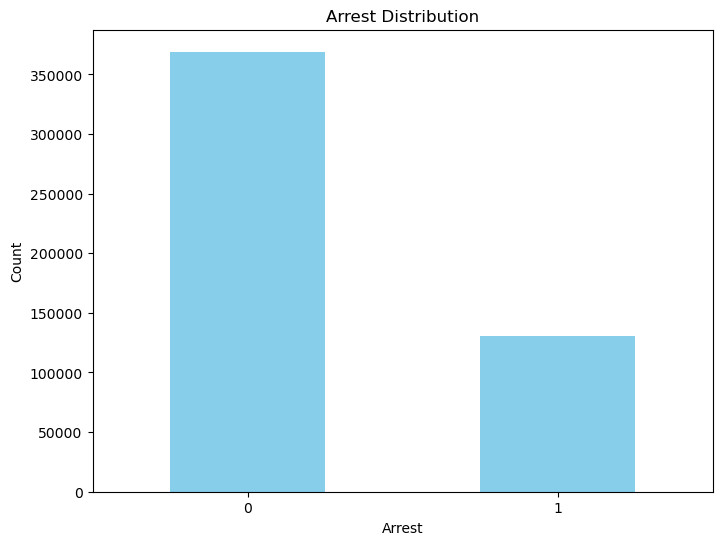

In [7]:
# Count occurrences of each class in 'Arrest'
category_counts = df['Arrest'].value_counts()

# Plotting the bar chart
plt.figure(figsize=(8, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Arrest Distribution')
plt.xlabel('Arrest')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()

In [12]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

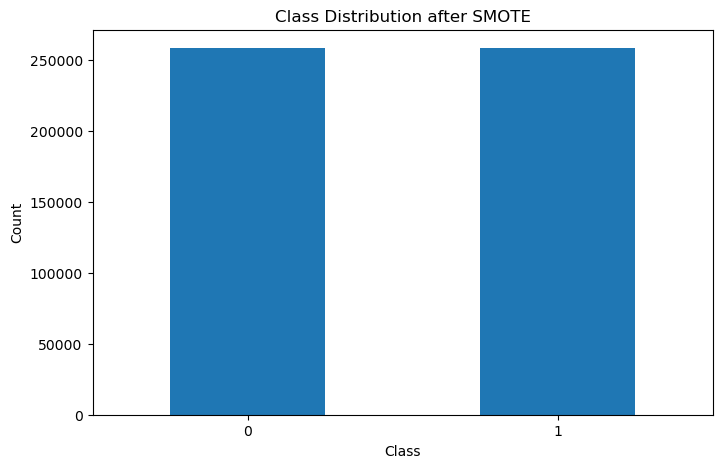

Class Distribution:
Arrest
0    258259
1    258259
Name: count, dtype: int64


In [9]:
# Count the occurrences of each class after SMOTE
class_counts = pd.Series(y_train_resampled).value_counts()

# Plot the class distribution
plt.figure(figsize=(8, 5))
class_counts.plot(kind='bar', rot=0)
plt.title('Class Distribution after SMOTE')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

# Print the class counts
print("Class Distribution:")
print(class_counts)

Random Forest

In [10]:
# Random Forest Base Model

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

rf_classifier = RandomForestClassifier(random_state=42)

# Train the model on the training data
rf_classifier.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test data
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.73326

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.84      0.82    110763
           1       0.49      0.43      0.46     39237

    accuracy                           0.73    150000
   macro avg       0.65      0.64      0.64    150000
weighted avg       0.72      0.73      0.73    150000



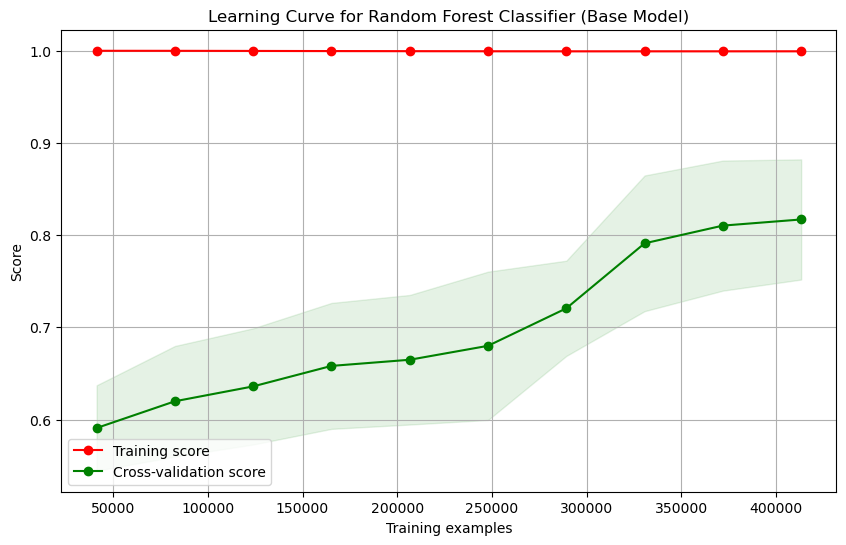

In [41]:
# Learning Curve of Random Forest Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestClassifier

# Define RandomForestClassifier base model
base_rf_clf = RandomForestClassifier(random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(base_rf_clf, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Classifier (Base Model)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [11]:
#Grid Search for Random Forest

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Parameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Instantiate the Random Forest classifier
rf_tuning = RandomForestClassifier(random_state=42)

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=rf_tuning, param_grid=param_grid, 
                           scoring='accuracy', cv=5, verbose=2, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters and best cross-validation score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-validation Score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Print test set accuracy and classification report
print("\nTest Set Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best Cross-validation Score: 0.8183821375776278

Test Set Accuracy: 0.7337333333333333

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.84      0.82    110763
           1       0.49      0.44      0.46     39237

    accuracy                           0.73    150000
   macro avg       0.65      0.64      0.64    150000
weighted avg       0.72      0.73      0.73    150000



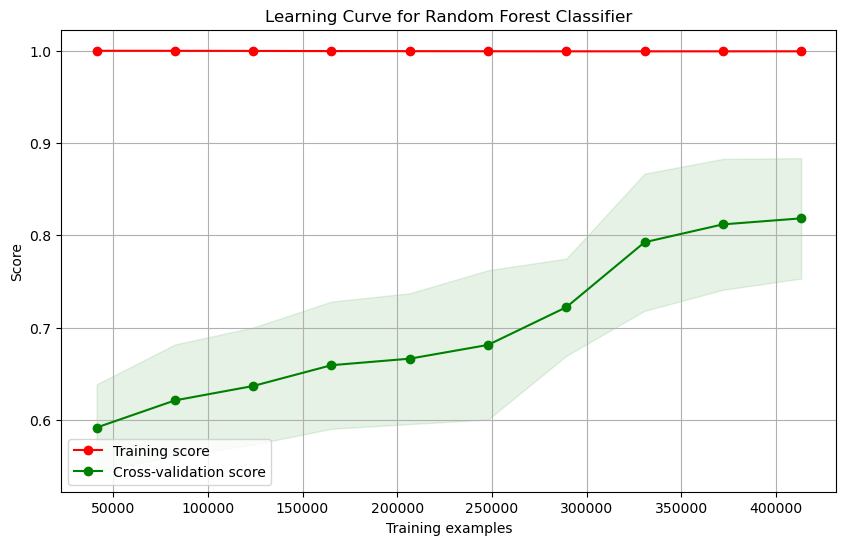

In [19]:
# Learning Curve after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestClassifier

# Define your RandomForestClassifier with the best parameters
best_params = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
rf_clf = RandomForestClassifier(**best_params, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(rf_clf, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


In [13]:
# Avoid overfitting with using borderline SMOTE

from imblearn.over_sampling import BorderlineSMOTE
from sklearn.model_selection import train_test_split

smote = BorderlineSMOTE(random_state=42, sampling_strategy='minority')

X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)



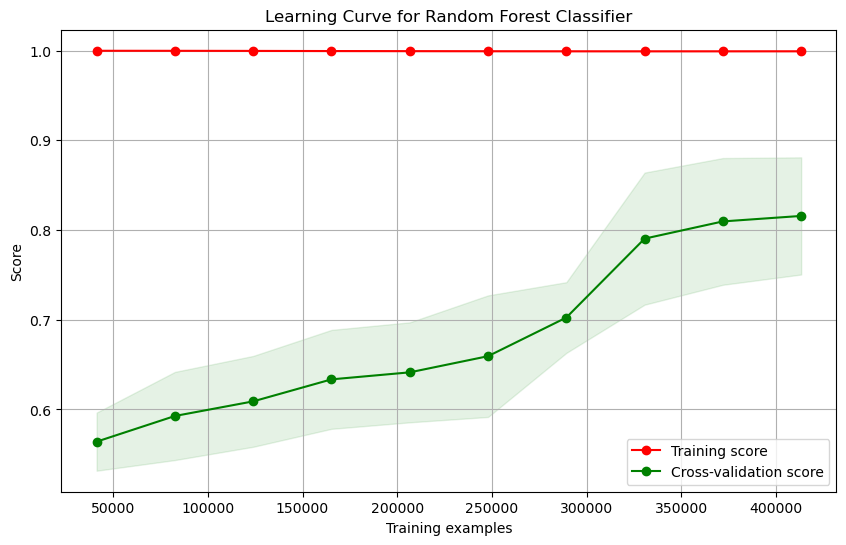

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestClassifier

# Define your RandomForestClassifier with the best parameters
best_params = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
rf_clf = RandomForestClassifier(**best_params, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(rf_clf, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [16]:
# Train the model on the resampled training data
rf_clf.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = rf_clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.72812

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.83      0.82    110763
           1       0.48      0.44      0.46     39237

    accuracy                           0.73    150000
   macro avg       0.64      0.64      0.64    150000
weighted avg       0.72      0.73      0.72    150000



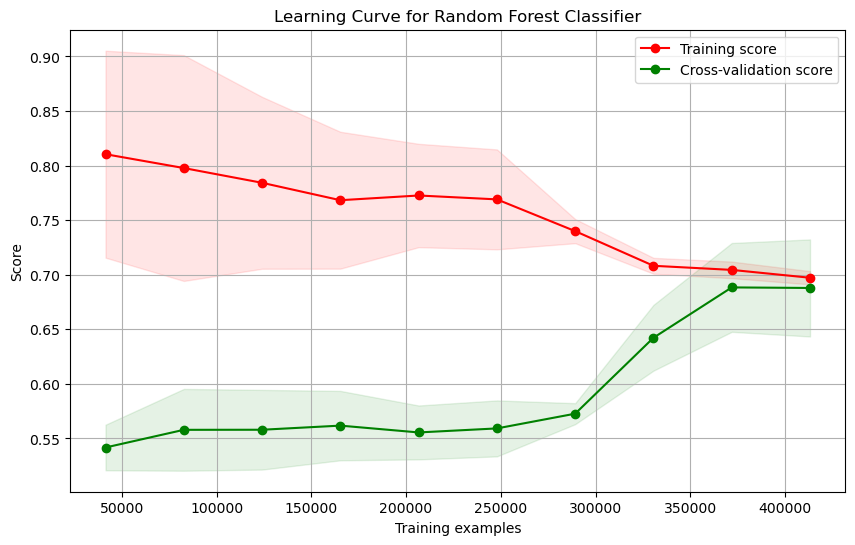

Accuracy on test set: 0.67
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.70      0.76    110763
           1       0.41      0.58      0.48     39237

    accuracy                           0.67    150000
   macro avg       0.61      0.64      0.62    150000
weighted avg       0.71      0.67      0.68    150000



In [40]:
# Avoid overfitting by adjusting parameters

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, classification_report

# RandomForestClassifier with adjusted parameters

best_params = {'max_depth': 10, 
               'min_samples_leaf': 5, 
               'min_samples_split': 10, 
               'n_estimators': 150}

rf_clf = RandomForestClassifier(**best_params, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(rf_clf, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

# Train the model on the resampled data with adjusted parameters
rf_clf.fit(X_train_resampled, y_train_resampled)

# Predict on the test set
y_pred = rf_clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy on test set: {accuracy:.2f}")

# Generate classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


In [23]:
# Random Search for Random Forest within the test range

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report
import numpy as np

# Define the parameter grid to search
param_grid = {
    'n_estimators': [150, 200, 250],
    'max_depth': [10, 20, 30],
    'min_samples_split': [5, 10, 15],
    'min_samples_leaf': [5, 10]
}

# Initialize the RandomForestClassifier
rf_clf = RandomForestClassifier(random_state=42)

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf_clf,
    param_distributions=param_grid,
    n_iter=10, 
    cv=5, 
    scoring='accuracy',
    random_state=42,
    n_jobs=-1, 
    verbose=2  
)

# Perform Random Search
random_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and the best score
best_params = random_search.best_params_
best_score = random_search.best_score_

print("Best Parameters:", best_params)
print("Best Cross-Validation Score:", best_score)

# Use the best model from Random Search to make predictions
best_rf_clf = random_search.best_estimator_
y_pred = best_rf_clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'n_estimators': 250, 'min_samples_split': 15, 'min_samples_leaf': 5, 'max_depth': 30}
Best Cross-Validation Score: 0.7804299201996783
Accuracy: 0.7321666666666666

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.82      0.82    110763
           1       0.49      0.49      0.49     39237

    accuracy                           0.73    150000
   macro avg       0.65      0.66      0.65    150000
weighted avg       0.73      0.73      0.73    150000



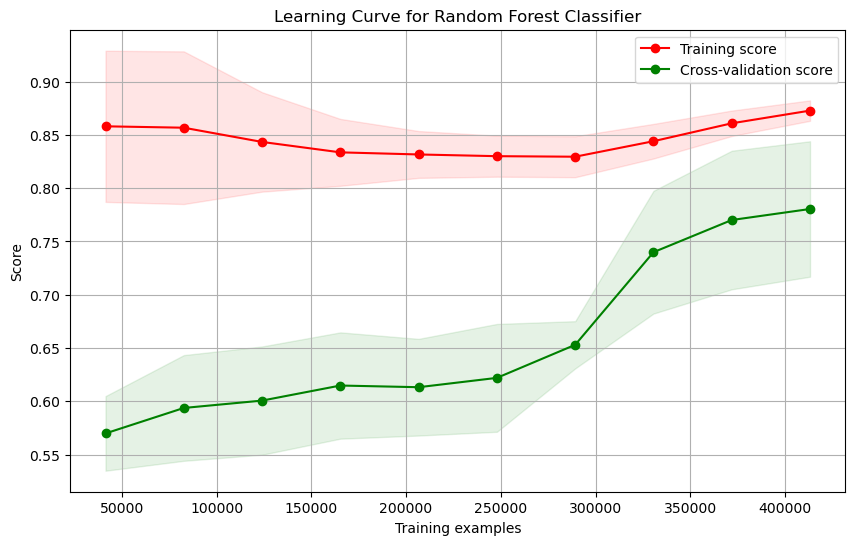

In [24]:
# Learning curve of the best parameter (avoid overfitting)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import learning_curve

# Define the RandomForestClassifier with the best parameters
best_params = {
    'n_estimators': 250,
    'min_samples_split': 15,
    'min_samples_leaf': 5,
    'max_depth': 30
}
rf_clf_best = RandomForestClassifier(**best_params, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_clf_best, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

KNN

In [9]:
# KNN Base Model

from sklearn.neighbors import KNeighborsClassifier

# Create KNN classifier
knn = KNeighborsClassifier()

# Fit the model using the resampled training data
knn.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = knn.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.62114

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.64      0.71    110763
           1       0.36      0.57      0.44     39237

    accuracy                           0.62    150000
   macro avg       0.58      0.60      0.58    150000
weighted avg       0.69      0.62      0.64    150000



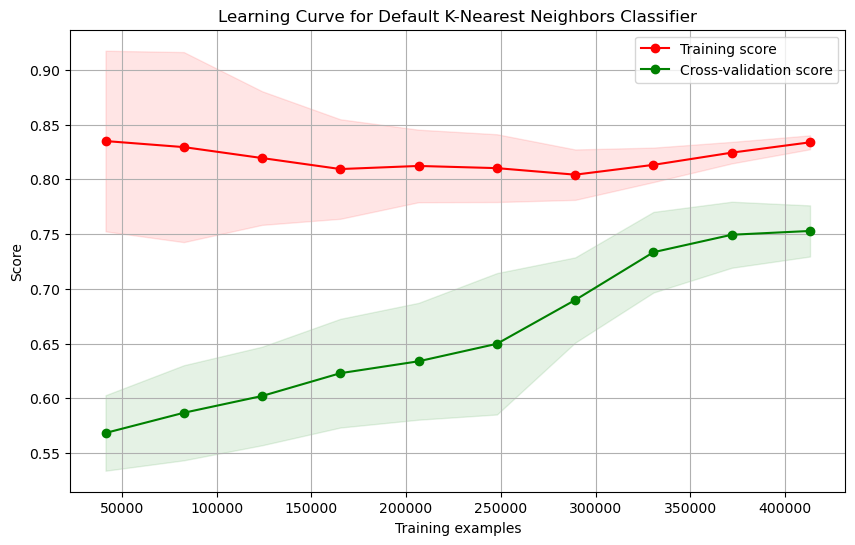

In [68]:
# KNN Base Model Learning Curve

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier

# Define default KNeighborsClassifier
knn_clf = KNeighborsClassifier()

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(knn_clf, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Default K-Nearest Neighbors Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


In [12]:
# Grid Search for KNN

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2]  # p=1 for Manhattan, p=2 for Euclidean
}

# Create KNN classifier
knn_tuning = KNeighborsClassifier()

# Create GridSearchCV
grid_search = GridSearchCV(estimator=knn_tuning, param_grid=param_grid
                           , cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Predict on the test data using the best estimator
y_pred = best_estimator.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)
print("Best Cross-validation Score:", grid_search.best_score_)

# Print best parameters
print("\nBest Parameters:", best_params)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Accuracy: 0.6569
Best Cross-validation Score: 0.8081906811353301

Best Parameters: {'algorithm': 'brute', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.72      0.76    110763
           1       0.38      0.49      0.43     39237

    accuracy                           0.66    150000
   macro avg       0.59      0.60      0.59    150000
weighted avg       0.69      0.66      0.67    150000



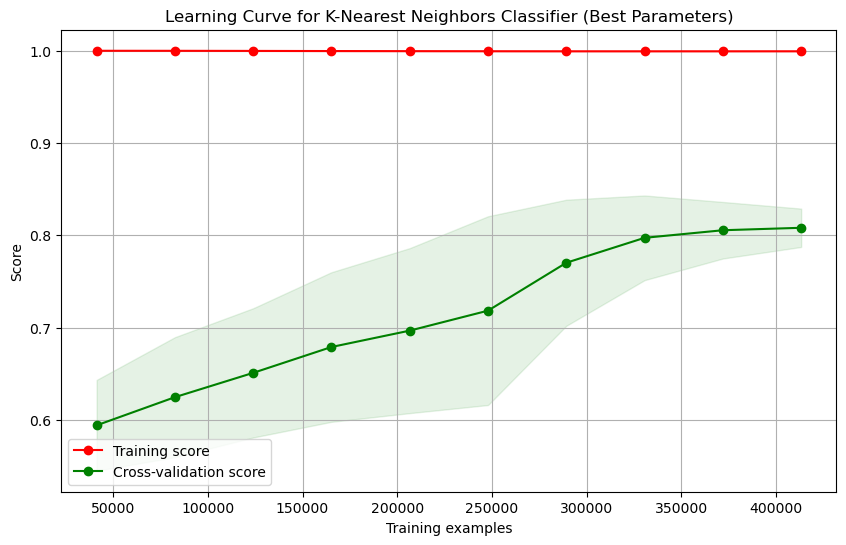

In [70]:
# Learning curve of KNN after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier

# Define KNeighborsClassifier with specified parameters
best_params = {'algorithm': 'brute', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
knn_clf = KNeighborsClassifier(**best_params)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(knn_clf, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for K-Nearest Neighbors Classifier (Best Parameters)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


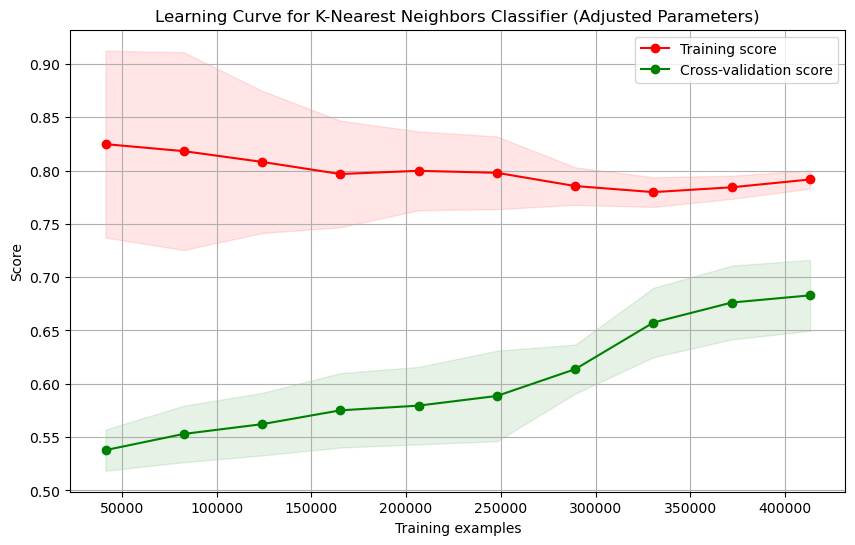

In [27]:
# Avoid overfitting by adjusting parameters

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# Define KNeighborsClassifier with adjusted parameters
best_params = {'algorithm': 'brute', 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
knn_clf = KNeighborsClassifier(**best_params)

# Optionally scale the data
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(knn_clf, X_train_resampled_scaled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for K-Nearest Neighbors Classifier (Adjusted Parameters)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [7]:
# Random Search to find best parameter within the test range

from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
import numpy as np

# Define the parameter grid
param_dist = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'p': [1, 2],
    'weights': ['uniform'],
    'algorithm': ['auto']
}

# Create a KNeighborsClassifier instance
knn_clf = KNeighborsClassifier()

# Create the RandomizedSearchCV instance
random_search = RandomizedSearchCV(
    estimator=knn_clf,
    param_distributions=param_dist,
    n_iter=20,               
    cv=5,                     
    verbose=3,                
    random_state=42,         
    n_jobs=-1                
)

# Fit the RandomizedSearchCV instance to the data
random_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Use the best estimator to make predictions and evaluate
best_knn = random_search.best_estimator_
y_pred = best_knn.predict(X_test)

from sklearn.metrics import accuracy_score, classification_report

# Print accuracy and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 10 is smaller than n_iter=20. Running 10 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'weights': 'uniform', 'p': 1, 'n_neighbors': 3, 'algorithm': 'auto'}
Best Score: 0.7906888738228088
Accuracy: 0.6472266666666666

Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.69      0.74    110763
           1       0.37      0.51      0.43     39237

    accuracy                           0.65    150000
   macro avg       0.59      0.60      0.59    150000
weighted avg       0.69      0.65      0.66    150000



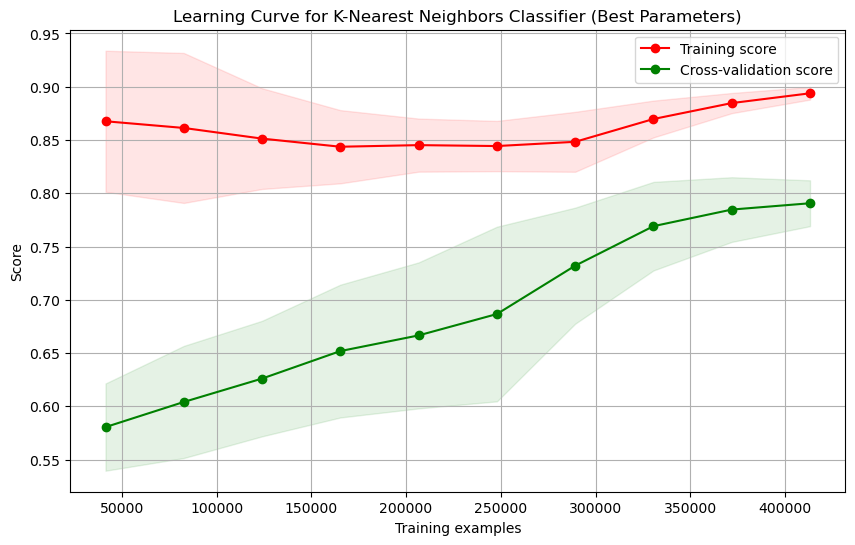

In [9]:
# Leanring curve of the best parameter (avoid overfitting)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier

# Define KNN classifier with best parameters
best_params = {'weights': 'uniform', 'p': 1, 'n_neighbors': 3, 'algorithm': 'auto'}
knn_clf = KNeighborsClassifier(**best_params)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    knn_clf, X_train_resampled, y_train_resampled, 
    train_sizes=np.linspace(0.1, 1.0, 10), 
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for K-Nearest Neighbors Classifier (Best Parameters)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

*Adaboost

In [10]:
# AdaBoost Base Model

from sklearn.ensemble import AdaBoostClassifier 
from sklearn.tree import DecisionTreeClassifier

base_estimator = DecisionTreeClassifier(max_depth=1) 
adaboost = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Fit the model using the resampled training data
adaboost.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = adaboost.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

c:\Users\yibei\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Accuracy: 0.6474866666666667

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.67      0.74    110763
           1       0.39      0.58      0.46     39237

    accuracy                           0.65    150000
   macro avg       0.60      0.63      0.60    150000
weighted avg       0.71      0.65      0.67    150000



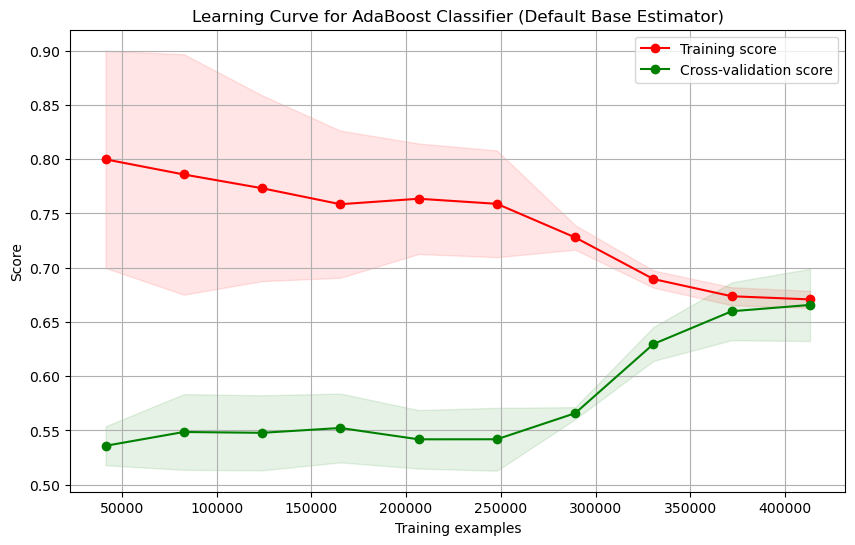

In [72]:
# Learning Curve of AdaBoost Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# Define AdaBoostClassifier with default base estimator
adaboost = AdaBoostClassifier(n_estimators=50, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(adaboost, X_train_resampled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=5, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for AdaBoost Classifier (Default Base Estimator)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


In [14]:
# Grid Search for AdaBoost

from sklearn.ensemble import AdaBoostClassifier 
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

param_grid = {
    'base_estimator__max_depth': [1, 2, 3],
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.1, 0.5, 1.0]
}

# Create AdaBoost classifier with DecisionTreeClassifier as base estimator
base_estimator = DecisionTreeClassifier()
adaboost_tuning = AdaBoostClassifier(base_estimator=base_estimator, random_state=42)

# Create GridSearchCV
grid_search = GridSearchCV(estimator=adaboost_tuning, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Predict on the test data using the best estimator
y_pred = best_estimator.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)
print("Best Cross-validation Score:", grid_search.best_score_)

# Print best parameters
print("\nBest Parameters:", best_params)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 27 candidates, totalling 135 fits


c:\Users\yibei\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Best Accuracy: 0.7326733333333333
Best Cross-validation Score: 0.7531007953392529

Best Parameters: {'base_estimator__max_depth': 3, 'learning_rate': 1.0, 'n_estimators': 150}

Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.82      0.82    110763
           1       0.49      0.49      0.49     39237

    accuracy                           0.73    150000
   macro avg       0.65      0.66      0.66    150000
weighted avg       0.73      0.73      0.73    150000



[learning_curve] Training set sizes: [ 41321  82642 123964 165285 206607 247928 289249 330571 371892 413214]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  8.4min finished


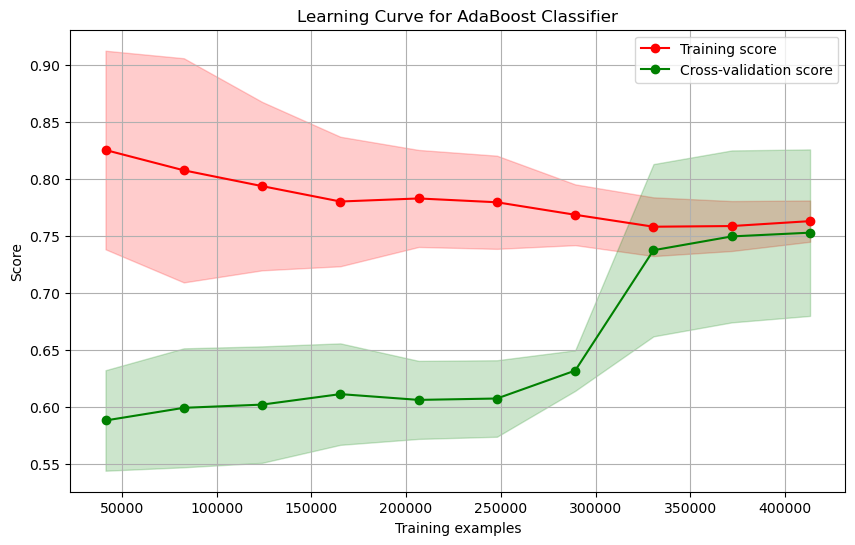

In [38]:
# Learning Curve of AdaBoost after tuning

import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Define the AdaBoost model with the specified best parameters
base_estimator = DecisionTreeClassifier(max_depth=3)
adaboost = AdaBoostClassifier(estimator=base_estimator, 
                              n_estimators=150, 
                              learning_rate=1.0, 
                              random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    adaboost, X_train_resampled, y_train_resampled, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), verbose=1
)

# Calculate mean and standard deviation for train and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')

# Plot the std deviation as shaded areas
plt.fill_between(train_sizes, 
                 train_scores_mean - train_scores_std, 
                 train_scores_mean + train_scores_std, 
                 alpha=0.2, color='r')
plt.fill_between(train_sizes, 
                 test_scores_mean - test_scores_std, 
                 test_scores_mean + test_scores_std, 
                 alpha=0.2, color='g')

plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve for AdaBoost Classifier')
plt.legend(loc='best')
plt.grid(True)
plt.show()


Logistic Regression

In [11]:
# Logistic Regression Base Model

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

scaler = StandardScaler()
X_train_resampled = scaler.fit_transform(X_train_resampled)
X_test = scaler.transform(X_test)

# Create a Logistic Regression classifier
logreg = LogisticRegression(random_state=42)

# Fit the model
logreg.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = logreg.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.5267466666666667

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.50      0.61    110763
           1       0.30      0.59      0.39     39237

    accuracy                           0.53    150000
   macro avg       0.54      0.55      0.50    150000
weighted avg       0.65      0.53      0.55    150000



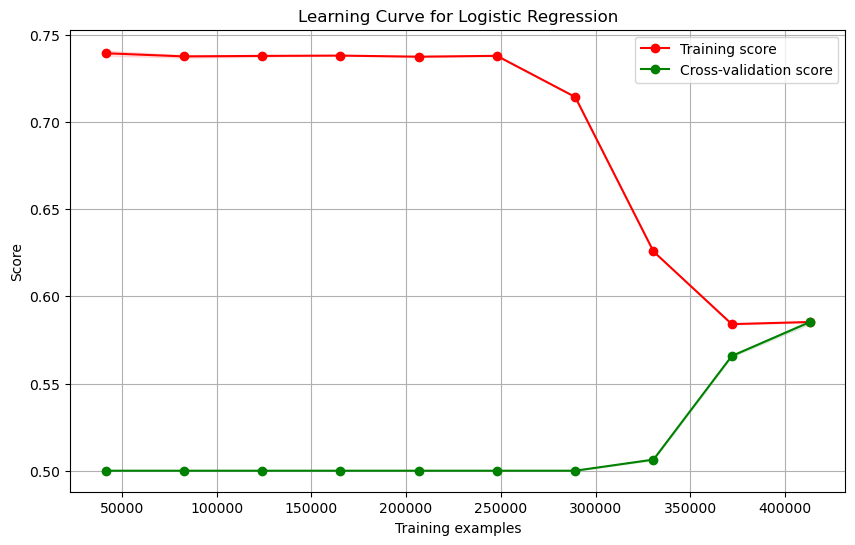

In [43]:
# Learning Curve of Logistic Regression Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import learning_curve, StratifiedKFold

# Standardize the data
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Create a Logistic Regression classifier
logreg = LogisticRegression(random_state=42)

# Define stratified cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(logreg, X_train_resampled_scaled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=cv, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Logistic Regression")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [7]:
# Grid Search for Logistic Regression

import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

param_grid = {
    'penalty': ['l2'],  # 'l2' is the default regularization
    'C': [0.001, 0.01, 0.1, 1.0, 10.0],  # Inverse of regularization strength
    'solver': ['newton-cg', 'lbfgs', 'liblinear'],  # Common solvers for Logistic Regression
    'class_weight': [None, 'balanced'],  # Handle imbalanced datasets
}

# Create Logistic Regression classifier
logreg = LogisticRegression(random_state=42, max_iter=1000)  

# Create GridSearchCV
grid_search = GridSearchCV(estimator=logreg, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Predict on the test data using the best estimator
y_pred = best_estimator.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)

# Print best parameters
print("\nBest Parameters:", best_params)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Accuracy: 0.53156

Best Parameters: {'C': 0.001, 'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'liblinear'}

Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.51      0.62    110763
           1       0.30      0.59      0.40     39237

    accuracy                           0.53    150000
   macro avg       0.54      0.55      0.51    150000
weighted avg       0.65      0.53      0.56    150000



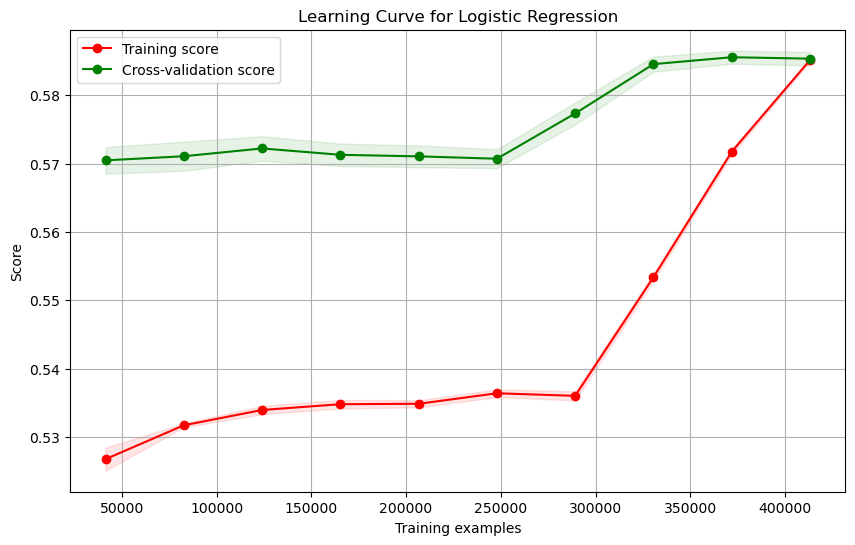

In [44]:
# Learning Curve of Logistic Regression after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import learning_curve, StratifiedKFold

# Define best parameters
best_params = {
    'C': 0.001,
    'class_weight': 'balanced',
    'penalty': 'l2',
    'solver': 'liblinear'
}

# Standardize the data
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Create a Logistic Regression classifier with the best parameters
logreg = LogisticRegression(**best_params, random_state=42)

# Define stratified cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(logreg, X_train_resampled_scaled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=cv, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Logistic Regression")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [42]:
# Randomized search to handle the underfitting

from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report

# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'C': [0.001, 0.01, 0.1, 1],               # Inverse of regularization strength
    'penalty': ['l1', 'l2'],                # Type of regularization
    'solver': ['liblinear', 'saga'],        # Optimization algorithm
    'class_weight': ['balanced', None]      # Weights for class imbalance
}

# Create a Logistic Regression classifier
logreg = LogisticRegression(random_state=42)

# Create the RandomizedSearchCV instance
random_search = RandomizedSearchCV(
    estimator=logreg,
    param_distributions=param_dist,
    n_iter=50,            
    cv=5,               
    verbose=3,         
    random_state=42,     
    n_jobs=-1              
)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Fit the RandomizedSearchCV instance to the scaled training data
random_search.fit(X_train_scaled, y_train_resampled)

# Display the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Evaluate the best model on the test set
best_model = random_search.best_estimator_
X_test_scaled = scaler.transform(X_test)  
y_pred = best_model.predict(X_test_scaled)

# Calculate accuracy and generate classification report
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Accuracy on Test Set:", accuracy)
print("Classification Report:\n", report)


c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 32 is smaller than n_iter=50. Running 32 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 32 candidates, totalling 160 fits
Best Parameters: {'solver': 'liblinear', 'penalty': 'l2', 'class_weight': None, 'C': 1}
Best Score: 0.5835015335589688
Accuracy on Test Set: 0.5267466666666667
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.50      0.61    110763
           1       0.30      0.59      0.39     39237

    accuracy                           0.53    150000
   macro avg       0.54      0.55      0.50    150000
weighted avg       0.65      0.53      0.55    150000



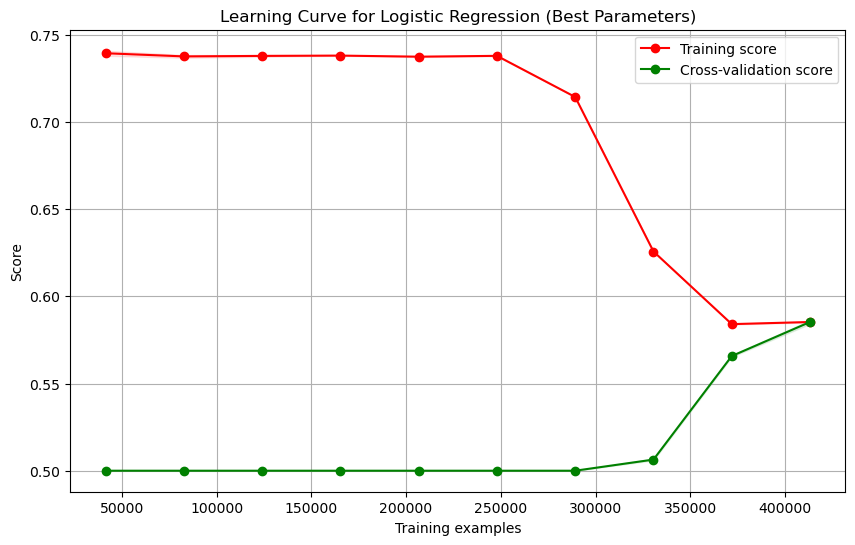

In [43]:
# Learning curve after randomized search

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import learning_curve, StratifiedKFold

# Define the best parameters
best_params = {
    'C': 1,
    'penalty': 'l2',
    'solver': 'liblinear',
    'class_weight': None
}

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Create a Logistic Regression classifier with the best parameters
logreg = LogisticRegression(**best_params, random_state=42)

# Define stratified cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = \
    learning_curve(logreg, X_train_scaled, y_train_resampled, 
                   train_sizes=np.linspace(0.1, 1.0, 10), 
                   cv=cv, n_jobs=-1, random_state=42)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Logistic Regression (Best Parameters)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


## Crime Category Prediction

Partition

In [41]:
X = df[['Location Description', 'Arrest', 'Domestic', 'Beat','District','Ward','Community Area','Day','Month','Day_of_Week','Hour','Time_of_Day']]
y = df['Category']

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape (X_train, y_train):", X_train.shape, y_train.shape)
print("Testing set shape (X_test, y_test):", X_test.shape, y_test.shape)

Training set shape (X_train, y_train): (350000, 12) (350000,)
Testing set shape (X_test, y_test): (150000, 12) (150000,)


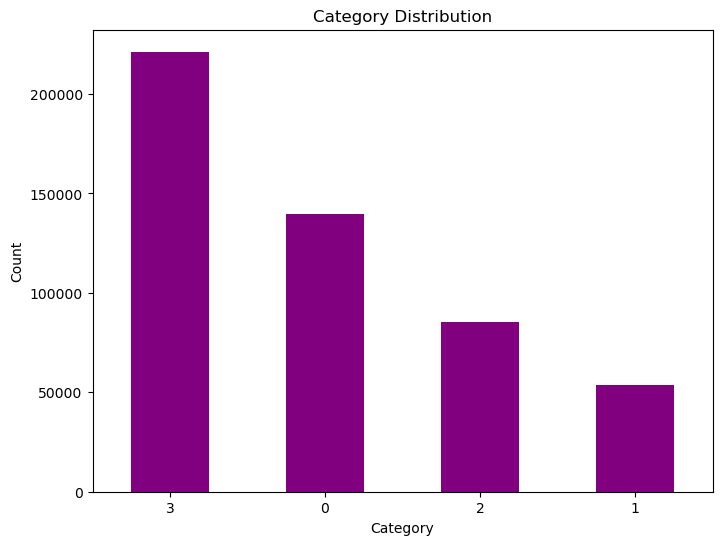

In [6]:
# Count occurrences of each class in 'Category'
category_counts = df['Category'].value_counts()

# Plotting the bar chart
plt.figure(figsize=(8, 6))
category_counts.plot(kind='bar', color='purple')
plt.title('Category Distribution')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=0)

plt.show()

In [42]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE oversampling on training data only to avoid any data leakage from the test set. This is a common practice to ensure that the model evaluation is fair

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

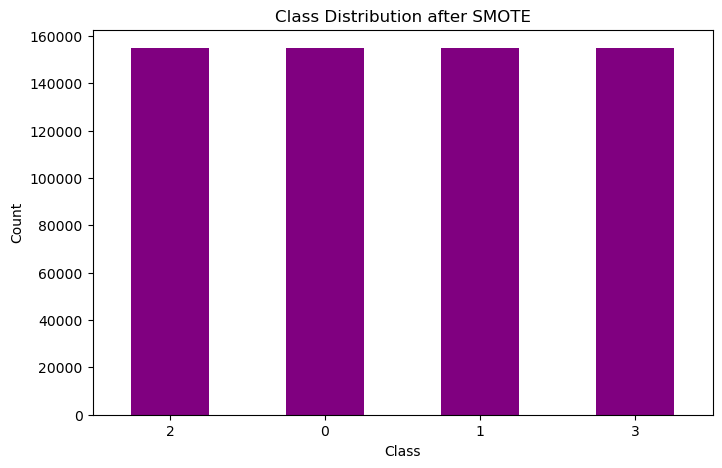

Class Distribution:
Category
2    154920
0    154920
1    154920
3    154920
Name: count, dtype: int64


In [21]:
# Count the occurrences of each class after SMOTE
class_counts = pd.Series(y_train_resampled).value_counts()

# Plot the class distribution
plt.figure(figsize=(8, 5))
class_counts.plot(kind='bar', rot=0, color='purple')
plt.title('Class Distribution after SMOTE')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

# Print the class counts
print("Class Distribution:")
print(class_counts)

Random Forest

In [17]:
# Random Forest Base Model

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

rf_classifier_2 = RandomForestClassifier(random_state=42)

# Train the model on the training data
rf_classifier_2.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test data
y_pred = rf_classifier_2.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.6044666666666667

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.59      0.62     42006
           1       0.60      0.88      0.72     16109
           2       0.28      0.24      0.26     25560
           3       0.69      0.69      0.69     66325

    accuracy                           0.60    150000
   macro avg       0.55      0.60      0.57    150000
weighted avg       0.60      0.60      0.60    150000



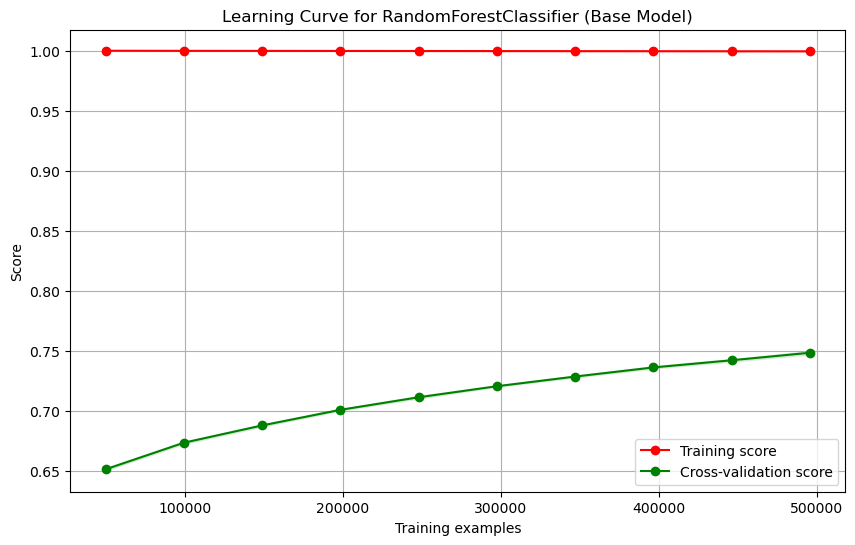

In [18]:
# Learning Curve of Random Forest Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer, accuracy_score

# Initialize a base RandomForestClassifier with default parameters
rf_base = RandomForestClassifier(random_state=42)

# Define a range of training sizes
train_sizes = np.linspace(0.1, 1.0, 10)

# Compute the learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_base, 
    X_train_resampled, 
    y_train_resampled, 
    train_sizes=train_sizes, 
    cv=5, 
    n_jobs=1,  
    scoring=make_scorer(accuracy_score)
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, 
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, 
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for RandomForestClassifier (Base Model)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


In [8]:
# Grid Search for Rnadom Forest

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV


param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create RandomForestClassifier
rf_tuning_2 = RandomForestClassifier(random_state=42)

# Create GridSearchCV
grid_search = GridSearchCV(estimator=rf_tuning_2, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Make predictions on the test data
y_pred = best_rf_model.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)

# Print best parameters
print("\nBest Parameters:", grid_search.best_params_)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.60774

Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}

Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.59      0.62     42006
           1       0.60      0.89      0.72     16109
           2       0.29      0.24      0.26     25560
           3       0.69      0.69      0.69     66325

    accuracy                           0.61    150000
   macro avg       0.56      0.60      0.57    150000
weighted avg       0.60      0.61      0.60    150000



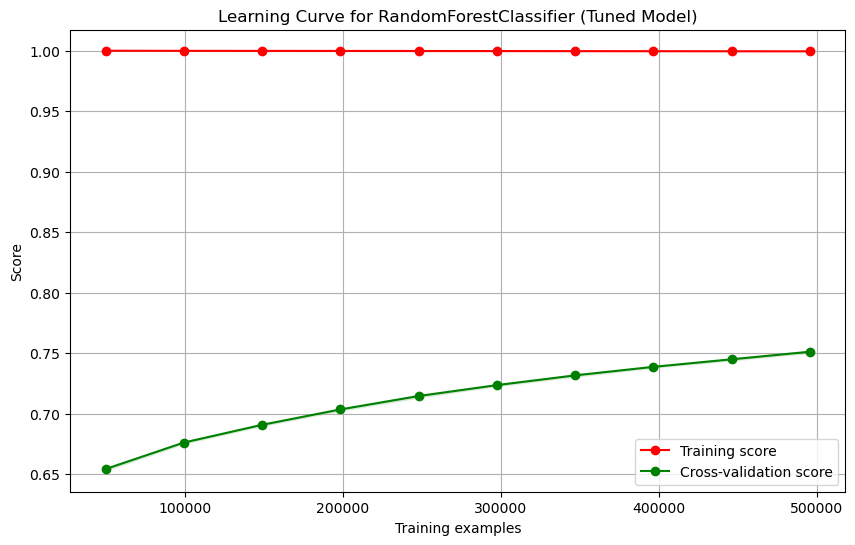

In [19]:
# Learning Curve after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer, accuracy_score

# Initialize RandomForestClassifier with the best parameters
rf_best = RandomForestClassifier(
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=300,
    random_state=42
)

# Define a range of training sizes
train_sizes = np.linspace(0.1, 1.0, 10)

# Compute the learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_best, 
    X_train_resampled, 
    y_train_resampled, 
    train_sizes=train_sizes, 
    cv=5, 
    n_jobs=1,
    scoring=make_scorer(accuracy_score)
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, 
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, 
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for RandomForestClassifier (Tuned Model)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


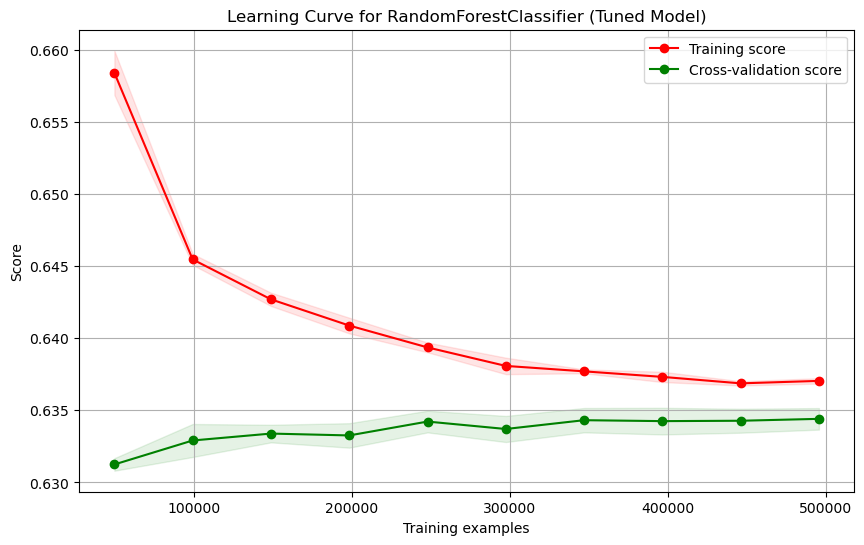

In [20]:
# Adjust parameter to avoid overfitting

import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer, accuracy_score


rf_adjusted = RandomForestClassifier(
    max_depth=10,                       # Limit the depth of the trees
    min_samples_leaf=5,                 # Require at least 5 samples in each leaf node
    min_samples_split=10,               # Require at least 10 samples to split an internal node
    n_estimators=300,                   # Number of trees
    random_state=42
)

# Define a range of training sizes
train_sizes = np.linspace(0.1, 1.0, 10)

# Compute the learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_adjusted, 
    X_train_resampled, 
    y_train_resampled, 
    train_sizes=train_sizes, 
    cv=5, 
    n_jobs=-1,
    scoring=make_scorer(accuracy_score)
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, 
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, 
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for RandomForestClassifier (Tuned Model)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


In [8]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Define the RandomForestClassifier with the given parameters
random_forest = RandomForestClassifier(
    max_depth=10,
    min_samples_leaf=5,
    min_samples_split=10,
    n_estimators=300,
    random_state=42
)

# Train the model on the resampled training data
random_forest.fit(X_train_resampled, y_train_resampled)

# Predict on the test set
y_pred = random_forest.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)

Accuracy: 0.5529
Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.54      0.62     42006
           1       0.50      0.98      0.66     16109
           2       0.25      0.37      0.30     25560
           3       0.71      0.53      0.61     66325

    accuracy                           0.55    150000
   macro avg       0.55      0.60      0.55    150000
weighted avg       0.62      0.55      0.56    150000



In [7]:
# Randomized Search to avoid overfitting
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 5, 10],
    'bootstrap': [True, False]
}

# Initialize RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=50,  
    cv=5,  
    verbose=2,  
    random_state=42,
    n_jobs=-1 
)

# Fit RandomizedSearchCV
random_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Predict on the test set with the best model
best_rf = random_search.best_estimator_
y_pred = best_rf.predict(X_test)

# Evaluate the model
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Best Parameters: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 15, 'bootstrap': False}

Best Score: 0.7354885712802066

Accuracy: 0.5804333333333334

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.55      0.63     42006
           1       0.54      0.96      0.69     16109
           2       0.26      0.36      0.30     25560
           3       0.71      0.59      0.65     66325

    accuracy                           0.58    150000
   macro avg       0.56      0.62      0.57    150000
weighted avg       0.62      0.58      0.59    150000



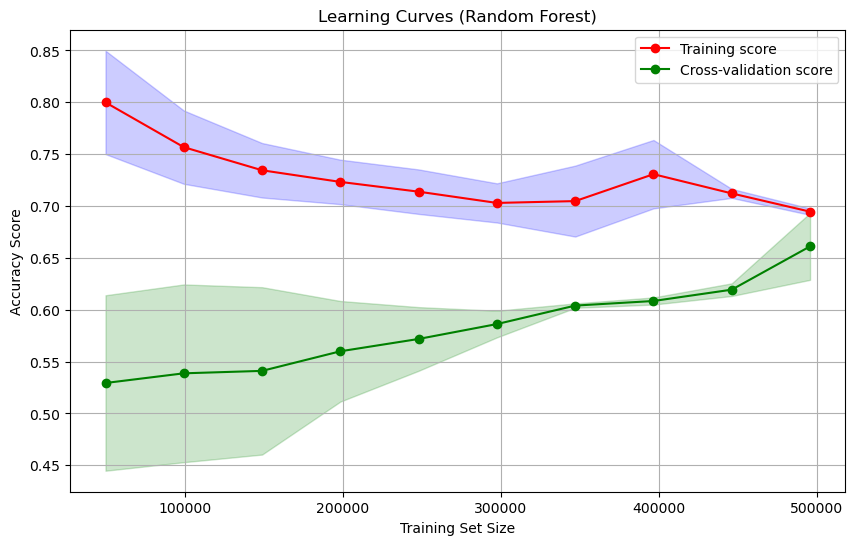

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer

# Define the Random Forest model with the specified parameters
random_forest = RandomForestClassifier(
    n_estimators=300,
    min_samples_split=2,
    min_samples_leaf=2,
    max_depth=15,
    bootstrap=False,
    random_state=42
)

# Define the scoring metric
scoring = make_scorer(accuracy_score)

# Compute learning curves
train_sizes, train_scores, test_scores = learning_curve(
    estimator=random_forest,
    X=X_train_resampled,
    y=y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5,
    scoring=scoring,
    n_jobs=-1
)

# Calculate the mean and standard deviation for training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curves
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='red', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='green', label='Cross-validation score')

# Plot the standard deviation as shaded regions
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='blue')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color='green')

plt.title('Learning Curves (Random Forest)')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy Score')
plt.legend(loc='best')
plt.grid(True)
plt.show()

Multilayer Perception (MLP)

In [18]:
# MLP Base Model

from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier

scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Create MLP classifier with default parameters
mlp_2 = MLPClassifier(random_state=42)

# Fit MLP classifier
mlp_2.fit(X_train_resampled_scaled, y_train_resampled)

# Predict on the test data
y_pred = mlp_2.predict(X_test_scaled)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.5581533333333333

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.55      0.61     42006
           1       0.52      0.96      0.68     16109
           2       0.25      0.33      0.28     25560
           3       0.69      0.56      0.62     66325

    accuracy                           0.56    150000
   macro avg       0.54      0.60      0.55    150000
weighted avg       0.60      0.56      0.56    150000



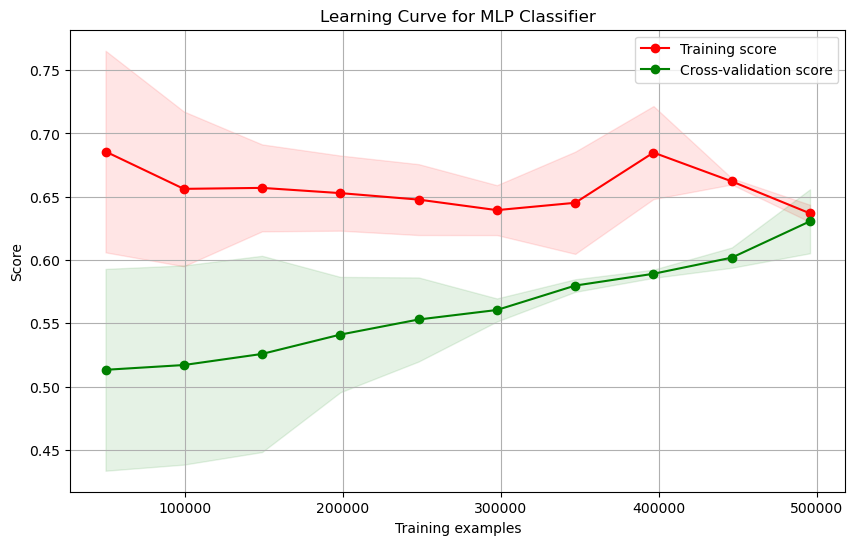

In [13]:
# Learning Curve for MLP Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier

# Data preparation
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Create MLP classifier with default parameters
mlp_2 = MLPClassifier(random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    mlp_2, X_train_resampled_scaled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for MLP Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [14]:
# Grid Search for MLP

import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report

# Standardize the features
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Define MLP classifier
mlp = MLPClassifier(random_state=42)

# Define parameter grid
parameter_space = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'learning_rate': ['constant', 'adaptive'],
}

# Create GridSearchCV
clf = GridSearchCV(mlp, parameter_space, n_jobs=-1, cv=5, verbose=2)

# Fit GridSearchCV on the scaled resampled training data
clf.fit(X_train_resampled_scaled, y_train_resampled)

# Get the best parameters and best estimator
best_params = clf.best_params_
best_estimator = clf.best_estimator_

# Predict on the test data using the best estimator
y_pred = best_estimator.predict(X_test_scaled)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)

# Print best parameters
print("\nBest Parameters:", best_params)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 72 candidates, totalling 360 fits


c:\Users\yibei\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Best Accuracy: 0.5814466666666667

Best Parameters: {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant'}

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.57      0.63     42006
           1       0.55      0.94      0.69     16109
           2       0.26      0.33      0.29     25560
           3       0.70      0.60      0.65     66325

    accuracy                           0.58    150000
   macro avg       0.55      0.61      0.57    150000
weighted avg       0.61      0.58      0.59    150000



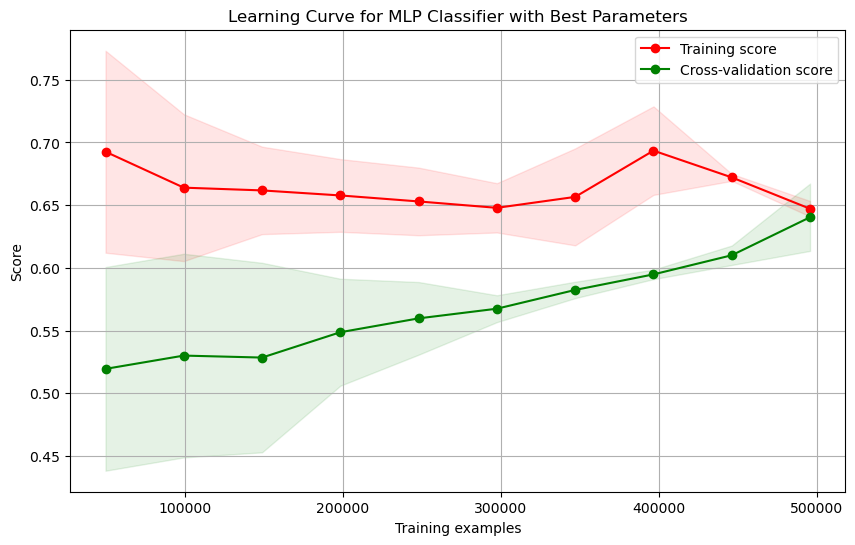

In [14]:
# Learning Curve of MLP after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier

# Define the best parameters
best_params = {
    'activation': 'relu',
    'alpha': 0.001,
    'hidden_layer_sizes': (50, 50),
    'learning_rate': 'constant',
    'random_state': 42
}

# Create MLPClassifier with the best parameters
mlp_best = MLPClassifier(**best_params)

# Scale the data
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    mlp_best, X_train_resampled_scaled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for MLP Classifier with Best Parameters")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()


KNN

In [19]:
# KNN Base Model

from sklearn.neighbors import KNeighborsClassifier

# Create KNN classifier
knn_2 = KNeighborsClassifier()

# Fit the model using the resampled training data
knn_2.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = knn_2.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.38443333333333335

Classification Report:
              precision    recall  f1-score   support

           0       0.39      0.43      0.41     42006
           1       0.29      0.52      0.37     16109
           2       0.21      0.31      0.25     25560
           3       0.63      0.35      0.45     66325

    accuracy                           0.38    150000
   macro avg       0.38      0.40      0.37    150000
weighted avg       0.45      0.38      0.40    150000



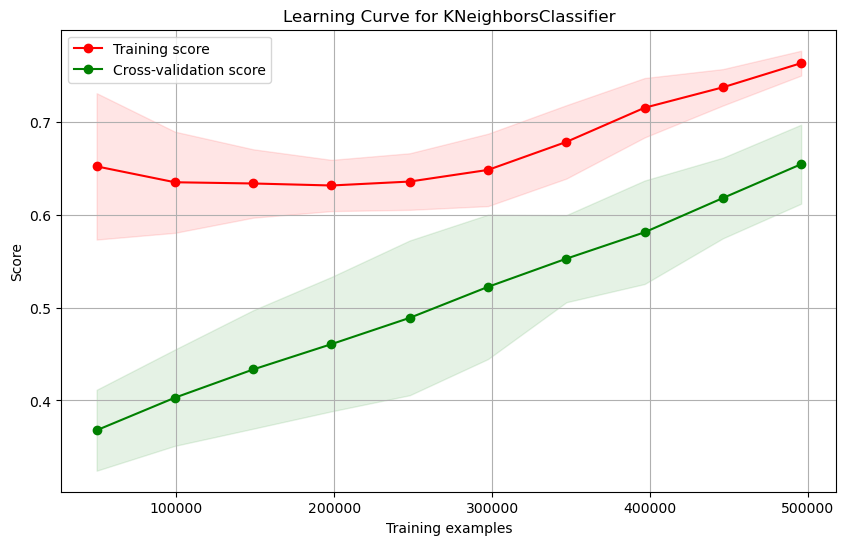

In [8]:
# Learning Curve for KNN Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier

# Create KNN classifier
knn_2 = KNeighborsClassifier()

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    knn_2, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for KNeighborsClassifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [23]:
# Grid Search for KNN 

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree'],
    'p': [1, 2]  # p=1 for Manhattan, p=2 for Euclidean
}

# Create KNN classifier
knn_tuning_2 = KNeighborsClassifier()

# Create GridSearchCV
grid_search = GridSearchCV(estimator=knn_tuning_2, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Predict on the test data using the best estimator
y_pred = best_estimator.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)

# Print best parameters
print("\nBest Parameters:", best_params)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Accuracy: 0.4401933333333333

Best Parameters: {'algorithm': 'ball_tree', 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

Classification Report:
              precision    recall  f1-score   support

           0       0.43      0.42      0.43     42006
           1       0.40      0.54      0.46     16109
           2       0.22      0.28      0.25     25560
           3       0.59      0.49      0.54     66325

    accuracy                           0.44    150000
   macro avg       0.41      0.43      0.42    150000
weighted avg       0.46      0.44      0.45    150000



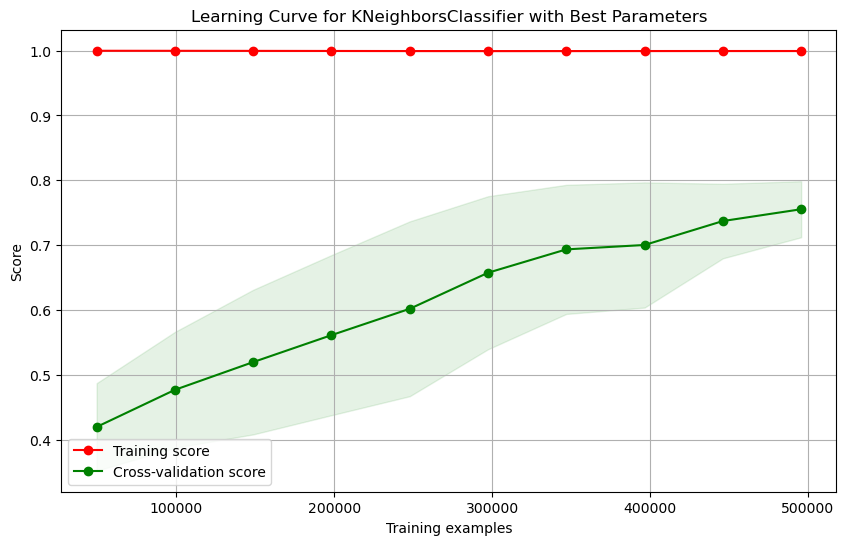

In [9]:
# Learning Curve for KNN after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier

# Define KNN classifier with best parameters
knn_best = KNeighborsClassifier(
    n_neighbors=3,
    weights='distance',
    algorithm='ball_tree',
    p=1
)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    knn_best, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for KNeighborsClassifier with Best Parameters")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [18]:
# Random Search for KNN to aviod overfitting

from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import randint

# Define the parameter grid for Random Search
param_dist = {
    'algorithm': ['auto'],
    'n_neighbors': randint(1, 20), 
    'weights': ['uniform'], 
    'p': [1, 2]  
}

# Create a KNN classifier
knn = KNeighborsClassifier()

# Setup the RandomizedSearchCV
random_search = RandomizedSearchCV(
    knn, 
    param_distributions=param_dist, 
    n_iter=10,  
    cv=5, 
    scoring='accuracy', 
    random_state=42,  
    verbose = 2,
    n_jobs=-1  
)

# Fit the random search model
random_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Predict on the test data using the best model
y_pred = random_search.best_estimator_.predict(X_test)

# Evaluate the best model
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Parameters: {'algorithm': 'auto', 'n_neighbors': 2, 'p': 2, 'weights': 'uniform'}
Best Score: 0.701876775109734

Accuracy: 0.36516

Classification Report:
              precision    recall  f1-score   support

           0       0.36      0.53      0.43     42006
           1       0.29      0.46      0.36     16109
           2       0.21      0.29      0.24     25560
           3       0.63      0.27      0.38     66325

    accuracy                           0.37    150000
   macro avg       0.37      0.39      0.35    150000
weighted avg       0.45      0.37      0.37    150000



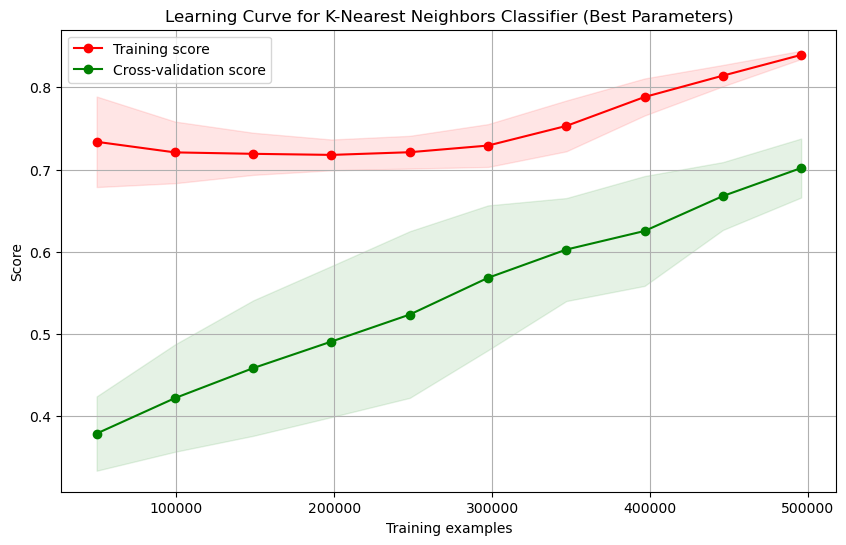

In [17]:
# Learning Curve of the best parameter (avoid overfitting)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier

# Define KNN classifier with best parameters
best_params = {'algorithm': 'auto', 'n_neighbors': 2, 'p': 2, 'weights': 'uniform'}
knn_clf = KNeighborsClassifier(**best_params)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    knn_clf, X_train_resampled, y_train_resampled, 
    train_sizes=np.linspace(0.1, 1.0, 10), 
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for K-Nearest Neighbors Classifier (Best Parameters)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

Naive Bayes

In [20]:
# Naive Bayes Base Model

from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB

# Create Naive Bayes classifier
nb_2 = GaussianNB()

# Fit Naive Bayes classifier
nb_2.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = nb_2.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.5936666666666667

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.42      0.56     42006
           1       0.46      0.99      0.63     16109
           2       0.23      0.10      0.14     25560
           3       0.63      0.80      0.71     66325

    accuracy                           0.59    150000
   macro avg       0.54      0.58      0.51    150000
weighted avg       0.60      0.59      0.56    150000



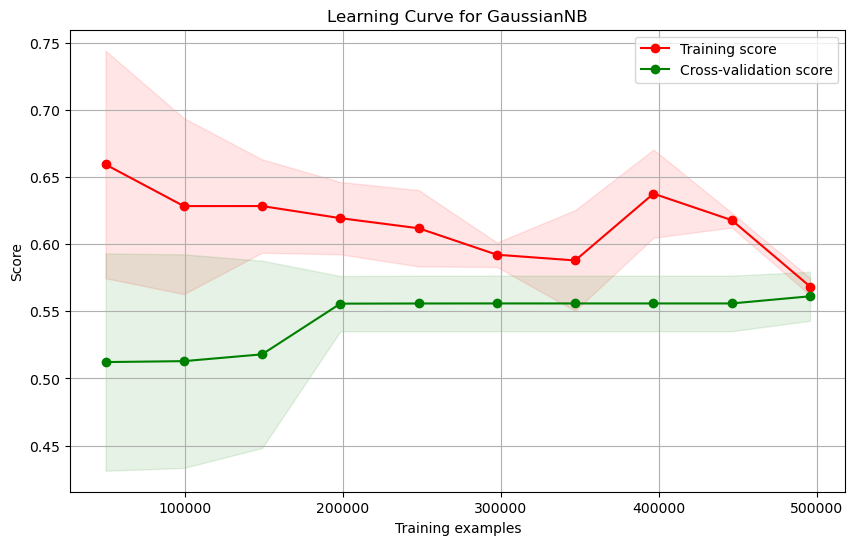

In [10]:
# Learning Curve of Naive Bayes

import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import learning_curve

# Initialize Naive Bayes classifier
nb_2 = GaussianNB()

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    nb_2, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for GaussianNB")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [11]:
# Grid Search for Naive Bayes

from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, accuracy_score

# Standardize features (assuming numerical features only)
scaler = StandardScaler()
X_train_resampled = scaler.fit_transform(X_train_resampled)
X_test = scaler.transform(X_test)

# Create Naive Bayes classifier
nb_tuning_2 = GaussianNB()

# Define the parameter grid for GridSearchCV
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5], 
    'priors': [None, [0.25, 0.25, 0.25, 0.25], [0.1, 0.2, 0.3, 0.4]]  # Prior probabilities of the classes
}

# Create GridSearchCV instance
grid_search = GridSearchCV(estimator=nb_tuning_2, param_grid=param_grid, cv=5, scoring='accuracy', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_resampled, y_train_resampled)

# Predict on the test data with the best model
best_nb = grid_search.best_estimator_
y_pred = best_nb.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)

# Print best parameters
print("\nBest Parameters:", grid_search.best_params_)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Best Accuracy: 0.5944333333333334

Best Parameters: {'priors': None, 'var_smoothing': 1e-05}

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.42      0.56     42006
           1       0.46      0.99      0.63     16109
           2       0.23      0.09      0.13     25560
           3       0.63      0.80      0.71     66325

    accuracy                           0.59    150000
   macro avg       0.54      0.58      0.51    150000
weighted avg       0.60      0.59      0.56    150000



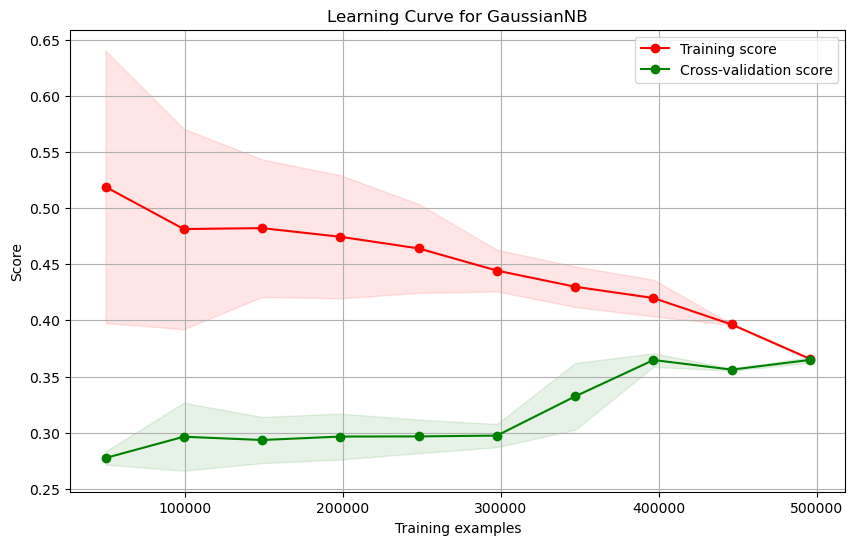

In [11]:
# Learning Curve of Naive Bayes after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import learning_curve

# Define the best parameters
best_params = {
    'priors': None,
    'var_smoothing': 1e-05
}

# Initialize GaussianNB with the best parameters
nb_2 = GaussianNB(priors=best_params['priors'], var_smoothing=best_params['var_smoothing'])

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    nb_2, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for GaussianNB")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

### Improvement

XG Boost

In [13]:
# XG Boost Base Model

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

# Define XGBoost model
model = XGBClassifier(random_state=42)

# Train the model on the resampled training data
model.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.6069666666666667

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.59      0.64     42006
           1       0.58      0.94      0.72     16109
           2       0.29      0.33      0.31     25560
           3       0.71      0.65      0.68     66325

    accuracy                           0.61    150000
   macro avg       0.57      0.62      0.59    150000
weighted avg       0.62      0.61      0.61    150000



c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
3 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\berni\anaconda3\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\berni\anaconda3\Lib\site-packages\xgboost\sklearn.py", line 1491, in fit
    raise ValueError(
ValueError: Invalid classes inferred from unique values of

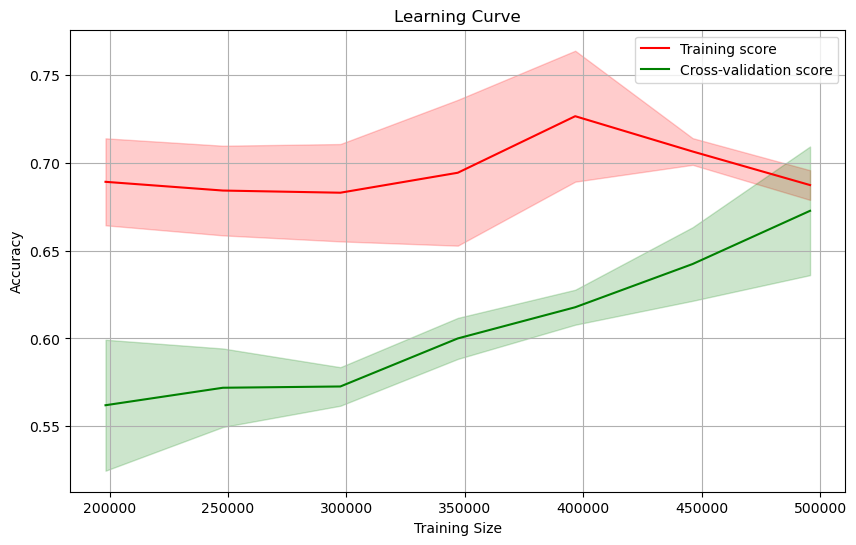

In [14]:
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
import numpy as np


# Define the model
model = XGBClassifier(random_state=42)

cv = StratifiedKFold(n_splits=5)

# Compute learning curve
train_sizes, train_scores, valid_scores = learning_curve(
    model, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=cv, scoring='accuracy', n_jobs=-1
)

# Calculate mean and standard deviation of training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training score', color='red')
plt.plot(train_sizes, valid_scores_mean, label='Cross-validation score', color='green')

# Plot the standard deviation as a shaded area
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='red')
plt.fill_between(train_sizes, valid_scores_mean - valid_scores_std, valid_scores_mean + valid_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.grid(True)
plt.show()

c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
3 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\berni\anaconda3\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\berni\anaconda3\Lib\site-packages\xgboost\sklearn.py", line 1491, in fit
    raise ValueError(
ValueError: Invalid classes inferred from unique values of

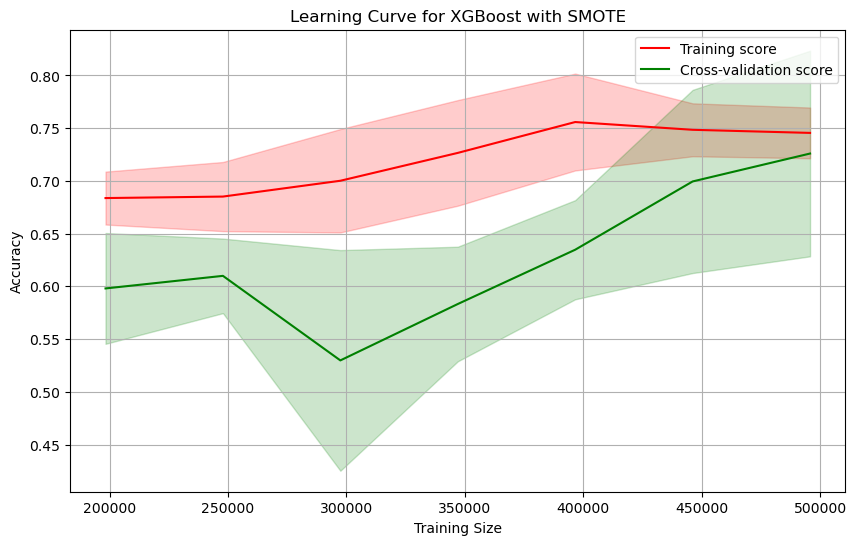

In [37]:
# Alternative way to plot the leanring curve but still having same issue

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, learning_curve, StratifiedKFold
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Define the features and target
X = df[['Location Description', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 'Community Area', 'Day', 'Month', 'Day_of_Week', 'Hour', 'Time_of_Day']]
y = df['Category']

# Encode the target variable
le = LabelEncoder()
y = le.fit_transform(y)

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Identify categorical features
categorical_features = ['Location Description', 'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 
                        'Community Area', 'Day', 'Month', 'Day_of_Week', 'Time_of_Day']

# Create preprocessing pipelines for categorical and numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ],
    remainder='passthrough'
)

# Apply preprocessing and SMOTE
X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# Apply SMOTE to the preprocessed training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_preprocessed, y_train)

# Initialize XGBoost model
model = XGBClassifier(random_state=42)

# Define StratifiedKFold for consistent class distribution
cv = StratifiedKFold(n_splits=5)

# Compute learning curve using resampled data
train_sizes, train_scores, valid_scores = learning_curve(
    model, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=cv, scoring='accuracy', n_jobs=-1
)

# Calculate mean and standard deviation of training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training score', color='red')
plt.plot(train_sizes, valid_scores_mean, label='Cross-validation score', color='green')

# Plot the standard deviation as a shaded area
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='red')
plt.fill_between(train_sizes, valid_scores_mean - valid_scores_std, valid_scores_mean + valid_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve for XGBoost with SMOTE')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [48]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score
from xgboost import XGBClassifier
import numpy as np

# Define parameter distributions for Randomized Search
param_distributions = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 7],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0]
}

# Define XGBoost model
model = XGBClassifier(random_state=42)

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of random combinations to try
    cv=5,  # Use stratified k-fold cross-validation
    scoring='accuracy',
    n_jobs=-1,  
    verbose=3,
    random_state=42
)

# Train the model using RandomizedSearchCV
random_search.fit(X_train_resampled, y_train_resampled)

# Get the best model from RandomizedSearchCV
best_model = random_search.best_estimator_

# Predict on the test data
y_pred = best_model.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(y_test, y_pred)
print("Best Parameters:", random_search.best_params_)
print("Accuracy:", accuracy)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Parameters: {'subsample': 0.9, 'n_estimators': 400, 'max_depth': 6, 'learning_rate': 0.2, 'colsample_bytree': 0.7}
Accuracy: 0.61852

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.59      0.64     42006
           1       0.60      0.92      0.73     16109
           2       0.30      0.30      0.30     25560
           3       0.71      0.68      0.70     66325

    accuracy                           0.62    150000
   macro avg       0.58      0.63      0.59    150000
weighted avg       0.62      0.62      0.62    150000



c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
3 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\berni\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\berni\anaconda3\Lib\site-packages\xgboost\core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "c:\Users\berni\anaconda3\Lib\site-packages\xgboost\sklearn.py", line 1491, in fit
    raise ValueError(
ValueError: Invalid classes inferred from unique values of

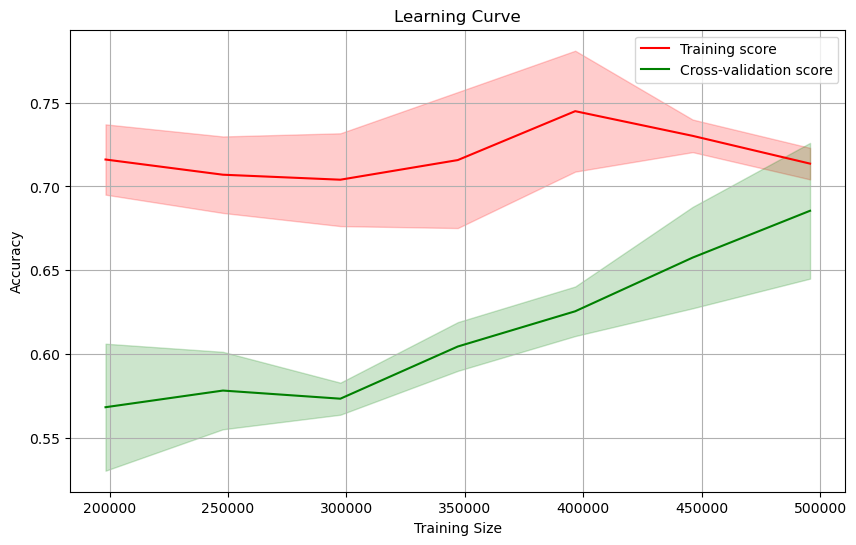

In [49]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve, StratifiedKFold
import numpy as np
from xgboost import XGBClassifier

# Define XGBoost model with best parameters
model = XGBClassifier(
    subsample=0.9,
    n_estimators=400,
    max_depth=6,
    learning_rate=0.2,
    colsample_bytree=0.7,
    random_state=42
)

# Create StratifiedKFold object
cv = StratifiedKFold(n_splits=5)

# Compute learning curve
train_sizes, train_scores, valid_scores = learning_curve(
    model, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=cv, scoring='accuracy', n_jobs=-1
)

# Calculate mean and standard deviation of training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training score', color='red')
plt.plot(train_sizes, valid_scores_mean, label='Cross-validation score', color='green')

# Plot the standard deviation as a shaded area
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='red')
plt.fill_between(train_sizes, valid_scores_mean - valid_scores_std, valid_scores_mean + valid_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.grid(True)
plt.show()

LightGBM

In [14]:
# LightGBM Base Model

from lightgbm import LGBMClassifier

# Define LightGBM model
model = LGBMClassifier(random_state=42)

# Train the model on the resampled training data
model.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 970
[LightGBM] [Info] Number of data points in the train set: 619680, number of used features: 12
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
Accuracy: 0.6011733333333333

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.57      0.64     42006
           1       0.56      0.95      0.71     16109
           2       0.28      0.32      0.30     25560
           3       0.71      0.64      0.67     66325

    accuracy                           0.60    150000
   macro avg       0.57      0.62      0.58    150000
weighted avg       0.62      0.60      0.60    150000



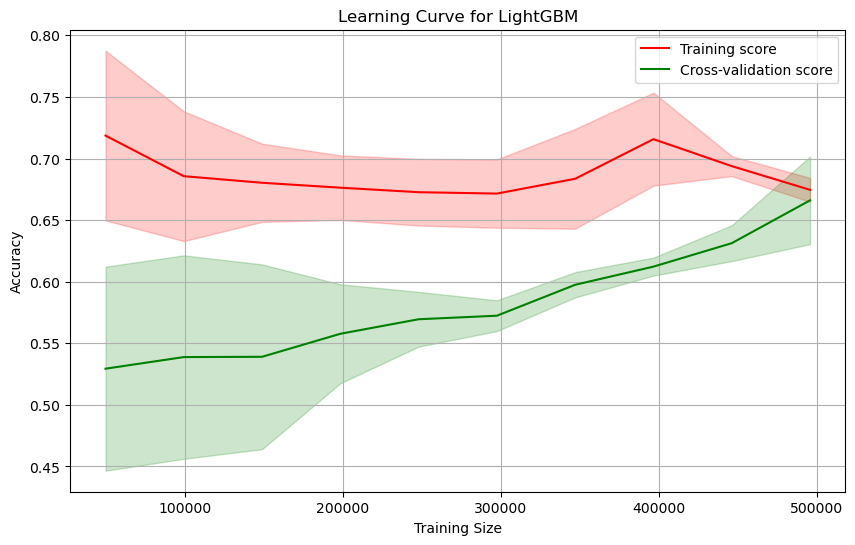

In [52]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve, StratifiedKFold
import numpy as np
from lightgbm import LGBMClassifier

# Define LightGBM model
model = LGBMClassifier(random_state=42)

# Compute learning curve
train_sizes, train_scores, valid_scores = learning_curve(
    model, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, scoring='accuracy', n_jobs=-1
)

# Calculate mean and standard deviation of training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training score', color='red')
plt.plot(train_sizes, valid_scores_mean, label='Cross-validation score', color='green')

# Plot the standard deviation as a shaded area
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='red')
plt.fill_between(train_sizes, valid_scores_mean - valid_scores_std, valid_scores_mean + valid_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve for LightGBM')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [54]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint

# Define the parameter grid
param_dist = {
    'num_leaves': randint(20, 150),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.3),
    'n_estimators': randint(50, 500),
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5),
    'min_child_samples': randint(5, 50)
}

# Create the LGBMClassifier model
model = LGBMClassifier(random_state=42)

# Set up the RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_dist,
    n_iter=50,  
    cv=5,       
    verbose=1,
    n_jobs=-1,  
    random_state=42
)

# Fit the random search model
random_search.fit(X_train_resampled, y_train_resampled)

# Best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Predict on the test data using the best model
y_pred = random_search.best_estimator_.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 998
[LightGBM] [Info] Number of data points in the train set: 619680, number of used features: 12
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Best Parameters: {'colsample_bytree': 0.6861413832808716, 'learn

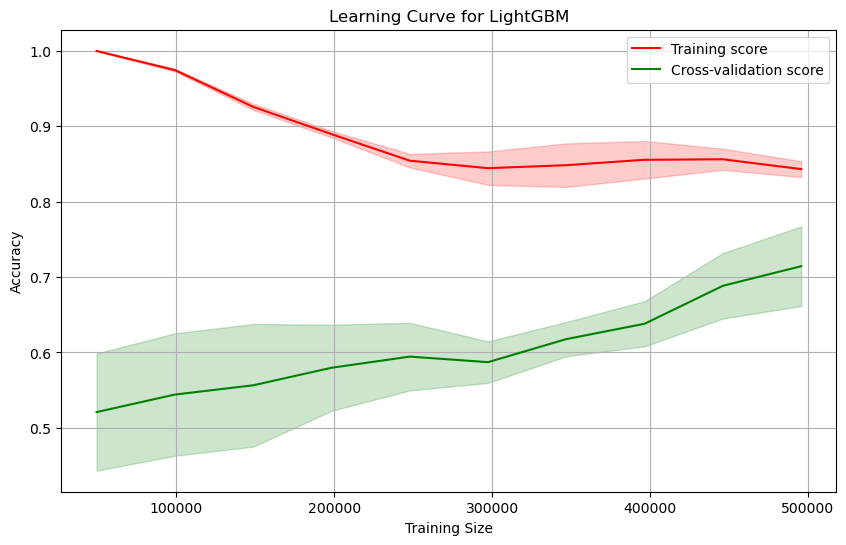

In [55]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve, StratifiedKFold
import numpy as np
from lightgbm import LGBMClassifier

# LightGBM model with the best parameters
model = LGBMClassifier(
    colsample_bytree=0.6861413832808716,
    learning_rate=0.29204003273733353,
    max_depth=11,
    min_child_samples=33,
    n_estimators=451,
    num_leaves=147,
    subsample=0.6526819301721967,
    random_state=42
)


# Learning curve
train_sizes, train_scores, valid_scores = learning_curve(
    model, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, scoring='accuracy', n_jobs=-1
)

# Calculate mean and standard deviation of training and validation scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training score', color='red')
plt.plot(train_sizes, valid_scores_mean, label='Cross-validation score', color='green')

# Plot the standard deviation as a shaded area
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='red')
plt.fill_between(train_sizes, valid_scores_mean - valid_scores_std, valid_scores_mean + valid_scores_std, alpha=0.2, color='green')

plt.xlabel('Training Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve for LightGBM')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [46]:
# Randomized Search to fix overfitting

from lightgbm import LGBMClassifier
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

# Define the model
model = LGBMClassifier(random_state=42)

# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'colsample_bytree': np.linspace(0.5, 1.0, 10),
    'learning_rate': np.logspace(-3, 0, 10),
    'max_depth': range(3, 15),
    'min_child_samples': range(10, 100, 10),
    'n_estimators': [100, 200, 300, 400, 500],
    'num_leaves': [31, 50, 100, 150],
    'subsample': np.linspace(0.5, 1.0, 10)
}

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(
    model,
    param_distributions=param_dist,
    n_iter=50,  
    cv=5,  
    scoring='accuracy', 
    n_jobs=-1,  
    verbose=3,
    random_state=42
)

# Fit RandomizedSearchCV
random_search.fit(X_train_resampled, y_train_resampled)

# Best parameters found
print("Best Parameters:", random_search.best_params_)

# Best score achieved
print("Best Score:", random_search.best_score_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017480 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 998
[LightGBM] [Info] Number of data points in the train set: 619680, number of used features: 12
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011151 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 998
[LightGBM] [Info] Number of data points in the train set: 619680, number of used features: 12
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

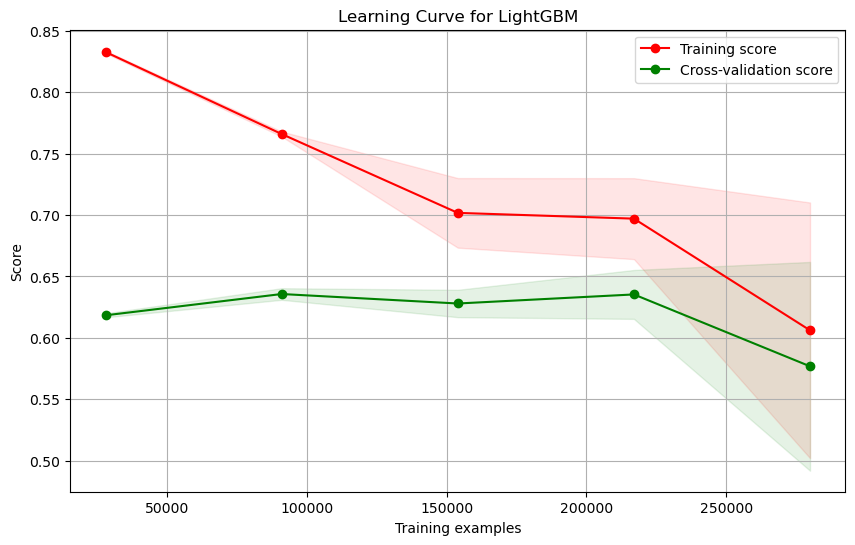

In [52]:
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import learning_curve
from lightgbm import LGBMClassifier
import numpy as np

# Define the model with the best parameters
best_params = {
    'subsample': 0.6666666666666666,
    'num_leaves': 100,
    'n_estimators': 400,
    'min_child_samples': 40,
    'max_depth': 7,
    'learning_rate': 0.46415888336127775,
    'colsample_bytree': 0.8888888888888888
}
model = LGBMClassifier(**best_params, random_state=42)

# Fit the model
model.fit(X_train_resampled, y_train_resampled)

# Predict on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Test Accuracy:", accuracy)

# Generate classification report
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

# Plot learning curve
train_sizes, train_scores, test_scores = learning_curve(
    model, X_train_preprocessed, y_train, cv=5, n_jobs=-1, scoring='accuracy'
)

# Calculate mean and std for training and test scores
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='red', marker='o', label='Training score')
plt.plot(train_sizes, test_mean, color='green', marker='o', label='Cross-validation score')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.1, color='red')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.1, color='green')
plt.title('Learning Curve for LightGBM')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.legend(loc='best')
plt.grid()
plt.show()

*Catboost

In [15]:
# CatBoost Base Model

from catboost import CatBoostClassifier

# Define CatBoost model
model = CatBoostClassifier(random_state=42, verbose=0) 

# Train the model on the resampled training data
model.fit(X_train_resampled, y_train_resampled)

# Predict on the test data
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Display classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 0.61952

Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.58      0.64     42006
           1       0.58      0.93      0.72     16109
           2       0.30      0.29      0.29     25560
           3       0.71      0.70      0.70     66325

    accuracy                           0.62    150000
   macro avg       0.57      0.62      0.59    150000
weighted avg       0.62      0.62      0.62    150000



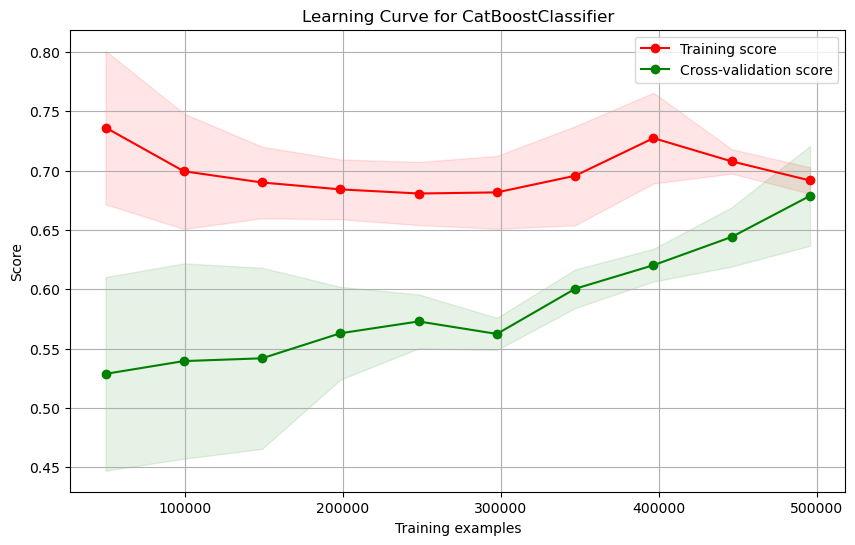

In [15]:
# Learning Curve for CatBoost Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from catboost import CatBoostClassifier
from sklearn.preprocessing import StandardScaler

# Define the CatBoost model
model = CatBoostClassifier(random_state=42, verbose=0)

# Scale the data
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    model, X_train_resampled_scaled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for CatBoostClassifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [16]:
# Random Search for CatBoost

from sklearn.preprocessing import StandardScaler
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report
import numpy as np

# Define the CatBoost classifier
catboost_model = CatBoostClassifier(random_state=42, verbose=0)

# Define a more focused parameter grid for RandomizedSearchCV
param_dist = {
    'iterations': np.arange(800, 1201, 100),  # Focusing around the default 1000
    'depth': np.arange(4, 11, 2),  # Adjusting depth range
    'learning_rate': np.linspace(0.02, 0.05, 4),  # Narrowing around the default 0.03
    'l2_leaf_reg': np.arange(1, 6, 1)  # Narrowing around the default 3
}

# Create StratifiedKFold instance for cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create RandomizedSearchCV instance
random_search = RandomizedSearchCV(estimator=catboost_model, param_distributions=param_dist, n_iter=50, cv=cv, 
                                   scoring='accuracy', verbose=1, n_jobs=-1, random_state=42)

# Fit RandomizedSearchCV
random_search.fit(X_train_resampled, y_train_resampled)

# Predict on the test data with the best model
best_catboost = random_search.best_estimator_
y_pred = best_catboost.predict(X_test)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Best Accuracy:", accuracy)

# Print best parameters
print("\nBest Parameters:", random_search.best_params_)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Additional diagnostics: Cross-validation results
cv_results = pd.DataFrame(random_search.cv_results_)
print(cv_results[['mean_test_score', 'std_test_score', 'params']])


Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best Accuracy: 0.6173733333333333

Best Parameters: {'learning_rate': 0.05, 'l2_leaf_reg': 3, 'iterations': 1200, 'depth': 10}

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.58      0.64     42006
           1       0.59      0.93      0.72     16109
           2       0.30      0.29      0.29     25560
           3       0.71      0.69      0.70     66325

    accuracy                           0.62    150000
   macro avg       0.57      0.62      0.59    150000
weighted avg       0.62      0.62      0.61    150000

    mean_test_score  std_test_score  \
0          0.667319        0.001671   
1          0.667825        0.001396   
2          0.653437        0.001645   
3          0.672983        0.001780   
4          0.658180        0.001370   
5          0.651596        0.001554   
6          0.675620        0.001682   
7          0.663065        0.001567   
8

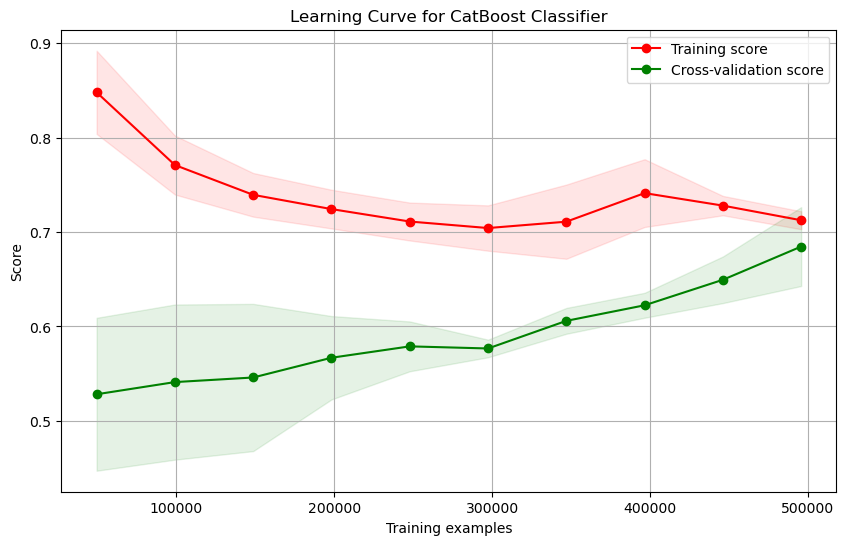

In [8]:
# Learning Curve of CatBoost after tuning

import numpy as np
import matplotlib.pyplot as plt
from catboost import CatBoostClassifier
from sklearn.model_selection import learning_curve

# Define CatBoost model with the best parameters
model = CatBoostClassifier(
    learning_rate=0.05,
    l2_leaf_reg=3,
    iterations=1200,
    depth=10,
    random_state=42,
    verbose=0
)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    model, X_train_resampled, y_train_resampled,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")
plt.title("Learning Curve for CatBoost Classifier")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

## Spatial prediction

Partition

In [46]:
X = df[['Location Description', 'Domestic', 'Arrest','Beat','District','Ward','Community Area','Day','Month','Day_of_Week','Time_of_Day','Category','Hour']]
y = df[['Latitude', 'Longitude']]

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape (X_train, y_train):", X_train.shape, y_train.shape)
print("Testing set shape (X_test, y_test):", X_test.shape, y_test.shape)

Training set shape (X_train, y_train): (350000, 13) (350000, 2)
Testing set shape (X_test, y_test): (150000, 13) (150000, 2)


*Random Forest Regressor

In [21]:
# Random Forest Regressor Base Model

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Train the model
rf_regressor.fit(X_train, y_train)

# Predict on the test set
y_pred_rf = rf_regressor.predict(X_test)

In [22]:
# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_rf)
mse = mean_squared_error(y_test, y_pred_rf)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_rf)

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred_rf):
    return np.mean(np.abs((y_true - y_pred_rf) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred_rf)

# Print the metrics
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared score: {r2}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

Mean Absolute Error (MAE): 0.0024784198516912834
Mean Squared Error (MSE): 1.2331017793016258e-05
Root Mean Squared Error (RMSE): 0.0035115548967681338
R-squared score: 0.9970968905182751
Mean Absolute Percentage Error (MAPE): 0.004125883117121697


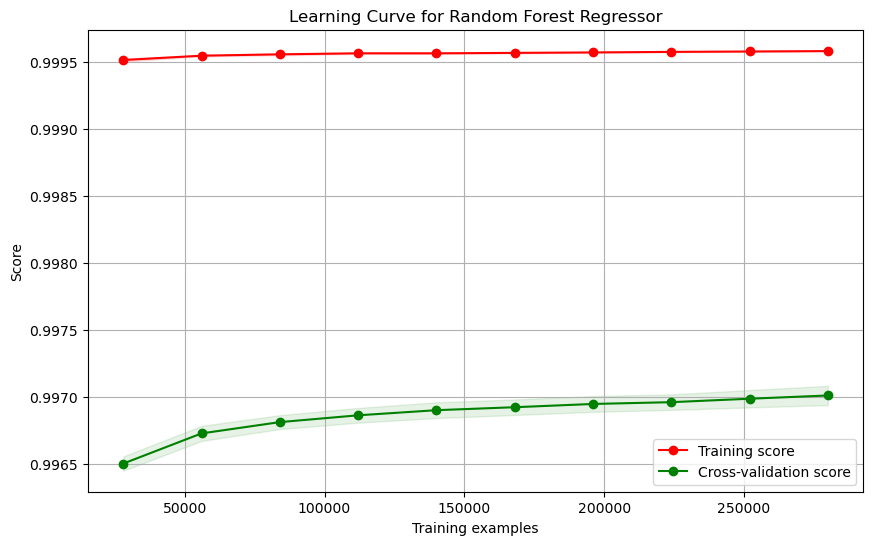

In [13]:
# Learning Curve of Random Forest Regressor

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest Regressor with default parameters
rf_regressor = RandomForestRegressor(random_state=42)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_regressor, X_train, y_train, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [23]:
# Grid Search for Random Forest Regressor

from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize the Random Forest Regressor
rf_regressor = RandomForestRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf_regressor, param_grid=param_grid
                           , cv=5, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Best parameters found
print("Best parameters found:", grid_search.best_params_)

# Predict on the test set with the best model
best_rf_model = grid_search.best_estimator_
y_pred_rf_grid = best_rf_model.predict(X_test)

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters found: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}


In [24]:
# Calculate evaluation metrics
mae_rf_grid = mean_absolute_error(y_test, y_pred_rf_grid)
mse_rf_grid = mean_squared_error(y_test, y_pred_rf_grid)
rmse_rf_grid = np.sqrt(mse_rf_grid)
r2_rf_grid = r2_score(y_test, y_pred_rf_grid)

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape_rf_grid = mean_absolute_percentage_error(y_test, y_pred_rf_grid)

# Print the metrics
print("Evaluation metrics for Random Forest Regressor with Grid Search:")
print(f"Mean Absolute Error (MAE): {mae_rf_grid}")
print(f"Mean Squared Error (MSE): {mse_rf_grid}")
print(f"Root Mean Squared Error (RMSE): {rmse_rf_grid}")
print(f"R-squared score: {r2_rf_grid}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_rf_grid}")

Evaluation metrics for Random Forest Regressor with Grid Search:
Mean Absolute Error (MAE): 0.0024484779500508766
Mean Squared Error (MSE): 1.1869131623882455e-05
Root Mean Squared Error (RMSE): 0.003445160609301467
R-squared score: 0.9972060317925651
Mean Absolute Percentage Error (MAPE): 0.004076871806868531


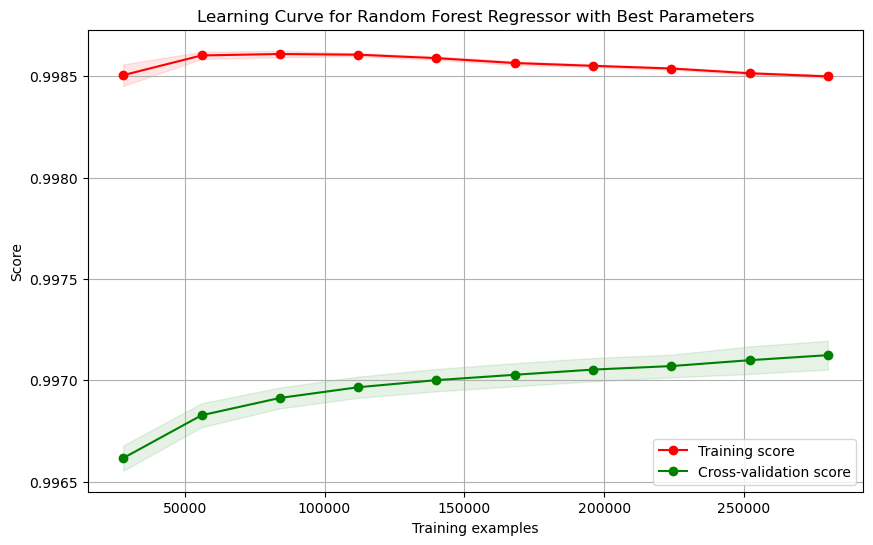

In [14]:
# Learning Curve of Random Forest Regressor after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor

# Define the Random Forest Regressor with best parameters
rf_regressor = RandomForestRegressor(
    n_estimators=200,
    max_depth=20,
    min_samples_split=10,
    min_samples_leaf=1,
    random_state=42
)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_regressor, X_train, y_train, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Regressor with Best Parameters")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [29]:
# Random Search to find better parameter within the range

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

# Define the parameter grid for Random Search
param_dist = {
    'n_estimators': randint(100, 500),    
    'max_depth': randint(10, 50),              
    'min_samples_split': randint(2, 20),  
    'min_samples_leaf': randint(1, 20)      
}

# Create a RandomForestRegressor
rf_regressor = RandomForestRegressor(random_state=42)

# Setup the RandomizedSearchCV
random_search = RandomizedSearchCV(
    rf_regressor, 
    param_distributions=param_dist, 
    n_iter=20,         
    cv=5,               
    scoring='neg_mean_squared_error',
    random_state=42,   
    verbose=2,         
    n_jobs=-1          
)

# Fit the random search model
random_search.fit(X_train, y_train)

# Print the best parameters and best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Predict on the test data using the best model
y_pred = random_search.best_estimator_.predict(X_test)

# Evaluate the best model
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)

# Print evaluation metrics
print("\nEvaluation metrics for Random Forest Regressor:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared score: {r2}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 13, 'n_estimators': 413}
Best Score: -1.2182631593335574e-05

Evaluation metrics for Random Forest Regressor:
Mean Absolute Error (MAE): 0.002449125485929255
Mean Squared Error (MSE): 1.188047706529871e-05
Root Mean Squared Error (RMSE): 0.0034468067925688423
R-squared score: 0.9972024920952522
Mean Absolute Percentage Error (MAPE): 0.004077742704775978


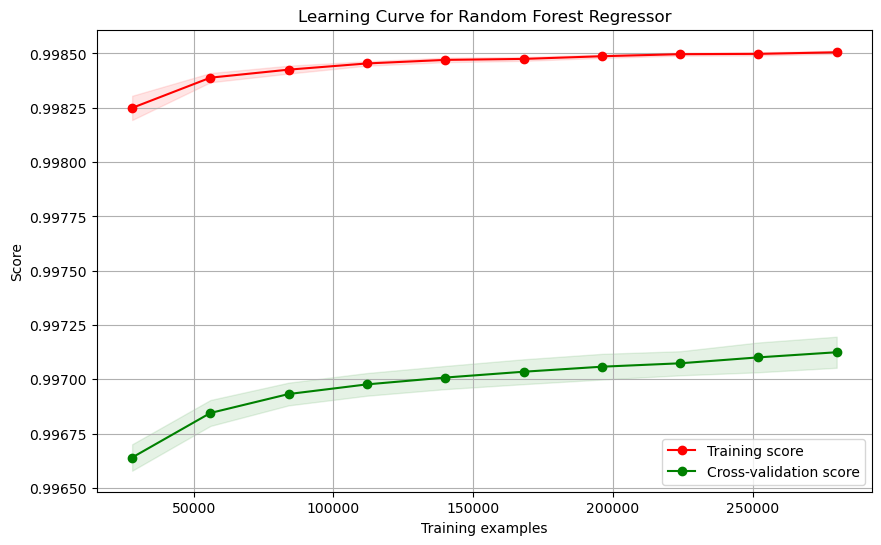

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

# Define the RandomForestRegressor with the best parameters
best_params = {
    'max_depth': 30,
    'min_samples_leaf': 1,
    'min_samples_split': 13,
    'n_estimators': 413
}
rf_regressor = RandomForestRegressor(**best_params, random_state=42)

# Compute the learning curve
train_sizes, train_scores, test_scores = learning_curve(
    rf_regressor, X_train, y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for Random Forest Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

Gradient Boost Regressor

In [25]:
# Gradient Boost Regressor Base Model

from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Initialize the Gradient Boosting Regressor
gb_regressor = GradientBoostingRegressor(random_state=42)

# Initialize the MultiOutputRegressor with Gradient Boosting
multioutput_gb_regressor = MultiOutputRegressor(gb_regressor)

# Train the model
multioutput_gb_regressor.fit(X_train, y_train)

# Predict on the test set
y_pred_multioutput_gb = multioutput_gb_regressor.predict(X_test)

In [26]:
# Calculate evaluation metrics
mae_multioutput_gb = mean_absolute_error(y_test, y_pred_multioutput_gb)
mse_multioutput_gb = mean_squared_error(y_test, y_pred_multioutput_gb)
rmse_multioutput_gb = np.sqrt(mse_multioutput_gb)
r2_multioutput_gb = r2_score(y_test, y_pred_multioutput_gb)

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape_multioutput_gb = mean_absolute_percentage_error(y_test, y_pred_multioutput_gb)

# Print the evaluation metrics
print("Evaluation metrics for MultiOutput Gradient Boosting Regressor:")
print(f"Mean Absolute Error (MAE): {mae_multioutput_gb}")
print(f"Mean Squared Error (MSE): {mse_multioutput_gb}")
print(f"Root Mean Squared Error (RMSE): {rmse_multioutput_gb}")
print(f"R-squared score: {r2_multioutput_gb}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_multioutput_gb}")

Evaluation metrics for MultiOutput Gradient Boosting Regressor:
Mean Absolute Error (MAE): 0.006352379480319064
Mean Squared Error (MSE): 7.281642019889168e-05
Root Mean Squared Error (RMSE): 0.00853325378732472
R-squared score: 0.9824137014175924
Mean Absolute Percentage Error (MAPE): 0.010421076622986749


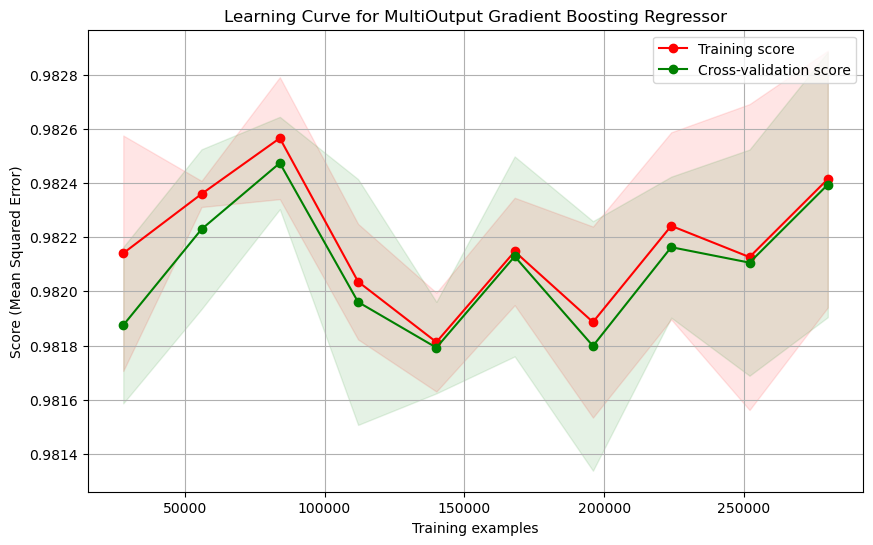

In [17]:
# Learning Curve for Gradient Boost Regressor Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import learning_curve

# Initialize the Gradient Boosting Regressor
gb_regressor = GradientBoostingRegressor(random_state=42)

# Initialize the MultiOutputRegressor with Gradient Boosting
multioutput_gb_regressor = MultiOutputRegressor(gb_regressor)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    multioutput_gb_regressor, X_train, y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for MultiOutput Gradient Boosting Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score (Mean Squared Error)")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [7]:
# Grid Search for Gradient Boost Regressor

from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define the parameter grid for GradientBoostingRegressor
param_grid = {
    'estimator__n_estimators': [100, 200, 300],
    'estimator__learning_rate': [0.1, 0.2],
    'estimator__max_depth': [3, 4, 5],
    'estimator__min_samples_split': [2, 5],
    'estimator__min_samples_leaf': [1, 2]
}

# Initialize the Gradient Boosting Regressor
gb_regressor = GradientBoostingRegressor(random_state=42)

# Initialize the MultiOutputRegressor with Gradient Boosting
multioutput_gb_regressor = MultiOutputRegressor(gb_regressor)

# Initialize GridSearchCV with the MultiOutputRegressor
grid_search = GridSearchCV(estimator=multioutput_gb_regressor, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=2)

# Train the model
grid_search.fit(X_train, y_train)

# Get the best parameters and best estimator
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_

# Predict on the test set using the best estimator
y_pred_multioutput_gb_best = best_estimator.predict(X_test)

# Print the best parameters
print(f"Best Parameters: {best_params}")


Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters: {'estimator__learning_rate': 0.2, 'estimator__max_depth': 5, 'estimator__min_samples_leaf': 1, 'estimator__min_samples_split': 5, 'estimator__n_estimators': 300}


In [6]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mae_gb_best = mean_absolute_error(y_test, y_pred_multioutput_gb_best)
mse_gb_best = mean_squared_error(y_test, y_pred_multioutput_gb_best)
rmse_gb_best = np.sqrt(mse_gb_best)
r2_gb_best = r2_score(y_test, y_pred_multioutput_gb_best)
mape_gb_best = mean_absolute_percentage_error(y_test, y_pred_multioutput_gb_best)

# Print the evaluation metrics
print("Evaluation metrics for MultiOutput Gradient Boosting Regressor (Best Estimator):")
print(f"Mean Absolute Error (MAE): {mae_gb_best}")
print(f"Mean Squared Error (MSE): {mse_gb_best}")
print(f"Root Mean Squared Error (RMSE): {rmse_gb_best}")
print(f"R-squared score: {r2_gb_best}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_gb_best}")

Evaluation metrics for MultiOutput Gradient Boosting Regressor (Best Estimator):
Mean Absolute Error (MAE): 0.0026502912712947496
Mean Squared Error (MSE): 1.2850746946625019e-05
Root Mean Squared Error (RMSE): 0.003584793849948002
R-squared score: 0.9969666180963578
Mean Absolute Percentage Error (MAPE): 0.004400557655990851


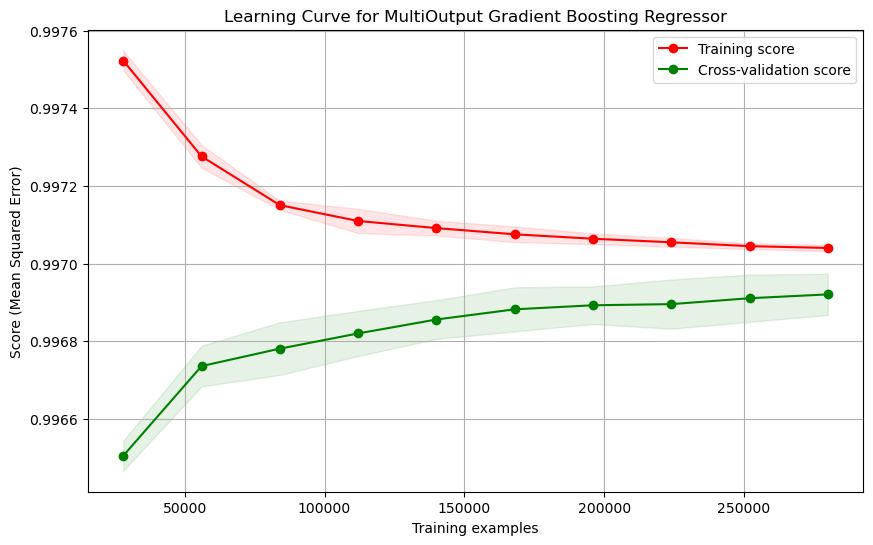

In [18]:
# Learning Curve of Gradient Boost after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import learning_curve

# Define Gradient Boosting Regressor with the best parameters
gb_regressor = GradientBoostingRegressor(
    learning_rate=0.2,
    max_depth=5,
    min_samples_leaf=1,
    min_samples_split=5,
    n_estimators=300,
    random_state=42
)

# Initialize the MultiOutputRegressor with the configured Gradient Boosting
multioutput_gb_regressor = MultiOutputRegressor(gb_regressor)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    multioutput_gb_regressor, X_train, y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for MultiOutput Gradient Boosting Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score (Mean Squared Error)")
plt.legend(loc="best")
plt.grid(True)
plt.show()

KNeighborsRegressor

In [7]:
# KNeighbors Regressor Base Model

from sklearn.multioutput import MultiOutputRegressor
from sklearn.neighbors import KNeighborsRegressor

# Initialize the K Nearest Neighbors Regressor
knn_regressor = KNeighborsRegressor()

# Initialize the MultiOutputRegressor with K Nearest Neighbors
multioutput_knn_regressor = MultiOutputRegressor(knn_regressor)

# Train the model
multioutput_knn_regressor.fit(X_train, y_train)

# Predict on the test set
y_pred_multioutput_knn = multioutput_knn_regressor.predict(X_test)

In [9]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAE, MSE, RMSE, R-squared
mae_multioutput_knn = mean_absolute_error(y_test, y_pred_multioutput_knn)
mse_multioutput_knn = mean_squared_error(y_test, y_pred_multioutput_knn)
rmse_multioutput_knn = np.sqrt(mse_multioutput_knn)
r2_multioutput_knn = r2_score(y_test, y_pred_multioutput_knn)

# Calculate MAPE
mape_multioutput_knn = mean_absolute_percentage_error(y_test, y_pred_multioutput_knn)

# Print the evaluation metrics
print("Evaluation metrics for MultiOutput K Neighbors Regressor:")
print(f"Mean Absolute Error (MAE): {mae_multioutput_knn}")
print(f"Mean Squared Error (MSE): {mse_multioutput_knn}")
print(f"Root Mean Squared Error (RMSE): {rmse_multioutput_knn}")
print(f"R-squared score: {r2_multioutput_knn}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_multioutput_knn}")

Evaluation metrics for MultiOutput K Neighbors Regressor:
Mean Absolute Error (MAE): 0.0049888775001266554
Mean Squared Error (MSE): 5.079026960454506e-05
Root Mean Squared Error (RMSE): 0.007126729236090358
R-squared score: 0.9876661237253881
Mean Absolute Percentage Error (MAPE): 0.00809904567874488


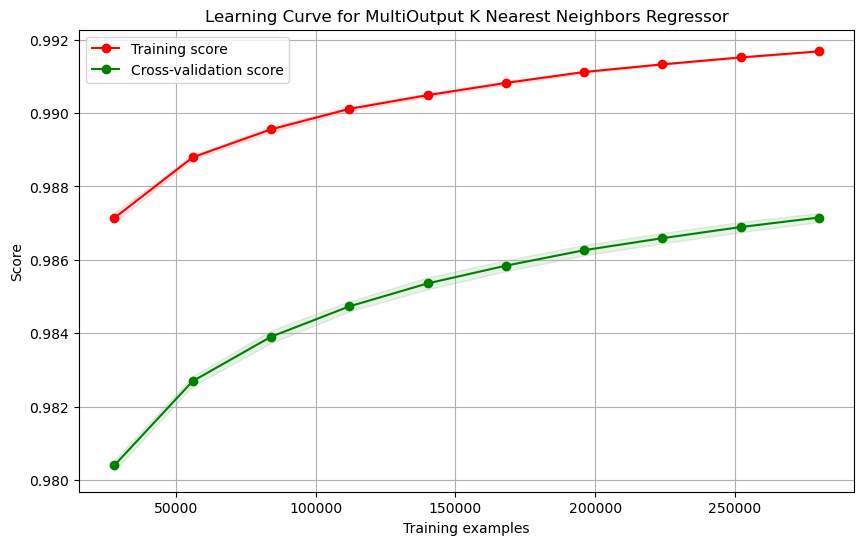

In [19]:
# Learning Curve of KNeigbors Regressor Base Model

import numpy as np
import matplotlib.pyplot as plt
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import learning_curve

# Initialize the K Nearest Neighbors Regressor
knn_regressor = KNeighborsRegressor()

# Initialize the MultiOutputRegressor with K Nearest Neighbors
multioutput_knn_regressor = MultiOutputRegressor(knn_regressor)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    multioutput_knn_regressor, X_train, y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for MultiOutput K Nearest Neighbors Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [6]:
# Grid Search for KNeighbors Regressor

from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neighbors import KNeighborsRegressor

# Initialize the K Nearest Neighbors Regressor
knn_regressor = KNeighborsRegressor()

# Initialize the MultiOutputRegressor with K Nearest Neighbors
multioutput_knn_regressor = MultiOutputRegressor(knn_regressor)

# Define the parameter grid
param_grid = {
    'estimator__n_neighbors': [3, 5, 7, 9, 11],  # Number of neighbors to use
    'estimator__weights': ['uniform', 'distance'],  # Weight function used in prediction
    'estimator__algorithm': ['auto', 'ball_tree', 'kd_tree'],  # Algorithm used to compute the nearest neighbors
    'estimator__leaf_size': [20, 30, 40],  # Leaf size passed to BallTree or KDTree
    'estimator__p': [1, 2]  # Power parameter for the Minkowski metric
}

# Set up the grid search
grid_search = GridSearchCV(multioutput_knn_regressor, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Predict on the test set using the best estimator
y_pred_multioutput_knn = grid_search.best_estimator_.predict(X_test)

print("Best parameters found: ", grid_search.best_params_)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Best parameters found:  {'estimator__algorithm': 'auto', 'estimator__leaf_size': 40, 'estimator__n_neighbors': 9, 'estimator__p': 1, 'estimator__weights': 'distance'}
Best Parameters:  {'estimator__algorithm': 'auto', 'estimator__leaf_size': 40, 'estimator__n_neighbors': 9, 'estimator__p': 1, 'estimator__weights': 'distance'}


In [8]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate MAE, MSE, RMSE, R-squared
mae_multioutput_knn = mean_absolute_error(y_test, y_pred_multioutput_knn)
mse_multioutput_knn = mean_squared_error(y_test, y_pred_multioutput_knn)
rmse_multioutput_knn = np.sqrt(mse_multioutput_knn)
r2_multioutput_knn = r2_score(y_test, y_pred_multioutput_knn)

# Calculate MAPE
mape_multioutput_knn = mean_absolute_percentage_error(y_test, y_pred_multioutput_knn)

# Print the evaluation metrics
print("Evaluation metrics for MultiOutput K Neighbors Regressor:")
print(f"Mean Absolute Error (MAE): {mae_multioutput_knn}")
print(f"Mean Squared Error (MSE): {mse_multioutput_knn}")
print(f"Root Mean Squared Error (RMSE): {rmse_multioutput_knn}")
print(f"R-squared score: {r2_multioutput_knn}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_multioutput_knn}")

Evaluation metrics for MultiOutput K Neighbors Regressor:
Mean Absolute Error (MAE): 0.004104025229672714
Mean Squared Error (MSE): 3.358040432116559e-05
Root Mean Squared Error (RMSE): 0.005794860164073469
R-squared score: 0.9919239068541366
Mean Absolute Percentage Error (MAPE): 0.006713842255728407


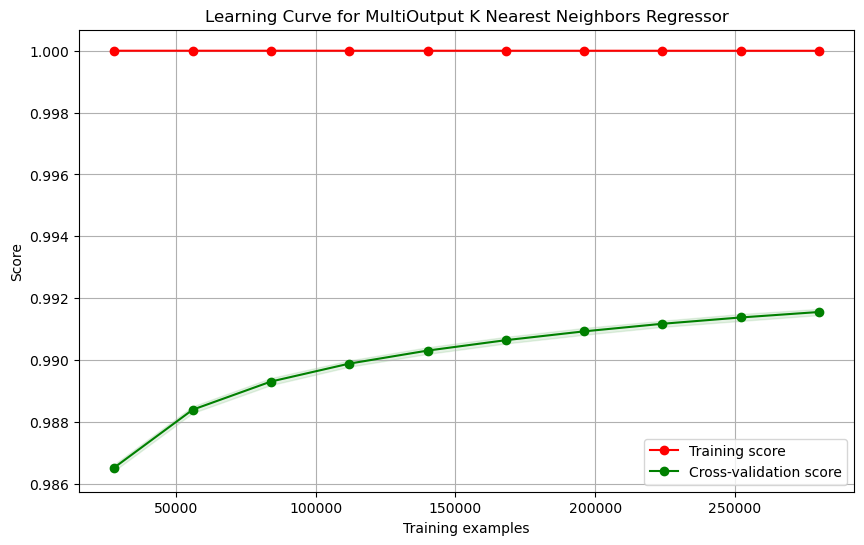

In [20]:
# Learning Curve of KNeighbors Regressor after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import learning_curve

# Define the best parameters
best_params = {
    'algorithm': 'auto',
    'leaf_size': 40,
    'n_neighbors': 9,
    'p': 1,
    'weights': 'distance'
}

# Initialize the K Nearest Neighbors Regressor with best parameters
knn_regressor = KNeighborsRegressor(**best_params)

# Initialize the MultiOutputRegressor with K Nearest Neighbors
multioutput_knn_regressor = MultiOutputRegressor(knn_regressor)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    multioutput_knn_regressor, X_train, y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1, random_state=42
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for MultiOutput K Nearest Neighbors Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

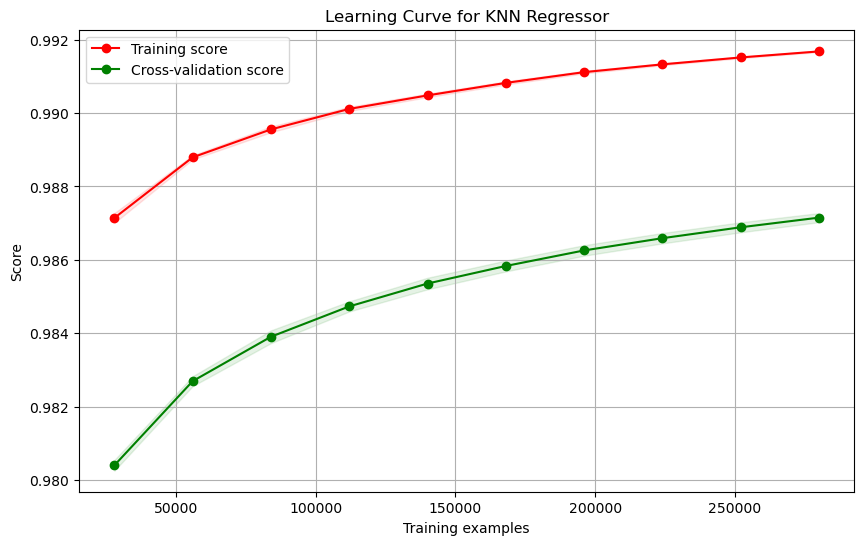

In [22]:
# Avoid overfitting by adjusting parameters

import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import learning_curve

# Initialize the K Nearest Neighbors Regressor with adjusted parameters
knn_regressor = KNeighborsRegressor(
    algorithm='auto',       
    leaf_size=50,           
    n_neighbors=5,          
    p=2,                    
    weights='uniform'       
)

# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    knn_regressor, X_train, y_train,
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, n_jobs=-1
)

# Calculate mean and standard deviation for training set scores and test set scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1,
                 color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
         label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
         label="Cross-validation score")
plt.title("Learning Curve for KNN Regressor")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.legend(loc="best")
plt.grid(True)
plt.show()

In [31]:
# Evaluate the adjusted parameter

from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Define the KNeighborsRegressor with the specified parameters
knn_regressor = KNeighborsRegressor(
    algorithm='auto',       
    leaf_size=50,           
    n_neighbors=5,          
    p=2,                    
    weights='uniform'       
)

# Fit the model using the training data
knn_regressor.fit(X_train, y_train)

# Predict on the test data
y_pred_knn = knn_regressor.predict(X_test)

# Calculate evaluation metrics
mae_knn = mean_absolute_error(y_test, y_pred_knn)
mse_knn = mean_squared_error(y_test, y_pred_knn)
rmse_knn = np.sqrt(mse_knn)
r2_knn = r2_score(y_test, y_pred_knn)

# Define a function to calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape_knn = mean_absolute_percentage_error(y_test, y_pred_knn)

# Print the evaluation metrics
print("Evaluation metrics for KNeighborsRegressor:")
print(f"Mean Absolute Error (MAE): {mae_knn}")
print(f"Mean Squared Error (MSE): {mse_knn}")
print(f"Root Mean Squared Error (RMSE): {rmse_knn}")
print(f"R-squared score: {r2_knn}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_knn}")

Evaluation metrics for KNeighborsRegressor:
Mean Absolute Error (MAE): 0.004988405260559976
Mean Squared Error (MSE): 5.0778624116270343e-05
Root Mean Squared Error (RMSE): 0.007125912160297118
R-squared score: 0.9876692198901489
Mean Absolute Percentage Error (MAPE): 0.008098098605357058


Polynomial Regression

In [21]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define the Mean Absolute Percentage Error (MAPE) function
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Define the degree of the polynomial features
degree = 2

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the Linear Regression model
linear_reg = LinearRegression()

# Create a pipeline that first transforms the data with polynomial features and then fits the model
pipeline = Pipeline([
    ('poly', poly),
    ('linear', linear_reg)
])

# Train the model on the training data
pipeline.fit(X_train, y_train)

# Make predictions on the test data
y_pred = pipeline.predict(X_test)

# Calculate MAE, MSE, RMSE, R-squared, and MAPE
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Print the evaluation metrics
print("Evaluation metrics for Polynomial Regression:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared score: {r2}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")


Evaluation metrics for Polynomial Regression:
Mean Absolute Error (MAE): 0.03051335935028342
Mean Squared Error (MSE): 0.0015669148496804592
Root Mean Squared Error (RMSE): 0.0395842752830017
R-squared score: 0.6703264886482853
Mean Absolute Percentage Error (MAPE): 0.053419902489839126


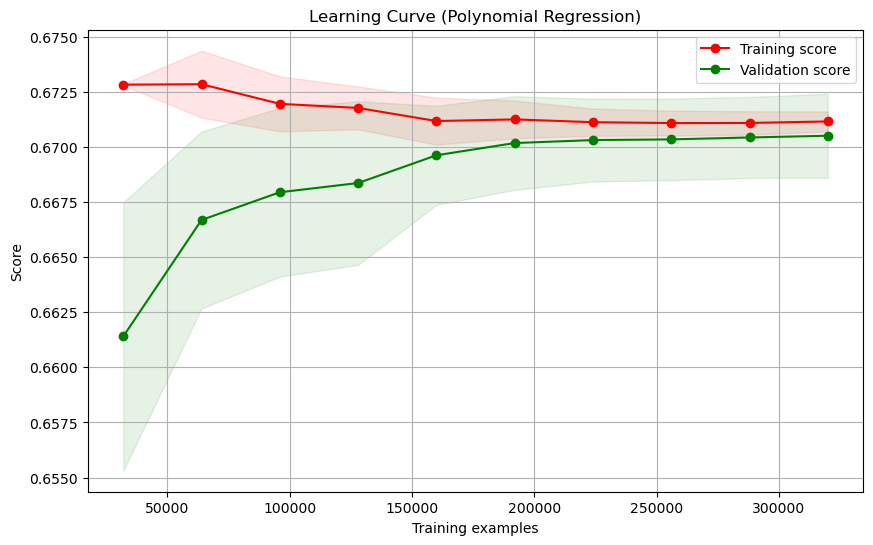

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve

# Define the degree of the polynomial features
degree = 2

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the Linear Regression model
linear_reg = LinearRegression()

# Create a pipeline that first transforms the data with polynomial features and then fits the model
pipeline = Pipeline([
    ('poly', poly),
    ('linear', linear_reg)
])

# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X_train, y_train, cv=5,
    train_sizes=np.linspace(0.1, 1.0, 10)
    # scoring='neg_mean_squared_error'
)

# Compute the mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10,6))
plt.title("Learning Curve (Polynomial Regression)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.grid(True)

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation score")

plt.legend(loc="best")
plt.show()

In [42]:
# Use Ridge Regularization and with Grid Search

import numpy as np
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define the Mean Absolute Percentage Error (MAPE) function with error handling
def mean_absolute_percentage_error(y_true, y_pred):
    # Avoid division by zero
    y_true_nonzero = np.where(y_true == 0, np.finfo(float).eps, y_true)
    return np.mean(np.abs((y_true - y_pred) / y_true_nonzero)) * 100

# Define the degree of the polynomial features and regularization parameter
degree = 2
alpha = 1.0  

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the Ridge Regression model
ridge_reg = Ridge(alpha=alpha)

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('poly', poly),
    ('ridge', ridge_reg)
])

# Train the model on the training data
pipeline.fit(X_train, y_train)

# Make predictions on the test data
y_pred = pipeline.predict(X_test)

# Calculate MAE, MSE, RMSE, R-squared, and MAPE
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

# Print the evaluation metrics
print("Evaluation metrics for Polynomial Regression with Feature Scaling and Ridge Regularization:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared score: {r2}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

# Cross-validation
cv_scores = cross_val_score(pipeline, X, y, cv=5, scoring='neg_mean_squared_error')
print(f"Cross-validated MSE: {-np.mean(cv_scores)}")

# Grid Search for hyperparameter tuning
param_grid = {
    'poly__degree': [1, 2, 3],
    'ridge__alpha': [0.1, 1, 10]
}
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X, y)

# Best estimator from Grid Search
best_pipeline = grid_search.best_estimator_

# Make predictions using the best model from Grid Search
y_pred_best = best_pipeline.predict(X_test)

# Calculate MAE, MSE, RMSE, R-squared, and MAPE for the best model
mae_best = mean_absolute_error(y_test, y_pred_best)
mse_best = mean_squared_error(y_test, y_pred_best)
rmse_best = np.sqrt(mse_best)
r2_best = r2_score(y_test, y_pred_best)
mape_best = mean_absolute_percentage_error(y_test, y_pred_best)

print(f"\nBest parameters from Grid Search: {grid_search.best_params_}")
print(f"Best cross-validated MSE from Grid Search: {-grid_search.best_score_}")

# Print the best model evaluation metrics
print("\nEvaluation metrics for the best model from Grid Search:")
print(f"Mean Absolute Error (MAE): {mae_best}")
print(f"Mean Squared Error (MSE): {mse_best}")
print(f"Root Mean Squared Error (RMSE): {rmse_best}")
print(f"R-squared score: {r2_best}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_best}")

Evaluation metrics for Polynomial Regression with Feature Scaling and Ridge Regularization:
Mean Absolute Error (MAE): 0.030513427233856513
Mean Squared Error (MSE): 0.0015668989492624514
Root Mean Squared Error (RMSE): 0.039584074439886194
R-squared score: 0.6703304602072442
Mean Absolute Percentage Error (MAPE): 0.05341979310853814
Cross-validated MSE: 0.0015661160340054575

Best parameters from Grid Search: {'poly__degree': 3, 'ridge__alpha': 10}
Best cross-validated MSE from Grid Search: 0.0007955157948042543

Evaluation metrics for the best model from Grid Search:
Mean Absolute Error (MAE): 0.0199413023406513
Mean Squared Error (MSE): 0.0007660174213851358
Root Mean Squared Error (RMSE): 0.02767701973452228
R-squared score: 0.8315769017862114
Mean Absolute Percentage Error (MAPE): 0.034068197608714726


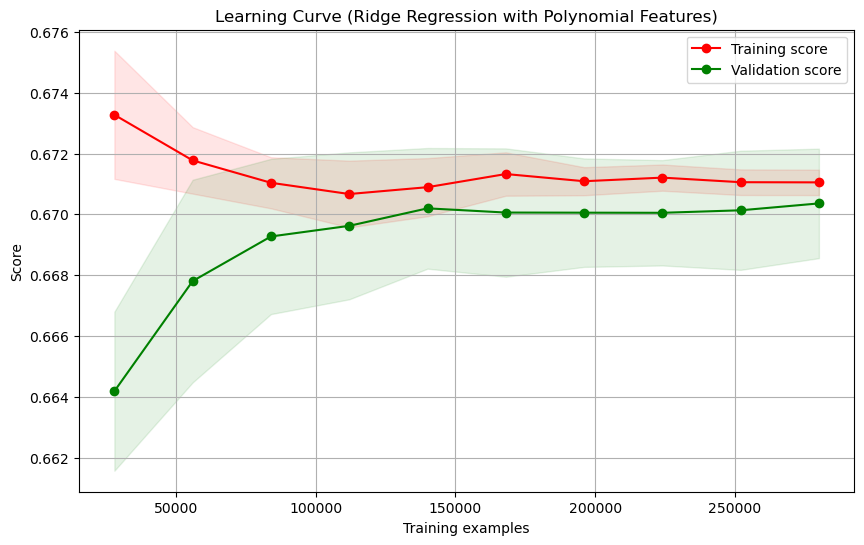

In [48]:
# Learning curve of Ridge polynomial base model 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve

# Define the degree of the polynomial features and Ridge alpha parameter
degree = 2
alpha = 1.0

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the Ridge Regression model with alpha parameter
ridge_reg = Ridge(alpha=alpha)

# Create a pipeline that first scales the data, transforms it with polynomial features, and then fits the Ridge model
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('poly', poly),
    ('ridge', ridge_reg)
])

# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X_train, y_train, cv=5,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Compute the mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10, 6))
plt.title("Learning Curve (Ridge Regression with Polynomial Features)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.grid(True)

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation score")

plt.legend(loc="best")
plt.show()

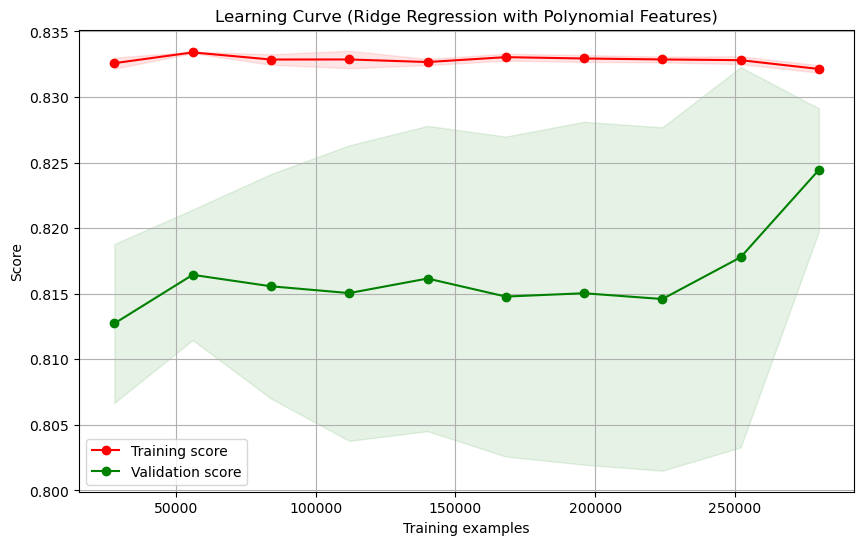

In [7]:
# Learning curve of Ridge polynomial after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import learning_curve

# Define the degree of the polynomial features and Ridge alpha parameter
degree = 3
alpha = 10

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the Ridge Regression model with alpha parameter
ridge_reg = Ridge(alpha=alpha)

# Create a column transformer that scales features
preprocessor = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), X_train.columns)
    ]
)

# Create a pipeline that first scales the data, then transforms it with polynomial features, and finally fits the Ridge model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('poly', poly),
    ('ridge', ridge_reg)
])

# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X_train, y_train, cv=5,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Compute the mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10,6))
plt.title("Learning Curve (Ridge Regression with Polynomial Features)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.grid(True)

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation score")

plt.legend(loc="best")
plt.show()

In [36]:
# Use Lasso Regularization and with Grid Search

from sklearn.linear_model import Lasso

# Initialize the Lasso Regression model
lasso_reg = Lasso(alpha=alpha)

# Create a pipeline 
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('poly', poly),
    ('lasso', lasso_reg)
])

# Train and evaluate the model as before
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print("Evaluation metrics for Polynomial Regression with Lasso Regularization:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared score: {r2}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

# Grid Search for Lasso
param_grid = {
    'poly__degree': [1, 2, 3],
    'lasso__alpha': [0.1, 1, 10]
}
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X, y)

# Best estimator and metrics
best_pipeline = grid_search.best_estimator_
y_pred_best = best_pipeline.predict(X_test)

mae_best = mean_absolute_error(y_test, y_pred_best)
mse_best = mean_squared_error(y_test, y_pred_best)
rmse_best = np.sqrt(mse_best)
r2_best = r2_score(y_test, y_pred_best)
mape_best = mean_absolute_percentage_error(y_test, y_pred_best)

print(f"\nBest parameters from Grid Search: {grid_search.best_params_}")
print(f"Best cross-validated MSE from Grid Search: {-grid_search.best_score_}")

print("\nEvaluation metrics for the best Lasso model from Grid Search:")
print(f"Mean Absolute Error (MAE): {mae_best}")
print(f"Mean Squared Error (MSE): {mse_best}")
print(f"Root Mean Squared Error (RMSE): {rmse_best}")
print(f"R-squared score: {r2_best}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_best}")

Evaluation metrics for Polynomial Regression with Lasso Regularization:
Mean Absolute Error (MAE): 0.061496951265292206
Mean Squared Error (MSE): 0.005441862665989661
Root Mean Squared Error (RMSE): 0.07376898173344716
R-squared score: -4.6691330460868485e-06
Mean Absolute Percentage Error (MAPE): 0.11701980473289994

Best parameters from Grid Search: {'lasso__alpha': 0.1, 'poly__degree': 3}
Best cross-validated MSE from Grid Search: 0.005274965723926906

Evaluation metrics for the best Lasso model from Grid Search:
Mean Absolute Error (MAE): 0.06055099450569091
Mean Squared Error (MSE): 0.0052739328887026525
Root Mean Squared Error (RMSE): 0.07262184856296797
R-squared score: 0.022662290840897492
Mean Absolute Percentage Error (MAPE): 0.11476043247940135


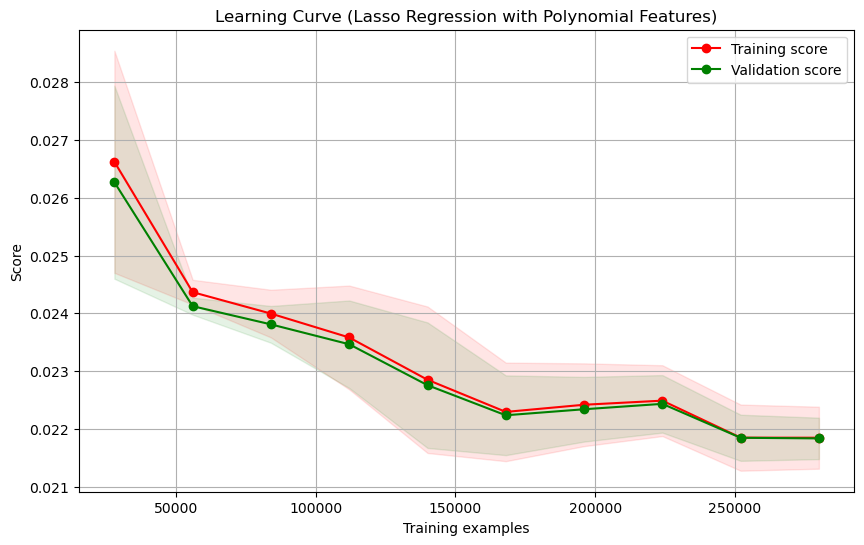

In [8]:
# Learning curve of Lasso polynomial after tuning

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline
from sklearn.model_selection import learning_curve

# Define the degree of the polynomial features and Lasso alpha parameter
degree = 3
alpha = 0.1

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the Lasso Regression model with alpha parameter
lasso_reg = Lasso(alpha=alpha, max_iter=100000)  # Increased number of iterations

# Create a pipeline that first scales the features, then transforms with polynomial features, and fits the Lasso model
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # Feature scaling
    ('poly', poly),
    ('lasso', lasso_reg)
])

# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X_train, y_train, cv=5,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Compute the mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10,6))
plt.title("Learning Curve (Lasso Regression with Polynomial Features)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.grid(True)

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation score")

plt.legend(loc="best")
plt.show()

In [37]:
# Use Elastic Net Regularization and with Grid Search

from sklearn.linear_model import ElasticNet

# Initialize the ElasticNet Regression model
elastic_net_reg = ElasticNet(alpha=alpha, l1_ratio=0.5)                 # l1_ratio is a parameter between 0 (Ridge) and 1 (Lasso)

# Create a pipeline 
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('poly', poly),
    ('elastic_net', elastic_net_reg)
])

# Train and evaluate the model as before
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print("Evaluation metrics for Polynomial Regression with ElasticNet Regularization:")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared score: {r2}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

# Grid Search for ElasticNet
param_grid = {
    'poly__degree': [1, 2, 3],
    'elastic_net__alpha': [0.1, 1, 10],
    'elastic_net__l1_ratio': [0.1, 0.5, 0.9]
}
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X, y)

# Best estimator and metrics
best_pipeline = grid_search.best_estimator_
y_pred_best = best_pipeline.predict(X_test)

mae_best = mean_absolute_error(y_test, y_pred_best)
mse_best = mean_squared_error(y_test, y_pred_best)
rmse_best = np.sqrt(mse_best)
r2_best = r2_score(y_test, y_pred_best)
mape_best = mean_absolute_percentage_error(y_test, y_pred_best)

print(f"\nBest parameters from Grid Search: {grid_search.best_params_}")
print(f"Best cross-validated MSE from Grid Search: {-grid_search.best_score_}")

print("\nEvaluation metrics for the best ElasticNet model from Grid Search:")
print(f"Mean Absolute Error (MAE): {mae_best}")
print(f"Mean Squared Error (MSE): {mse_best}")
print(f"Root Mean Squared Error (RMSE): {rmse_best}")
print(f"R-squared score: {r2_best}")
print(f"Mean Absolute Percentage Error (MAPE): {mape_best}")

Evaluation metrics for Polynomial Regression with ElasticNet Regularization:
Mean Absolute Error (MAE): 0.061496951265292206
Mean Squared Error (MSE): 0.005441862665989661
Root Mean Squared Error (RMSE): 0.07376898173344716
R-squared score: -4.6691330460868485e-06
Mean Absolute Percentage Error (MAPE): 0.11701980473289994

Best parameters from Grid Search: {'elastic_net__alpha': 0.1, 'elastic_net__l1_ratio': 0.1, 'poly__degree': 3}
Best cross-validated MSE from Grid Search: 0.0022391642415582626

Evaluation metrics for the best ElasticNet model from Grid Search:
Mean Absolute Error (MAE): 0.03618899714273209
Mean Squared Error (MSE): 0.0022276753837315918
Root Mean Squared Error (RMSE): 0.0471982561513833
R-squared score: 0.5326284250175276
Mean Absolute Percentage Error (MAPE): 0.06321581643967776


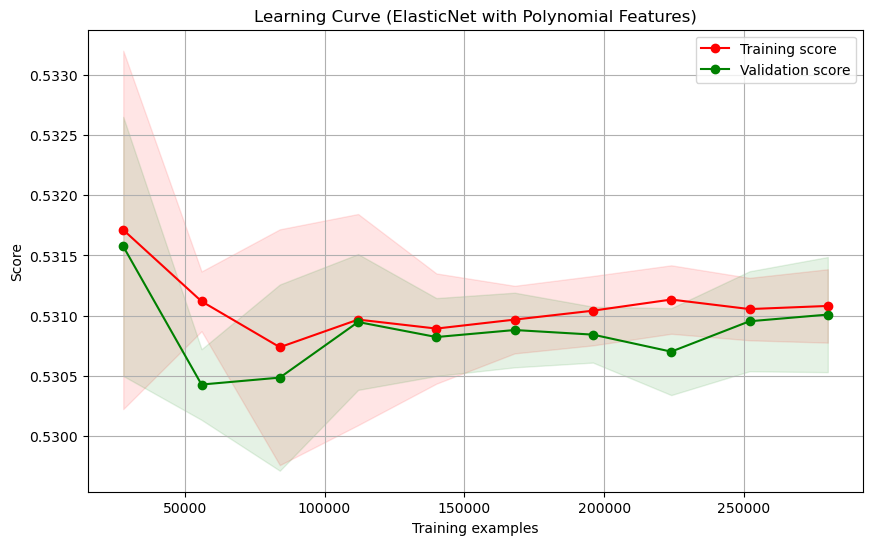

In [6]:
# Learning curve of Elastic Net polynomial after tuning

import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import learning_curve

# Define the best parameters
degree = 3
alpha = 0.1
l1_ratio = 0.1

# Create polynomial features
poly = PolynomialFeatures(degree=degree, include_bias=False)

# Initialize the ElasticNet model with the specified parameters
elastic_net = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=100000)

# Create a column transformer that scales features
preprocessor = ColumnTransformer(
    transformers=[
        ('scaler', StandardScaler(), X_train.columns)
    ]
)

# Create a pipeline that first scales the data, then transforms it with polynomial features, and finally fits the ElasticNet model
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('poly', poly),
    ('elastic_net', elastic_net)
])

# Generate learning curves
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X_train, y_train, cv=5,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Compute the mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10,6))
plt.title("Learning Curve (ElasticNet with Polynomial Features)")
plt.xlabel("Training examples")
plt.ylabel("Score")
plt.grid(True)

plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Validation score")

plt.legend(loc="best")
plt.show()

# Model Deployment

In [ ]:
# Save the encoded into pickle

import pickle

# Define the path where you want to save the file
encoded_cols_path = 'C://Users//berni//OneDrive//Desktop//FYP Coding'

# Save the dictionary to a file
with open(encoded_cols_path, 'wb') as file:
    pickle.dump(encoded_cols, file)

## Arrest - AdaBoost

In [10]:
X = df[['Location Description', 'Domestic', 'Beat','District','Ward','Community Area','Day','Month','Day_of_Week','Hour','Time_of_Day']]
y = df['Arrest']

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape (X_train, y_train):", X_train.shape, y_train.shape)
print("Testing set shape (X_test, y_test):", X_test.shape, y_test.shape)

Training set shape (X_train, y_train): (350000, 11) (350000,)
Testing set shape (X_test, y_test): (150000, 11) (150000,)


In [11]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [13]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# Initialize the base estimator
base_estimator = DecisionTreeClassifier(max_depth=3)

# Initialize the AdaBoost classifier with the specified parameters
ada_clf = AdaBoostClassifier(
    estimator=base_estimator,
    n_estimators=150,
    learning_rate=1.0,
    random_state=42
)

# Train the model using the resampled training data
ada_clf.fit(X_train_resampled, y_train_resampled)

c:\Users\berni\anaconda3\Lib\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3),
                   n_estimators=150, random_state=42)

In [14]:
import os
import pickle

save_path = 'C://Users//berni//OneDrive//Desktop//FYP Coding'
 
os.makedirs(save_path, exist_ok=True)
 
with open(os.path.join(save_path, 'arrest.pkl'), 'wb') as f:
    pickle.dump(ada_clf, f)

## Category - CatBoost

In [18]:
X = df[['Location Description', 'Domestic', 'Beat','District','Ward','Community Area','Day','Month','Day_of_Week','Hour','Time_of_Day', 'Arrest']]
y = df['Category']

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape (X_train, y_train):", X_train.shape, y_train.shape)
print("Testing set shape (X_test, y_test):", X_test.shape, y_test.shape)

Training set shape (X_train, y_train): (350000, 12) (350000,)
Testing set shape (X_test, y_test): (150000, 12) (150000,)


In [19]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [20]:
from catboost import CatBoostClassifier

# Build the CatBoost model with specified parameters
catboost_params = {'learning_rate': 0.05, 'l2_leaf_reg': 3, 'iterations': 1200, 'depth': 10}
catboost_model = CatBoostClassifier(**catboost_params, random_state=42, verbose=100)
catboost_model.fit(X_train_resampled, y_train_resampled)

0:	learn: 1.3388857	total: 599ms	remaining: 11m 58s
100:	learn: 0.8300566	total: 34.4s	remaining: 6m 13s
200:	learn: 0.8021428	total: 1m 22s	remaining: 6m 52s
300:	learn: 0.7852045	total: 2m 11s	remaining: 6m 33s
400:	learn: 0.7722733	total: 2m 48s	remaining: 5m 35s
500:	learn: 0.7613408	total: 3m 35s	remaining: 5m
600:	learn: 0.7514460	total: 4m 23s	remaining: 4m 22s
700:	learn: 0.7422525	total: 4m 57s	remaining: 3m 31s
800:	learn: 0.7336564	total: 5m 55s	remaining: 2m 56s
900:	learn: 0.7253454	total: 6m 27s	remaining: 2m 8s
1000:	learn: 0.7176297	total: 7m 27s	remaining: 1m 28s
1100:	learn: 0.7105941	total: 8m 30s	remaining: 45.9s
1199:	learn: 0.7040367	total: 9m 25s	remaining: 0us


In [21]:
save_path = 'C://Users//berni//OneDrive//Desktop//FYP Coding'
 
os.makedirs(save_path, exist_ok=True)
 
with open(os.path.join(save_path, 'category.pkl'), 'wb') as f:
    pickle.dump(catboost_model, f)

## Spatial - Random Forest Regressor

In [32]:
X = df[['Location Description', 'Domestic', 'Beat','District','Ward','Community Area','Day','Month','Day_of_Week','Hour','Time_of_Day', 'Arrest','Category']]
y = df[['Latitude', 'Longitude']]

# Split the data into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Display the shapes of the resulting datasets
print("Training set shape (X_train, y_train):", X_train.shape, y_train.shape)
print("Testing set shape (X_test, y_test):", X_test.shape, y_test.shape)

Training set shape (X_train, y_train): (350000, 13) (350000, 2)
Testing set shape (X_test, y_test): (150000, 13) (150000, 2)


In [33]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np

rf_regressor = RandomForestRegressor(
    max_depth=20,
    min_samples_leaf=1,
    min_samples_split=10,
    n_estimators=200,
    random_state=42
)

# Fit the model on the training data
rf_regressor.fit(X_train, y_train)

RandomForestRegressor(max_depth=20, min_samples_split=10, n_estimators=200,
                      random_state=42)

In [34]:
save_path = 'C://Users//berni//OneDrive//Desktop//FYP Coding'
 
os.makedirs(save_path, exist_ok=True)
 
with open(os.path.join(save_path, 'spatial.pkl'), 'wb') as f:
    pickle.dump(rf_regressor, f)